# Problem Statement

## Business Understanding

You work for a consumer finance company which specialises in lending various types of loans to urban customers. When the company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:

If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company

If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company

The data given below contains information about past loan applicants and whether they ‘defaulted’ or not. The aim is to identify patterns which indicate if a person is likely to default, which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc.

In this case study, you will use EDA to understand how consumer attributes and loan attributes influence the tendency of default.

When a person applies for a loan, there are two types of decisions that could be taken by the company:

Loan accepted: If the company approves the loan, there are 3 possible scenarios described below:

* Fully paid: Applicant has fully paid the loan (the principal and the interest rate)

* Current: Applicant is in the process of paying the instalments, i.e. the tenure of the loan is not yet completed. These candidates are not labelled as 'defaulted'.

* Charged-off: Applicant has not paid the instalments in due time for a long period of time, i.e. he/she has defaulted on the loan 

Loan rejected: The company had rejected the loan (because the candidate does not meet their requirements etc.). Since the loan was rejected, there is no transactional history of those applicants with the company and so this data is not available with the company (and thus in this dataset)

## Business Objectives

This company is the largest online loan marketplace, facilitating personal loans, business loans, and financing of medical procedures. Borrowers can easily access lower interest rate loans through a fast online interface. 

Like most other lending companies, lending loans to ‘risky’ applicants is the largest source of financial loss (called credit loss). Credit loss is the amount of money lost by the lender when the borrower refuses to pay or runs away with the money owed. In other words, borrowers who default cause the largest amount of loss to the lenders. In this case, the customers labelled as 'charged-off' are the 'defaulters'. 

If one is able to identify these risky loan applicants, then such loans can be reduced thereby cutting down the amount of credit loss. Identification of such applicants using EDA is the aim of this case study.

In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment. 

To develop your understanding of the domain, you are advised to independently research a little about risk analytics (understanding the types of variables and their significance should be enough).

In [186]:
#import statements for numpy, pandas and datetime library
import numpy as np
import pandas as pd
from datetime import datetime

In [187]:
#uncomment the below line to see the different library version
#pip list

In [188]:
#Loading the loan dataset into a dataframe
df = pd.read_csv('loan.csv')

In [189]:
#Loading the loan dictionary into a dataframe
df_dict = pd.read_excel('Data_Dictionary.xlsx')

## Data Understanding

In [190]:
#lets remove the last 2 unwanted row from the data dictionary
df_dict = df_dict[:-2]

In [191]:
#lets view the data dictionary
df_dict

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower i...
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan...
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by th...
...,...,...
110,total_rev_hi_lim,Total revolving high credit/credit limit
111,url,URL for the LC page with listing data.
112,verification_status,"Indicates if income was verified by LC, not ve..."
113,verified_status_joint,Indicates if the co-borrowers' joint income wa...


In [192]:
#lets see the dimensions i.e. number of rows and columns of the loan dataset
df.shape

(39717, 111)

In [193]:
# Lets get some more information about the dataset using info() and describe() methods
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [194]:
df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


We can see that their are 74 float, 12 integer and 24 object dtype columns.

We can see the count, mean, standard deviation, min, max and different quantile of the int and float columns

In [195]:
#The 'verification_status_joint' column name does not match the one in data dictionary
#lets rename the verification_status_joint to verified_status_joint
df.rename(columns = {'verification_status_joint':'verified_status_joint'},inplace = True)

In [196]:
#Few columns have extra spaces as the end in the data dictionary
#lets trim these spaces
df_dict.LoanStatNew = df_dict.LoanStatNew.apply(lambda x : x.strip())

In [197]:
#Lets go through each column and understand the dtype and number of null values
for col in df.columns:
    print("Name : ",col)
    print("Type : ",df[col].dtype)
    print("Description : ",df_dict[df_dict.LoanStatNew == col].iloc[0,1])
    print("Number of null values : ",df[col].isnull().mean()*100,"%")
    print("-----------------------------------------------")

Name :  id
Type :  int64
Description :  A unique LC assigned ID for the loan listing.
Number of null values :  0.0 %
-----------------------------------------------
Name :  member_id
Type :  int64
Description :  A unique LC assigned Id for the borrower member.
Number of null values :  0.0 %
-----------------------------------------------
Name :  loan_amnt
Type :  int64
Description :  The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.
Number of null values :  0.0 %
-----------------------------------------------
Name :  funded_amnt
Type :  int64
Description :  The total amount committed to that loan at that point in time.
Number of null values :  0.0 %
-----------------------------------------------
Name :  funded_amnt_inv
Type :  float64
Description :  The total amount committed by investors for that loan at that point in time.
Number of null values :  0.0 %
-------

Number of null values :  0.1409975577208752 %
-----------------------------------------------
Name :  delinq_amnt
Type :  int64
Description :  The past-due amount owed for the accounts on which the borrower is now delinquent.
Number of null values :  0.0 %
-----------------------------------------------
Name :  mo_sin_old_il_acct
Type :  float64
Description :  Months since oldest bank installment account opened
Number of null values :  100.0 %
-----------------------------------------------
Name :  mo_sin_old_rev_tl_op
Type :  float64
Description :  Months since oldest revolving account opened
Number of null values :  100.0 %
-----------------------------------------------
Name :  mo_sin_rcnt_rev_tl_op
Type :  float64
Description :  Months since most recent revolving account opened
Number of null values :  100.0 %
-----------------------------------------------
Name :  mo_sin_rcnt_tl
Type :  float64
Description :  Months since most recent account opened
Number of null values :  100.0 %

## Data Cleaning
There are various types of quality issues when it comes to data, and that’s why data cleaning is one of the
most time-consuming steps of data analysis.

### Fixing Columns
Checklist for Fixing Columns

* Merge columns for creating unique identifiers if needed: E.g. Merge State, City into Full address
* Split columns for more data: Split address to get State and City to analyse each separately
* Add column names: Add column names if missing
* Rename columns consistently: Abbreviations, encoded columns
* Delete columns: Delete unnecessary columns
* Align misaligned columns: Dataset may have shifted columns

Deleting unnecessary columns

In [198]:
#As we can see that their are multiple columns with all null/NA value
#Lets drop all columns which have only null/NA values
for col in df.columns:
    if df[col].isnull().mean() == 1:
        print("Droping ",col)
        df.drop(col,axis=1,inplace=True)
df.shape

Droping  mths_since_last_major_derog
Droping  annual_inc_joint
Droping  dti_joint
Droping  verified_status_joint
Droping  tot_coll_amt
Droping  tot_cur_bal
Droping  open_acc_6m
Droping  open_il_6m
Droping  open_il_12m
Droping  open_il_24m
Droping  mths_since_rcnt_il
Droping  total_bal_il
Droping  il_util
Droping  open_rv_12m
Droping  open_rv_24m
Droping  max_bal_bc
Droping  all_util
Droping  total_rev_hi_lim
Droping  inq_fi
Droping  total_cu_tl
Droping  inq_last_12m
Droping  acc_open_past_24mths
Droping  avg_cur_bal
Droping  bc_open_to_buy
Droping  bc_util
Droping  mo_sin_old_il_acct
Droping  mo_sin_old_rev_tl_op
Droping  mo_sin_rcnt_rev_tl_op
Droping  mo_sin_rcnt_tl
Droping  mort_acc
Droping  mths_since_recent_bc
Droping  mths_since_recent_bc_dlq
Droping  mths_since_recent_inq
Droping  mths_since_recent_revol_delinq
Droping  num_accts_ever_120_pd
Droping  num_actv_bc_tl
Droping  num_actv_rev_tl
Droping  num_bc_sats
Droping  num_bc_tl
Droping  num_il_tl
Droping  num_op_rev_tl
Droping  

(39717, 57)

In [199]:
#Few columns have more than 90% missing data lets drop these columns too due to too little data
for col in df.columns:
    if df[col].isnull().mean()*100 >= 90:
        print("Droping ",col)
        df.drop(col,axis=1,inplace=True)
df.shape

Droping  mths_since_last_record
Droping  next_pymnt_d


(39717, 55)

We can see 56 columns in total have removed due all or large amount of missing data

Lets look at some of the columns which have same data throughout the dataset

In [200]:
#lets drop these columns as they will have no impact on the analysis
for col in df.columns:
    if df[col].value_counts().count() == 1:
        print("Droping ",col)
        df.drop(col,axis=1,inplace=True)
df.shape

Droping  pymnt_plan
Droping  initial_list_status
Droping  collections_12_mths_ex_med
Droping  policy_code
Droping  application_type
Droping  acc_now_delinq
Droping  chargeoff_within_12_mths
Droping  delinq_amnt
Droping  tax_liens


(39717, 46)

As we can see that the member_id is unique LC assigned Id for the borrower member and is of no use to dataset.

Also we have loan id to identify rows uniquely, so lets drop member_id column

In [201]:
df.drop("member_id",axis=1,inplace=True)

The customer behavior variables are not available at the time of loan application, and thus they cannot be used as predictors for credit approval.

Variables such as acc_now_delinquent, chargeoff within 12 months etc. (which are related to the applicant's past loans) are available from the credit bureau.


In [202]:
str1 = "delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d"
list_of_behaviour_columns = str1.split(',')
list_of_behaviour_columns

['delinq_2yrs',
 'earliest_cr_line',
 'inq_last_6mths',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'out_prncp',
 'out_prncp_inv',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'last_pymnt_d',
 'last_pymnt_amnt',
 'last_credit_pull_d']

In [203]:
for col in list_of_behaviour_columns:
    print("Droping ",col,df_dict[df_dict.LoanStatNew == col].iloc[0,1])
    df.drop(col,axis=1,inplace=True)
df.shape

Droping  delinq_2yrs The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years
Droping  earliest_cr_line The month the borrower's earliest reported credit line was opened
Droping  inq_last_6mths The number of inquiries in past 6 months (excluding auto and mortgage inquiries)
Droping  open_acc The number of open credit lines in the borrower's credit file.
Droping  pub_rec Number of derogatory public records
Droping  revol_bal Total credit revolving balance
Droping  revol_util Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
Droping  total_acc The total number of credit lines currently in the borrower's credit file
Droping  out_prncp Remaining outstanding principal for total amount funded
Droping  out_prncp_inv Remaining outstanding principal for portion of total amount funded by investors
Droping  total_pymnt Payments received to date for total amount funded
Dropi

(39717, 25)

### Fixing Rows
Checklist for Fixing Rows:
    
* Delete summary rows: Total, Subtotal rows
* Delete incorrect rows: Header rows, Footer rows
* Delete extra rows: Column number, indicators, Blank rows, Page No.

In [204]:
df.isnull().sum(axis=1).value_counts()

1    21475
2     8843
0     8261
3      849
4      289
dtype: int64

From the above output we can see that in each row there are not more than 4 missing values out of 25 values

Hence no need of droping the rows will try to fill them

### Fix Missing Values
* Set values as missing values: Identify values that indicate missing data, and yet are not recognised by the software as such, e.g treat blank strings, "NA", "XX", "999", etc. as missing.  
* Adding is good, exaggerating is bad: You should try to get information from reliable external sources as much as possible, but if you can’t, then it is better to keep missing values as such rather than exaggerating the existing rows/columns.  
* Delete rows, columns: Rows could be deleted if the number of missing values are insignificant in number, as this would not impact the analysis. Columns could be removed if the missing values are quite significant in number.
* Fill partial missing values using business judgement: Missing time zone, century, etc. These values are easily identifiable.

We have already deleted all the columns having more that 90% missing data

In [205]:
#lets look at columns with less than 1% missing data
for col in df.columns:
    if df[col].isnull().sum() > 0 and df[col].isnull().mean()*100 <= 5:
        print("Name :",col)
        print("Type :",df[col].dtype)
        print("Description : ",df_dict[df_dict.LoanStatNew == col].iloc[0,1])
        print("Number of null values :",df[col].isnull().sum())
        print("Percent of missing values : ",df[col].isnull().mean()*100)
        print("----------------------------------------------")

Name : emp_length
Type : object
Description :  Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 
Number of null values : 1075
Percent of missing values :  2.7066495455346575
----------------------------------------------
Name : title
Type : object
Description :  The loan title provided by the borrower
Number of null values : 11
Percent of missing values :  0.027695948838029054
----------------------------------------------
Name : pub_rec_bankruptcies
Type : float64
Description :  Number of public record bankruptcies
Number of null values : 697
Percent of missing values :  1.7549160309187504
----------------------------------------------


We have these columns with less that 5% missing values:

* emp_length
* title
* pub_rec_bankruptcies

In [206]:
#lets remove the rows with less that 1% of the missing columns
for col in df.columns:
    if df[col].isnull().sum() > 0 and df[col].isnull().mean()*100 < 1:
        df = df[~df[col].isnull()]
        print("Removing rows where",col,"is null")

Removing rows where title is null


In [207]:
#lets have a look at the missing columns which are left
for col in df.columns:
    if df[col].isnull().sum() > 0:
        print("Name :",col)
        print("Type :",df[col].dtype)
        print("Number of null values :",df[col].isnull().sum())
        print("Percent of missing values : ",df[col].isnull().sum()/df.shape[0]*100)
        print("----------------------------------------------")

Name : emp_title
Type : object
Number of null values : 2457
Percent of missing values :  6.18798166523951
----------------------------------------------
Name : emp_length
Type : object
Number of null values : 1074
Percent of missing values :  2.704880874427039
----------------------------------------------
Name : desc
Type : object
Number of null values : 12935
Percent of missing values :  32.57694051276886
----------------------------------------------
Name : mths_since_last_delinq
Type : float64
Number of null values : 25675
Percent of missing values :  64.66277136956631
----------------------------------------------
Name : pub_rec_bankruptcies
Type : float64
Number of null values : 697
Percent of missing values :  1.755402206215685
----------------------------------------------


We have these columns with more that 1% missing values:

* emp_title
* emp_length
* desc
* mths_since_last_delinq
* pub_rec_bankruptcies

We cannot remove rows with the above missing values as it can remove crucial information/loss of huge data

lets try to impute these missing values

In [208]:
df.emp_title.value_counts()

US Army                            134
Bank of America                    109
IBM                                 66
AT&T                                59
Kaiser Permanente                   56
                                  ... 
AMEC                                 1
lee county sheriff                   1
Bacon County Board of Education      1
Hotpads                              1
Evergreen Center                     1
Name: emp_title, Length: 28814, dtype: int64

emp_title cannot be imputed with mode as all 2444 missing ones cannot be from "US Army"

Hence it better to fill these with string "others"

In [209]:
df.emp_title = df.emp_title.fillna("Other")

In [210]:
df.emp_length.value_counts()

10+ years    8878
< 1 year     4582
2 years      4388
3 years      4095
4 years      3434
5 years      3280
1 year       3239
6 years      2228
7 years      1772
8 years      1479
9 years      1257
Name: emp_length, dtype: int64

Similar to emp_title we cannot imputed emp_length

Hence it better to fill these with string "-1 years"

In [211]:
df.emp_length = df.emp_length.fillna("-1 years")

In [212]:
df.desc.value_counts()

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           210
Debt Consolidation                                                                                                                                                                       

desc also cannot be imputed with mode data as each borrower might have different description

Hence it better to fill these with string "missing description"

In [213]:
df.desc = df.desc.fillna("missing description")

In [214]:
df.mths_since_last_delinq.value_counts()

0.0      443
15.0     252
30.0     247
23.0     246
24.0     241
        ... 
89.0       1
107.0      1
85.0       1
97.0       1
95.0       1
Name: mths_since_last_delinq, Length: 95, dtype: int64

mths_since_last_delinq = The number of months since the borrower's last delinquency(minor crime).

Since other might not have commited crime and hence no data filled and cannot be removed from the data set

so lets fill these missing values with -1

In [215]:
df.mths_since_last_delinq = df.mths_since_last_delinq.fillna(-1)

In [216]:
df.pub_rec_bankruptcies.value_counts()

0.0    37328
1.0     1674
2.0        7
Name: pub_rec_bankruptcies, dtype: int64

Since majority of the values are 0 we can replave the missing values with mode

In [217]:
df.pub_rec_bankruptcies.mode()[0]

0.0

In [218]:
df.pub_rec_bankruptcies = df.pub_rec_bankruptcies.fillna(df.pub_rec_bankruptcies.mode()[0])

In [219]:
df.isnull().sum().sum()

0

As we can now see that thier are no missing values anymore

### Standardising Values
Checklist:
    
* Standardise units: Ensure all observations under a variable have a common and consistent unit, e.g. convert lbs to kgs, miles/hr to km/hr, etc.
    
* Scale values if required: Make sure the observations under a variable have a common scale
    
* Standardise precision for better presentation of data, e.g. 4.5312341 kgs to 4.53 kgs.
    
* Remove outliers: Remove high and low values that would disproportionately affect the results of your analysis.

#### Lets look at few of the columns in float

In [220]:
for col in df.columns:
    if df[col].dtype == float:
        print("Name :",col)
        print("Type :",df[col].dtype)
        print("value_counts :")
        print(df[col].value_counts())
        print("----------------------------------------------")

Name : funded_amnt_inv
Type : float64
value_counts :
5000.000000     1309
10000.000000    1274
6000.000000     1200
12000.000000    1069
8000.000000      899
                ... 
4944.213109        1
18400.281660       1
14659.820000       1
6294.151315        1
5985.317600        1
Name: funded_amnt_inv, Length: 8202, dtype: int64
----------------------------------------------
Name : installment
Type : float64
value_counts :
311.11     68
180.96     59
311.02     54
150.80     48
368.45     46
           ..
878.28      1
1224.46     1
63.44       1
157.67      1
255.43      1
Name: installment, Length: 15381, dtype: int64
----------------------------------------------
Name : annual_inc
Type : float64
value_counts :
60000.0    1505
50000.0    1056
40000.0     876
45000.0     829
30000.0     823
           ... 
56820.0       1
45314.0       1
53913.0       1
62880.0       1
27376.0       1
Name: annual_inc, Length: 5317, dtype: int64
----------------------------------------------
Name :

We can round of the following columns to 2 decimal points for easier understanding

In [221]:
for col in df.columns:
    if df[col].dtype == float:
        df[col] = df[col].round(2).apply(lambda x : float(x))
        print("Rounding column :",col)

Rounding column : funded_amnt_inv
Rounding column : installment
Rounding column : annual_inc
Rounding column : dti
Rounding column : mths_since_last_delinq
Rounding column : pub_rec_bankruptcies


In [222]:
# lets look at the columns with unique values and thier type
for col in df.columns:
    print("Name :",col)
    print("Type :",df[col].dtype)
    print("value_counts :")
    print(df[col].value_counts())
    print("----------------------------------------------")

Name : id
Type : int64
value_counts :
1077501    1
568659     1
566619     1
568768     1
568773     1
          ..
785696     1
785694     1
785670     1
785669     1
87023      1
Name: id, Length: 39706, dtype: int64
----------------------------------------------
Name : loan_amnt
Type : int64
value_counts :
10000    2832
12000    2334
5000     2051
6000     1907
15000    1895
         ... 
22875       1
8175        1
19475       1
21225       1
22550       1
Name: loan_amnt, Length: 885, dtype: int64
----------------------------------------------
Name : funded_amnt
Type : int64
value_counts :
10000    2740
12000    2244
5000     2040
6000     1897
15000    1784
         ... 
26250       1
24725       1
31750       1
22625       1
22350       1
Name: funded_amnt, Length: 1041, dtype: int64
----------------------------------------------
Name : funded_amnt_inv
Type : float64
value_counts :
5000.00     1309
10000.00    1274
6000.00     1200
12000.00    1069
8000.00      899
            .

100xx    597
945xx    545
112xx    516
606xx    503
070xx    473
        ... 
381xx      1
378xx      1
739xx      1
396xx      1
469xx      1
Name: zip_code, Length: 823, dtype: int64
----------------------------------------------
Name : addr_state
Type : object
value_counts :
CA    7098
NY    3811
FL    2864
TX    2726
NJ    1850
IL    1525
PA    1517
VA    1407
GA    1398
MA    1340
OH    1222
MD    1049
AZ     878
WA     840
CO     791
NC     788
CT     751
MI     720
MO     685
MN     614
NV     497
SC     472
WI     460
AL     452
OR     451
LA     436
KY     325
OK     298
KS     271
UT     258
AR     245
DC     214
RI     198
NM     189
WV     177
HI     174
NH     171
DE     114
MT      85
WY      83
AK      80
SD      64
VT      54
MS      19
TN      17
IN       9
ID       6
IA       5
NE       5
ME       3
Name: addr_state, dtype: int64
----------------------------------------------
Name : dti
Type : float64
value_counts :
0.00     183
12.00     51
18.00     45
19.20     40


Let try to convert data types of few columns

In [223]:
df.funded_amnt_inv.value_counts()

5000.00     1309
10000.00    1274
6000.00     1200
12000.00    1069
8000.00      899
            ... 
24209.37       1
24115.67       1
18760.59       1
19896.63       1
4765.31        1
Name: funded_amnt_inv, Length: 7937, dtype: int64

In [224]:
df.funded_amnt_inv = df.funded_amnt_inv.round(0).apply(lambda x : int(x))
df.funded_amnt_inv.value_counts()

5000     1310
10000    1275
6000     1200
12000    1069
8000      899
         ... 
12046       1
6774        1
11794       1
26575       1
11149       1
Name: funded_amnt_inv, Length: 6589, dtype: int64

In [225]:
#term column can be converted to integer
df.term.value_counts()

 36 months    29089
 60 months    10617
Name: term, dtype: int64

In [226]:
df.term = df.term.apply(lambda x: int(x.split()[0]))
df.term.value_counts()

36    29089
60    10617
Name: term, dtype: int64

In [227]:
#int_rate column can be converted to float
df.int_rate.value_counts()

10.99%    956
13.49%    826
11.49%    823
7.51%     787
7.88%     725
         ... 
18.36%      1
16.96%      1
16.15%      1
16.01%      1
17.44%      1
Name: int_rate, Length: 371, dtype: int64

In [228]:
df.int_rate = df.int_rate.apply(lambda x : float(x[:-1]) if x[-1]=="%" else float(x))
df.int_rate.value_counts()

10.99    956
13.49    826
11.49    823
7.51     787
7.88     725
        ... 
18.36      1
16.96      1
16.15      1
16.01      1
17.44      1
Name: int_rate, Length: 371, dtype: int64

In [229]:
#emp_title have a lot of issues with the string, lets try to resolve the top 50 - 100 string issues
df.emp_title.value_counts()

Other                              2458
US Army                             134
Bank of America                     109
IBM                                  66
AT&T                                 59
                                   ... 
lee county sheriff                    1
Bacon County Board of Education       1
Hotpads                               1
BCT PRINTING                          1
Evergreen Center                      1
Name: emp_title, Length: 28814, dtype: int64

In [230]:
df.emp_title = df.emp_title.apply(lambda x : x.strip().lower())
df.emp_title.value_counts()

other                                      2459
us army                                     212
bank of america                             138
at&t                                         83
walmart                                      82
                                           ... 
woodridge school district #68                 1
interquest northwest inc                      1
ryder logistics                               1
anaesthesia associates of massachusetts       1
evergreen center                              1
Name: emp_title, Length: 27204, dtype: int64

Lets look at the top 100 emp_titles and try to resolve the issue related to the string like us army and united state arrmy etc

In [231]:
for title in sorted(df.emp_title.value_counts().head(100).index):
    print(title)

accenture
adp
american airlines
american express
army
at&t
bae systems
bank of america
best buy
boeing
booz allen hamilton
chase
chase bank
cisco systems
citibank
citigroup
columbia university
comcast
costco
costco wholesale
csc
cvs pharmacy
department of defense
department of homeland security
department of justice
department of veterans affairs
federal aviation administration
fedex
fidelity investments
geico
general dynamics
general electric
hewlett packard
home depot
ibm
internal revenue service
jp morgan chase
jpmorgan chase
kaiser permanente
lockheed martin
lowes
macy's
macys
merrill lynch
microsoft
military
morgan stanley
morgan stanley smith barney
nordstrom
northrop grumman
nypd
oracle
other
pricewaterhousecoopers
raytheon
retired
saic
self
self employed
self-employed
social security administration
southwest airlines
sprint
state of california
t-mobile
target
the boeing company
the hartford
the home depot
thomson reuters
time warner cable
travelers insurance
u.s. air force
u.s.

In [232]:
print(df.emp_title.value_counts().head(50).sort_index())

accenture                            34
at&t                                 83
bank of america                     138
best buy                             37
booz allen hamilton                  36
citigroup                            27
comcast                              39
department of defense                44
department of homeland security      28
department of veterans affairs       25
fidelity investments                 35
general electric                     26
home depot                           47
ibm                                  69
jp morgan chase                      44
jpmorgan chase                       44
kaiser permanente                    69
lockheed martin                      49
merrill lynch                        25
morgan stanley                       29
northrop grumman                     35
other                              2459
pricewaterhousecoopers               24
raytheon                             25
retired                              33


In [233]:
#lets remove some of the common seperators
df.emp_title = df.emp_title.apply(lambda x : x.replace('.','').replace('-','').replace("'",''))

In [234]:
#These are some of the identified replacements for the top 100 emp_titles by frequency
#Due to time constraint I am not able to reslove the issues for rest of the data
values = {
    'self':'self employed',
    'wells fargo':'wells fargo bank',
    'usaf':'united states air force',
    'us air force':'united states air force',
    'air force':'united states air force',
    'ups':'united parcel service',
    'usps':'united states postal service',
    'us postal service':'united states postal service',
    'jp morgan chase':'jpmorgan chase',
    'selfemployed':'self employed',
    'us army':'united states army',
    'army':'united states army',
    'us navy':'united states navy',
    'us bank':'united states bank',
    'us coast guard':'united states coast guard',
    'us government':'united states government',
    'verizon':'verizon wireless',
    'usmc':'united states marine corps',
    'att':'at&t',
    'costco':'costco wholesale'
}
df.emp_title = df.emp_title.replace(values.keys(),values.values())

In [235]:
#emp_length column can be converted to int
df.emp_length.value_counts()

10+ years    8878
< 1 year     4582
2 years      4388
3 years      4095
4 years      3434
5 years      3280
1 year       3239
6 years      2228
7 years      1772
8 years      1479
9 years      1257
-1 years     1074
Name: emp_length, dtype: int64

In [236]:
def convert_emp_length_to_int(emp_length):
    arr = emp_length.split()
    if arr[0] == '<':
        return 0
    elif arr[0][-1] == '+':
        return 10
    else:
        return int(arr[0])

In [237]:
df.emp_length = df.emp_length.apply(convert_emp_length_to_int)
df.emp_length.value_counts()

 10    8878
 0     4582
 2     4388
 3     4095
 4     3434
 5     3280
 1     3239
 6     2228
 7     1772
 8     1479
 9     1257
-1     1074
Name: emp_length, dtype: int64

In [238]:
#lets convert the annual to int
df.annual_inc = df.annual_inc.apply(lambda x : int(round(x,0)))
df.annual_inc.value_counts()

60000    1505
50000    1057
40000     876
45000     829
30000     823
         ... 
63052       1
20496       1
91745       1
26886       1
27376       1
Name: annual_inc, Length: 5279, dtype: int64

In [239]:
#title have a lot of issues with the string, lets try to resolve the top 50 - 100 string issues
df.title = df.title.apply(lambda x : x.strip().lower())
df.title.value_counts()

debt consolidation                         3190
debt consolidation loan                    1915
personal loan                              1012
consolidation                               762
personal                                    567
                                           ... 
pay off that discover card                    1
small bussiness                               1
payoff 2nd to sell home and buy new one       1
no more wolves                                1
jal loan                                      1
Name: title, Length: 17426, dtype: int64

In [240]:
for title in sorted(df.title.value_counts().head(100).index):
    print(title)

auto
auto loan
bill consolidation
bills
boat
boat loan
business
business loan
car
car loan
cc consolidation
cc loan
cc payoff
cc refinance
consolidate
consolidate credit card debt
consolidate credit cards
consolidate debt
consolidation
consolidation loan
credit card
credit card consolidation
credit card consolidation loan
credit card debt
credit card debt consolidation
credit card loan
credit card pay off
credit card payoff
credit card payoff loan
credit card refi
credit card refinance
credit card refinance loan
credit card refinancing
credit cards
credit consolidation
debt
debt consol
debt consolidate
debt consolidation
debt consolidation loan
debt consolodation
debt free
debt loan
debt payoff
debt reduction
debt relief
debt_consolidation
engagement ring
freedom
freedom loan
fresh start
get out of debt
help
home
home improvement
home improvement loan
home improvements
home loan
house
house loan
lending club
lending club loan
loan
loan 1
loan consolidation
loan1
major purchase
major pu

In [241]:
#These are some of the identified replacements for the top 100 title by frequency
#Due to time constraint I am not able to reslove the issues for rest of the data
title_dict = {
    'auto loan':['auto','car loan','car','motorcycle','motorcycle loan','bike','truck','truck loan'],
    'bill consolidation':['bills'],
    'boat loan':['boat'],
    'business loan':['business','business expansion'],
    'credit card consolidation loan':['cc consolidation','credit_card','credit card payment','cards','cc debt','credit loan','cc loan','cc payoff','cc refinance','consolidate','consolidate credit card debt'',consolidate credit cards','consolidate debt','consolidation','consolidation loan','credit card','credit card consolidation','credit card debt','credit card debt consolidation','credit card loan','credit card pay off','credit card payoff','credit card payoff loan','credit card refi','credit card refinance','credit card refinance loan','credit card refinancing','credit cards','credit consolidation','card consolidation','cc','cc refi','consolidate bills','consolidate credit card debt','consolidate credit cards','consolidating credit card debt','consolidating debt','credit','credit card consolidation loan','credit refinance'],
    'debt consolidation loan':['debt','debt con','debt consol','debt consolidate','debt consolidation','debt consolodation','debt free','debt loan','debt payoff','debt reduction','debt relief','debt_consolidation','debit consolidation','debt consolidation 2011','debt consolidation loan','dept consolidation'],
    'financial freedom':['freedom loan','freedom'],
    'home improvement loan':['home','improvement','home improvment','home improvement','home improvements','home repairs','kitchen remodel'],
    'home loan':['house','house loan','roof','new roof','relocation loan'],
    'lending club loan':['lending club'],
    'loan':['loan 1','loan consolidation','loan1','other','other loan','my loan','loan 2','new loan'],
    'major purchase loan':['major purchase'],
    'medical loan':['medical','medical expenses','medical bills'],
    'personal loan':['my personal loan','personal'],
    'pay off debt':['pay off','payoff loan','pay off credit card debt','payoff credit cards','pay off bills','pay it off','pay off credit card','pay off credit cards','paying off credit cards','payoff','pay bills'],
    'pool loan':['pool','swimming pool'],
    'small business loan':['small business','small_business loan'],
    'vacation loan':['vacation'],
    'wedding loan':['wedding','wedding expenses'],
    'moving loan':['moving','moving expenses'],
    'car repair':['car repairs']
}
for key in title_dict:
    value = title_dict.get(key)
    df.title = df.title.replace(value,[key for i in value])

In [242]:
#mths_since_last_delinq can be converted in int as months cannot be floating numbers
df.mths_since_last_delinq = df.mths_since_last_delinq.apply(lambda x : int(x))
df.mths_since_last_delinq.value_counts()

-1      25675
 0        443
 15       252
 30       247
 23       246
        ...  
 89         1
 107        1
 85         1
 97         1
 95         1
Name: mths_since_last_delinq, Length: 96, dtype: int64

In [243]:
#pub_rec_bankruptcies can be converted in int as it cannot be floating numbers
df.pub_rec_bankruptcies = df.pub_rec_bankruptcies.apply(lambda x : int(x))
df.pub_rec_bankruptcies.value_counts()

0    38025
1     1674
2        7
Name: pub_rec_bankruptcies, dtype: int64

In [244]:
#zip_code column can be converted to int
df.zip_code.value_counts()

100xx    597
945xx    545
112xx    516
606xx    503
070xx    473
        ... 
381xx      1
378xx      1
739xx      1
396xx      1
469xx      1
Name: zip_code, Length: 823, dtype: int64

In [245]:
df.zip_code = df.zip_code.apply(lambda x : int(x[:3]) if x[-2:] == "xx" else int(x))
df.zip_code.value_counts()

100    597
945    545
112    516
606    503
70     473
      ... 
381      1
378      1
739      1
396      1
469      1
Name: zip_code, Length: 823, dtype: int64

### Fixing Invalid Values
A data set can contain invalid values in various forms. Some of the values could be truly invalid, e.g. a string “tr8ml”
in a variable containing mobile numbers would make no sense and hence would be better removed. Similarly, a
height of 11 ft would be an invalid value in a set containing heights of children.

On the other hand, some invalid values can be corrected. E.g. a numeric value with a data type of string could be
converted to its original numeric type. Issues might arise due to R misinterpreting the encoding of a file, thus
showing junk characters where there were valid characters. This could be corrected by correctly specifying the
encoding or converting the data set to the accurate format before importing.

* Encode unicode properly: In case the data is being read as junk characters, try to change encoding, E.g. CP1252 instead of UTF-8.

* Convert incorrect data types: Correct the incorrect data types to the correct data types for ease of analysis. E.g. if numeric values are stored as strings, it would not be possible to calculate metrics such as mean, median, etc. Some of the common data type corrections are — string to number: "12,300" to “12300”; string to date: "2013-Aug" to “2013/08”; number to string: “PIN Code 110001” to "110001"; etc.

* Correct values that go beyond range: If some of the values are beyond logical range, e.g. temperature less than -273° C (0° K), you would need to correct them as required. A close look would help you check if there is scope for correction, or if the value needs to be removed.

* Correct values not in the list: Remove values that don’t belong to a list. E.g. In a data set containing blood groups of individuals, strings “E” or “F” are invalid values and can be removed.

* Correct wrong structure: Values that don’t follow a defined structure can be removed. E.g. In a data set containing pin codes of Indian cities, a pin code of 12 digits would be an invalid value and needs to be removed. Similarly, a phone number of 12 digits would be an invalid value.

* Validate internal rules: If there are internal rules such as a date of a product’s delivery must definitely be after the date of the order, they should be correct and consistent.

In [246]:
for col in df.columns:
    print("Name :",col)
    print("Type :",df[col].dtype)
    print("Number of null values :",df[col].isnull().sum())
    print("value_counts :")
    print(df[col].value_counts())
    print("----------------------------------------------")

Name : id
Type : int64
Number of null values : 0
value_counts :
1077501    1
568659     1
566619     1
568768     1
568773     1
          ..
785696     1
785694     1
785670     1
785669     1
87023      1
Name: id, Length: 39706, dtype: int64
----------------------------------------------
Name : loan_amnt
Type : int64
Number of null values : 0
value_counts :
10000    2832
12000    2334
5000     2051
6000     1907
15000    1895
         ... 
22875       1
8175        1
19475       1
21225       1
22550       1
Name: loan_amnt, Length: 885, dtype: int64
----------------------------------------------
Name : funded_amnt
Type : int64
Number of null values : 0
value_counts :
10000    2740
12000    2244
5000     2040
6000     1897
15000    1784
         ... 
26250       1
24725       1
31750       1
22625       1
22350       1
Name: funded_amnt, Length: 1041, dtype: int64
----------------------------------------------
Name : funded_amnt_inv
Type : int64
Number of null values : 0
value_count

All data seems to be in correct state and range

### Filtering Data
    
* Deduplicate data: Remove identical rows, remove rows where some columns are identical
    
* Filter rows: Filter by segment, filter by date period to get only the rows relevant to the analysis
    
* Filter columns: Pick columns relevant to the analysis
    
* Aggregate data: Group by required keys, aggregate the rest

As we thier might be a 50 - 50 chance that a Current\Active loan may or may not default lets drop these too

In [247]:
df.loan_status.unique()

array(['Fully Paid', 'Charged Off', 'Current'], dtype=object)

In [248]:
df = df[df.loan_status!="Current"]

Remove Identical Columns

emp_title and title have similar data hence droping it too

In [249]:
df.drop("title",axis=1,inplace=True)
print("droping title")

droping title


In [250]:
df.url.value_counts()

https://lendingclub.com/browse/loanDetail.action?loan_id=1077501    1
https://lendingclub.com/browse/loanDetail.action?loan_id=562409     1
https://lendingclub.com/browse/loanDetail.action?loan_id=562404     1
https://lendingclub.com/browse/loanDetail.action?loan_id=542547     1
https://lendingclub.com/browse/loanDetail.action?loan_id=562349     1
                                                                   ..
https://lendingclub.com/browse/loanDetail.action?loan_id=774416     1
https://lendingclub.com/browse/loanDetail.action?loan_id=774408     1
https://lendingclub.com/browse/loanDetail.action?loan_id=774336     1
https://lendingclub.com/browse/loanDetail.action?loan_id=774055     1
https://lendingclub.com/browse/loanDetail.action?loan_id=87023      1
Name: url, Length: 38566, dtype: int64

In [251]:
df['id'].head()

0    1077501
1    1077430
2    1077175
3    1076863
5    1075269
Name: id, dtype: int64

In [252]:
df['url'].apply(lambda x: x.split('=')[-1]).head()

0    1077501
1    1077430
2    1077175
3    1076863
5    1075269
Name: url, dtype: object

In [253]:
#url only contains loan id as the usefull information which we already have
df.drop('url',axis=1,inplace=True)

Splitting columns to get more data

In [254]:
#df.last_credit_pull_d.value_counts()

In [255]:
#df['last_credit_pull_d_month'] = df.last_credit_pull_d.apply(lambda x : datetime.strptime(x[:3], '%b').month)
#df['last_credit_pull_d_year'] = df.last_credit_pull_d.apply(lambda x : int(x[-2:]))
#df_dict.loc[len(df_dict.index)] = ['last_credit_pull_d_month',df_dict[df_dict.LoanStatNew == "last_credit_pull_d"].iloc[0,1]]
#df_dict.loc[len(df_dict.index)] = ['last_credit_pull_d_year',df_dict[df_dict.LoanStatNew == "last_credit_pull_d"].iloc[0,1]]
#df.drop('last_credit_pull_d',axis=1,inplace=True)

In [256]:
df.issue_d.value_counts()

Nov-11    2062
Dec-11    2042
Oct-11    1941
Sep-11    1913
Aug-11    1798
Jul-11    1745
Jun-11    1728
May-11    1609
Apr-11    1559
Mar-11    1442
Jan-11    1380
Feb-11    1297
Dec-10    1267
Oct-10    1132
Nov-10    1121
Jul-10    1117
Sep-10    1085
Aug-10    1078
Jun-10    1024
May-10     919
Apr-10     827
Mar-10     736
Feb-10     627
Nov-09     602
Dec-09     598
Jan-10     589
Oct-09     545
Sep-09     449
Aug-09     408
Jul-09     374
Jun-09     356
May-09     319
Apr-09     290
Mar-09     276
Feb-09     260
Jan-09     238
Mar-08     236
Dec-08     223
Nov-08     184
Feb-08     174
Jan-08     171
Apr-08     155
Oct-08      96
Dec-07      85
Jul-08      83
May-08      71
Aug-08      71
Jun-08      66
Oct-07      47
Nov-07      37
Aug-07      33
Sep-08      32
Jul-07      30
Sep-07      18
Jun-07       1
Name: issue_d, dtype: int64

In [257]:
df['issue_d_month'] = df.issue_d.apply(lambda x : datetime.strptime(x[:3], '%b').month)
df['issue_d_year'] = df.issue_d.apply(lambda x : int(x[-2:]))
df_dict.loc[len(df_dict.index)] = ['issue_d_month',df_dict[df_dict.LoanStatNew == "issue_d"].iloc[0,1]]
df_dict.loc[len(df_dict.index)] = ['issue_d_year',df_dict[df_dict.LoanStatNew == "issue_d"].iloc[0,1]]
df.drop('issue_d',axis=1,inplace=True)

In [258]:
#df.earliest_cr_line.value_counts()

In [259]:
#df['earliest_cr_line_month'] = df.earliest_cr_line.apply(lambda x : datetime.strptime(x[:3], '%b').month)
#df['earliest_cr_line_year'] = df.earliest_cr_line.apply(lambda x : int(x[-2:]))
#df_dict.loc[len(df_dict.index)] = ['earliest_cr_line_month',df_dict[df_dict.LoanStatNew == "earliest_cr_line"].iloc[0,1]]
#df_dict.loc[len(df_dict.index)] = ['earliest_cr_line_year',df_dict[df_dict.LoanStatNew == "earliest_cr_line"].iloc[0,1]]
#df.drop('earliest_cr_line',axis=1,inplace=True)

In [260]:
#df.last_pymnt_d.value_counts()       

In [261]:
#df['last_pymnt_d_month'] = df.last_pymnt_d.apply(lambda x : datetime.strptime(x[:3], '%b').month)
#df['last_pymnt_d_year'] = df.last_pymnt_d.apply(lambda x : int(x[-2:]))
#df_dict.loc[len(df_dict.index)] = ['last_pymnt_d_month',df_dict[df_dict.LoanStatNew == "last_pymnt_d"].iloc[0,1]]
#df_dict.loc[len(df_dict.index)] = ['last_pymnt_d_year',df_dict[df_dict.LoanStatNew == "last_pymnt_d"].iloc[0,1]]
#df.drop('last_pymnt_d',axis=1,inplace=True)

Lets convert the loan status to True or False for easier understanding of weather the a loan has defaulted or not 

In [262]:
df.loan_status.apply(lambda x : True if x == "Charged Off" else False).value_counts()

False    32941
True      5625
Name: loan_status, dtype: int64

In [263]:
df['defaulted'] = df.loan_status.apply(lambda x : True if x == "Charged Off" else False)

In [264]:
df_dict.loc[len(df_dict.index)] = ['defaulted',"Has the customer defaulted"]

In [265]:
#droping loan status as we have introduced a new column defaulted which contains the same data
df.drop("loan_status",axis=1,inplace=True)
print("droping loan_status")

droping loan_status


Also lets drop desc too as it has too many unquie data

If we perform sentiment analysis or something like that then we might keep the desc column

In [266]:
df.drop("desc",axis=1,inplace=True)
print("droping desc")

droping desc


Droping id column too as it is not usefull for the current analysis

In [267]:
df.drop("id",axis=1,inplace=True)
print("droping id")

droping id


In [268]:
#lets check if the new row has been added to the data dictionary
df_dict

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower i...
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan...
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by th...
...,...,...
113,verified_status_joint,Indicates if the co-borrowers' joint income wa...
114,zip_code,The first 3 numbers of the zip code provided b...
115,issue_d_month,The month which the loan was funded
116,issue_d_year,The month which the loan was funded


In [269]:
#below is the list of columns which we have to analyse futher after data cleaning
for col in df.columns:
    print("Name        : ",col)
    print("Description : ",df_dict[df_dict.LoanStatNew == col].iloc[0,1])
    print()

Name        :  loan_amnt
Description :  The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

Name        :  funded_amnt
Description :  The total amount committed to that loan at that point in time.

Name        :  funded_amnt_inv
Description :  The total amount committed by investors for that loan at that point in time.

Name        :  term
Description :  The number of payments on the loan. Values are in months and can be either 36 or 60.

Name        :  int_rate
Description :  Interest Rate on the loan

Name        :  installment
Description :  The monthly payment owed by the borrower if the loan originates.

Name        :  grade
Description :  LC assigned loan grade

Name        :  sub_grade
Description :  LC assigned loan subgrade

Name        :  emp_title
Description :  The job title supplied by the Borrower when applying for the loan.*

Name        :  emp_length

## Univariant Analysis

In [270]:
#import for the plotting graph with matplotlib and seaborn
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns

In [271]:
# work with plotly
import plotly.express as px
import plotly.offline as py 
py.init_notebook_mode(connected=True) # this code, allow us to work with offline plotly version
import plotly.graph_objs as go # it's like "plt" of matplot
import plotly.tools as tls # It's useful to we get some tools of plotly
import warnings # This library will be used to ignore some warnings
from collections import Counter # To do counter of some features

In [272]:
df.shape

(38566, 22)

In [273]:
#lets look at the number od unique values
for col in df.columns:
    #print('"',col,'"',end=",",sep="")
    print("Name :",col,df[col].dtype,"- >", df[col].nunique())

Name : loan_amnt int64 - > 870
Name : funded_amnt int64 - > 1019
Name : funded_amnt_inv int64 - > 6468
Name : term int64 - > 2
Name : int_rate float64 - > 370
Name : installment float64 - > 15020
Name : grade object - > 7
Name : sub_grade object - > 35
Name : emp_title object - > 26163
Name : emp_length int64 - > 12
Name : home_ownership object - > 5
Name : annual_inc int64 - > 5176
Name : verification_status object - > 3
Name : purpose object - > 14
Name : zip_code int64 - > 822
Name : addr_state object - > 50
Name : dti float64 - > 2853
Name : mths_since_last_delinq int64 - > 96
Name : pub_rec_bankruptcies int64 - > 3
Name : issue_d_month int64 - > 12
Name : issue_d_year int64 - > 5
Name : defaulted bool - > 2


In [274]:
#lets get the continuous variables from the list
for col in df.columns:
    if df[col].nunique() > 35 and (df[col].dtype == np.int64 or df[col].dtype == np.float64):
        print('"',col,'"',end=",",sep="")
        #print("Name :",col,"- >", df[col].nunique(),"- >", df[col].dtype)

"loan_amnt","funded_amnt","funded_amnt_inv","int_rate","installment","annual_inc","zip_code","dti","mths_since_last_delinq",

In [275]:
#lets get the categorical variables from the list
for col in df.columns:
    if df[col].nunique() <= 35 :
        print('"',col,'"',end=",",sep="")
        #print("Name :",col,"- >", df[col].nunique())

"term","grade","sub_grade","emp_length","home_ownership","verification_status","purpose","pub_rec_bankruptcies","issue_d_month","issue_d_year","defaulted",

In [276]:
#lets get the ones missied out in both
for col in df.columns:
    if df[col].nunique() > 35 and df[col].nunique()!=df.shape[0] and (df[col].dtype == object):
        print('"',col,'"',end=",",sep="")
        #print("Name :",col,"- >", df[col].nunique(),"- >", df[col].dtype)

"emp_title","addr_state",

lets store them so they can be used in analysis

Moving Address State to categorial and zip code to others

In [277]:
cont_cols = ["loan_amnt","funded_amnt","funded_amnt_inv","int_rate","installment","annual_inc","dti","mths_since_last_delinq"]
cat_cols = ["term","grade","sub_grade","emp_length","home_ownership","verification_status","purpose","pub_rec_bankruptcies","issue_d_month","issue_d_year","addr_state"]
other_cols = ["emp_title","zip_code"]

In [278]:
df.shape

(38566, 22)

Lets create methods to remove outliers when required during the code


*   First method is to remove outliers from the dataframe
*   Second method is to remove outliers from the series 

In [279]:
def remove_outliers_df(dataframe):
    outlier_df = dataframe
    for col in dataframe.columns:
        Q1 = np.percentile(dataframe[col], 25,interpolation = 'midpoint')#First Quartile 25%
        Q3 = np.percentile(dataframe[col], 75,interpolation = 'midpoint')#Third Quartile 75%
        IQR = Q3 - Q1#Inter Quartile range
        #print(col,Q1,Q3,IQR)
        if IQR > 0:
            outlier_df = dataframe[(dataframe[col] > (Q1-1.5*IQR)) & (dataframe[col] < (Q3+1.5*IQR))]#Standard folmular
            print("Removing outliers for",col)
    return outlier_df

def remove_outliers_series(series):
    outlier_series = series
    Q1 = np.percentile(series, 25,interpolation = 'midpoint')#First Quartile 25%
    Q3 = np.percentile(series, 75,interpolation = 'midpoint')#Third Quartile 75%
    IQR = Q3 - Q1#Inter Quartile range
    #print(col,Q1,Q3,IQR)
    if IQR > 0:
        outlier_series = series[(series > (Q1-1.5*IQR)) & (series < (Q3+1.5*IQR))]#Standard folmular
        print("Removing outliers for",col)
    return outlier_series

### Univariate Alalysis for Continuous Variables

In [280]:
#Uncomment the code to look at all box plots
#for col in cont_cols:
    #sns.boxplot(df[col])
    #plt.title("Boxplot for "+col)
    #plt.show()
    #print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
    #print()
    #print(df[col].describe())
    #print()
    #print("************************************************")

In [281]:
#Uncomment the code to look at all box plots
#for col in cont_cols:
    #sns.histplot(df[col])
    #plt.title("Histogram for "+col)
    #plt.show()
    #print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
    #print()
    #print(df[col].describe())
    #print()
    #print("************************************************")

In [282]:
def plot_box_and_dist(col):
    sns.boxplot(df[col])
    plt.title("Boxplot for "+col)
    plt.show()
    sns.distplot(df[col])#distribution plot
    plt.title("Density Histogram for "+col)
    plt.show()
    print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])#will print the description of the column selected
    print()
    print(df[col].describe())#Data metrics for the column selected
    print()
    print("************************************************")

In [283]:
cont_cols

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'mths_since_last_delinq']

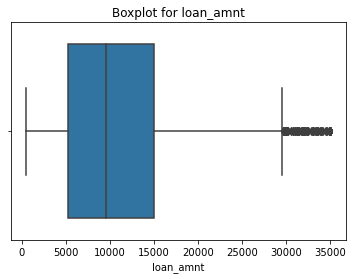

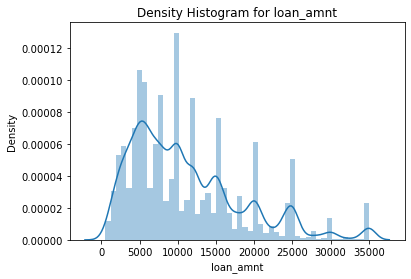

The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

count    38566.000000
mean     11047.429083
std       7348.566643
min        500.000000
25%       5300.000000
50%       9600.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

************************************************


In [284]:
plot_box_and_dist('loan_amnt')

#### Findings
* Most of the loan_amnt lie between 5300 to 15000 
* Mean is 11047 and Median is 9600
* Their is spike in values at 10000, 15000, 20000, 25000, 30000, 35000

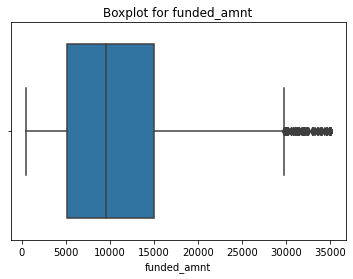

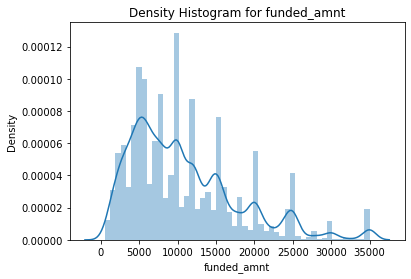

The total amount committed to that loan at that point in time.

count    38566.000000
mean     10784.615335
std       7090.657890
min        500.000000
25%       5200.000000
50%       9550.000000
75%      15000.000000
max      35000.000000
Name: funded_amnt, dtype: float64

************************************************


In [285]:
plot_box_and_dist('funded_amnt')

#### Findings
* Most of the funded amount lie between 5200 to 15000 
* Average funded amount is 10784 and Median is 9550
* Their is spike in values at 10000, 15000, 20000, 25000, 30000, 35000

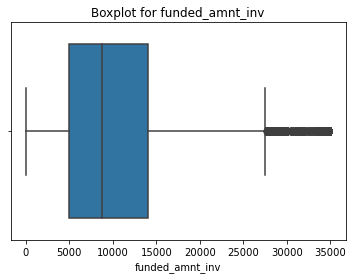

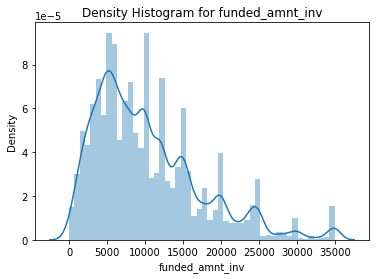

The total amount committed by investors for that loan at that point in time.

count    38566.000000
mean     10223.199813
std       7023.030262
min          0.000000
25%       5000.000000
50%       8736.500000
75%      14000.000000
max      35000.000000
Name: funded_amnt_inv, dtype: float64

************************************************


In [286]:
plot_box_and_dist('funded_amnt_inv')

#### Findings
* Most of the amount lended lie between 5000 to 14000
* Average amount lended is 10223 and Median is 8736.5
* Their is spike in values at 10000, 15000, 20000, 25000, 30000, 35000

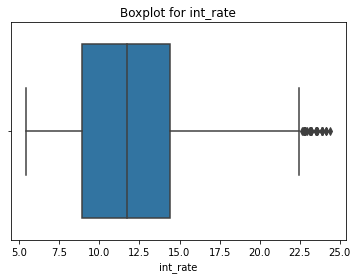

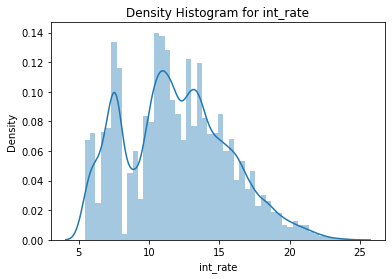

Interest Rate on the loan

count    38566.000000
mean        11.931720
std          3.691278
min          5.420000
25%          8.940000
50%         11.710000
75%         14.380000
max         24.400000
Name: int_rate, dtype: float64

************************************************


In [287]:
plot_box_and_dist('int_rate')

#### Findings
* Most of the interest rate lie between 8.9 to 14.38
* Average inerest rate is 11.93 and Median is 11.71

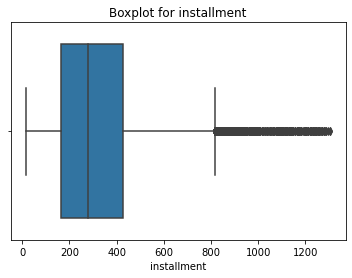

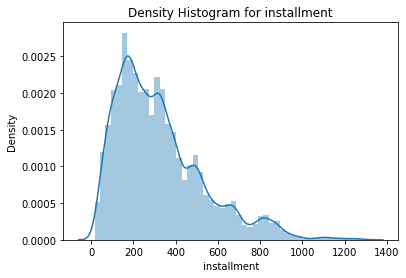

The monthly payment owed by the borrower if the loan originates.

count    38566.00000
mean       322.48819
std        208.65443
min         15.69000
25%        165.74000
50%        277.86500
75%        425.55000
max       1305.19000
Name: installment, dtype: float64

************************************************


In [288]:
plot_box_and_dist('installment')

#### Findings
* Most of the installment lie between 165.74 to 425.55
* Average installment is 322.48 and Median is 277.86

Removing outliers for annual_inc


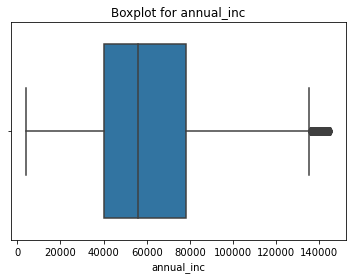

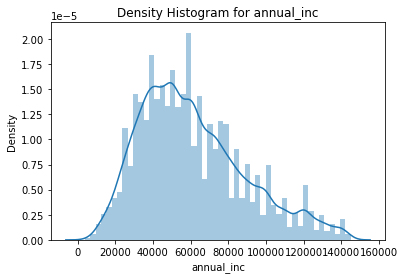

The self-reported annual income provided by the borrower during registration.

count     36743.000000
mean      61081.234113
std       28042.093322
min        4000.000000
25%       40000.000000
50%       56000.000000
75%       78000.000000
max      144997.000000
Name: annual_inc, dtype: float64

************************************************


In [289]:
col = 'annual_inc'
temp = remove_outliers_series(df[col])#As annual_inc cantain high number of outliers lets remove them 
sns.boxplot(temp)
plt.title("Boxplot for "+col)
plt.show()
sns.distplot(temp)
plt.title("Density Histogram for "+col)
plt.show()
print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
print()
print(temp.describe())
print()
print("************************************************")

#### Findings
* Most of the income lie between 40000 to 78000
* Average income is 61081.23 and Median is 56000

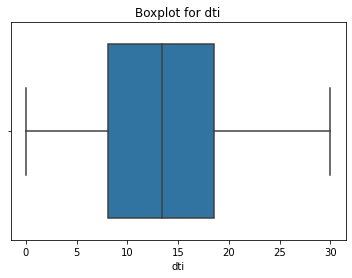

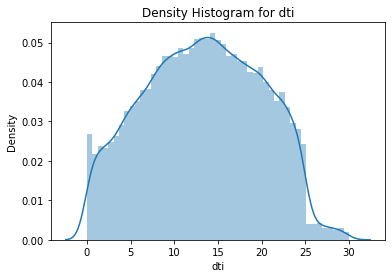

A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

count    38566.000000
mean        13.273294
std          6.672961
min          0.000000
25%          8.130000
50%         13.370000
75%         18.560000
max         29.990000
Name: dti, dtype: float64

************************************************


In [290]:
plot_box_and_dist('dti')

#### Findings
* Most of the dti lie between 8.13 to 18.56
* Average income is 13.27 and Median is 13.37
* Thier is a sudden drop in freq after 25 dti

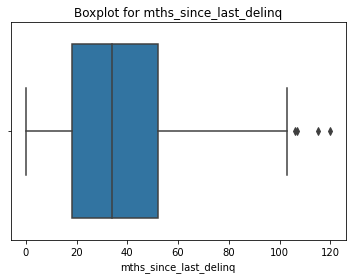

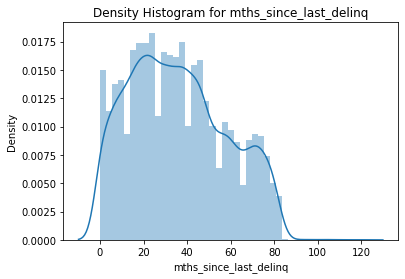

The number of months since the borrower's last delinquency.

count    13668.000000
mean        35.885133
std         22.030370
min          0.000000
25%         18.000000
50%         34.000000
75%         52.000000
max        120.000000
Name: mths_since_last_delinq, dtype: float64

************************************************


In [291]:
col = 'mths_since_last_delinq'
temp = df[df.mths_since_last_delinq !=-1][col]#Lets remove -1 from data as it denotes missing values
sns.boxplot(temp)
plt.title("Boxplot for "+col)
plt.show()
sns.distplot(temp)
plt.title("Density Histogram for "+col)
plt.show()
print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
print()
print(temp.describe())
print()
print("************************************************")

#### Findings
* Most of the last delinquency occured between 18 to 52 Months
* Average last delinquency is 35.88 and Median is 34

### Univariate Alalysis for Categorical Variables

In [292]:
#for col in cat_cols:
#    plt.figure(figsize=(15,8))
#    sns.countplot(df[col])
#    plt.title("Countplot for "+col)
#    plt.xticks(rotation=90)
#    plt.show()

In [293]:
df[df.defaulted == True].defaulted.count()/df.defaulted.count()*100

14.585386091375824

In [294]:
df[df.defaulted == False].defaulted.count()/df.defaulted.count()*100

85.41461390862418

Analysis for the defaulted column

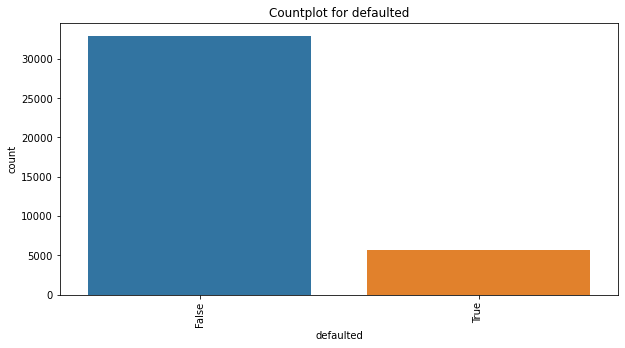

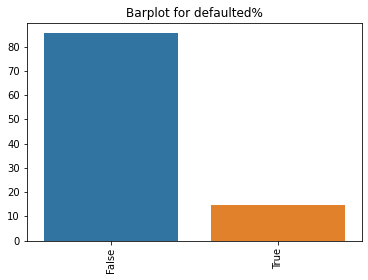

Has the customer defaulted

*****************************************************************************************


In [295]:
col = 'defaulted'
plt.figure(figsize=(10,5))#Setting the size of the figure
sns.countplot(df[col])
plt.title("Countplot for "+col)#Setting the title of the figure
plt.xticks(rotation=90)
plt.show()
sns.barplot(y = [df[df.defaulted == True].defaulted.count()/df.defaulted.count()*100,df[df.defaulted == False].defaulted.count()/df.defaulted.count()*100],orient="v",x=[True,False])
plt.title("Barplot for "+col+"%")
plt.xticks(rotation=90)
plt.show()
print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])#Description of the column selected
print()
print("*****************************************************************************************")

In [296]:
cat_cols

['term',
 'grade',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'purpose',
 'pub_rec_bankruptcies',
 'issue_d_month',
 'issue_d_year',
 'addr_state']

In [297]:
def plot_count(col):
    plt.figure(figsize=(10,5))
    sns.countplot(df[col],order=sorted(df[col].unique()))
    plt.title("Countplot for "+col)
    plt.xticks(rotation=90)
    plt.show()
    print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
    print()
    print("*****************************************************************************************")

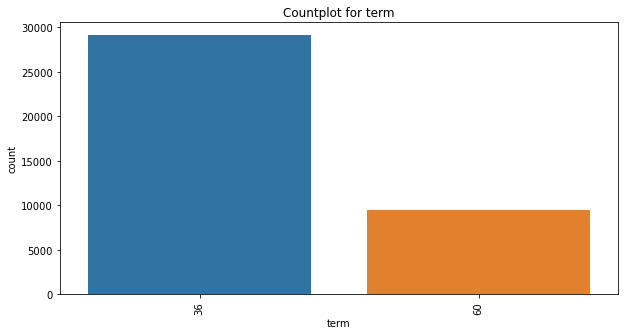

The number of payments on the loan. Values are in months and can be either 36 or 60.

*****************************************************************************************


In [298]:
plot_count('term')

#### Findings
* Lesser term period is more preffered over higher term period

#### Recomendations(Not related to problem statement)
* Client can give more offer on the lower term to attract more customers

In [299]:
sorted(df.grade.unique())

['A', 'B', 'C', 'D', 'E', 'F', 'G']

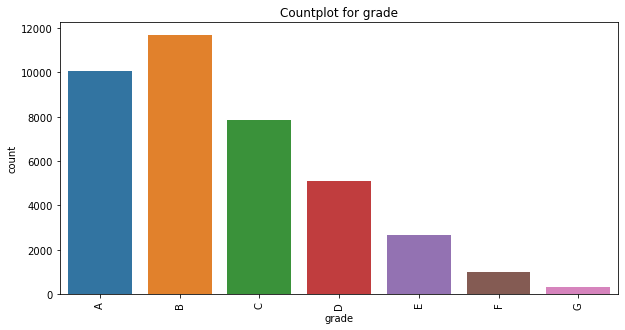

LC assigned loan grade

*****************************************************************************************


In [300]:
plot_count('grade')

#### Findings
* As the grade decreases the number of loans also decrease

#### Recomendations(Not related to problem statement)
* Client can target borrowers with High grade (A B C) as potential targets

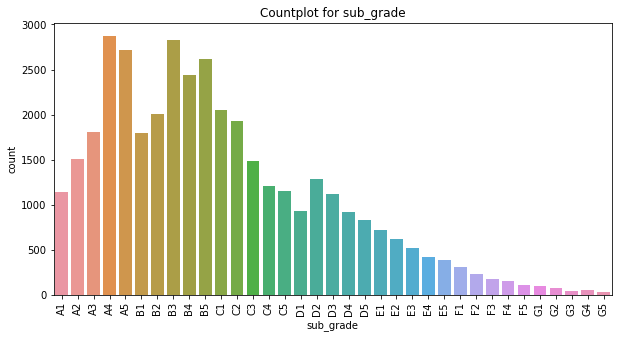

LC assigned loan subgrade

*****************************************************************************************


In [301]:
plot_count('sub_grade')

#### Findings
* As the sub grade decreases the number of loans also decrease

#### Recomendations(Not related to problem statement)
* Client can target borrowers with high subgrade(A1 - C2) as potential targets

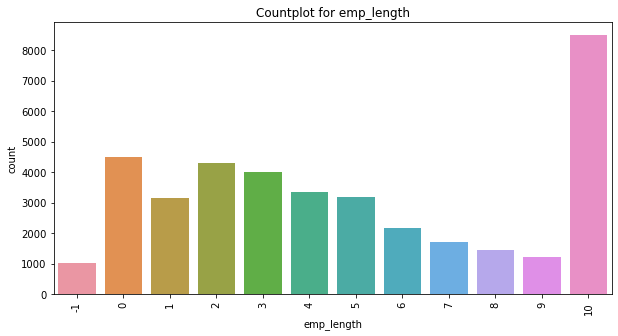

Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

*****************************************************************************************


In [302]:
plot_count('emp_length')

#### Findings
* We can see high number of loans for borrowers with more than 10 years of employment
* From 0 to 9 years of employment the number of loans decreases gradualy and increases steeply for 10+ years of employment

#### Recomendations (Not related to problem statement)
* Client can target borrowers with more than 10 years of employment as potential targets
* Client can also target borrowers with 0 1 2 3 years of employment

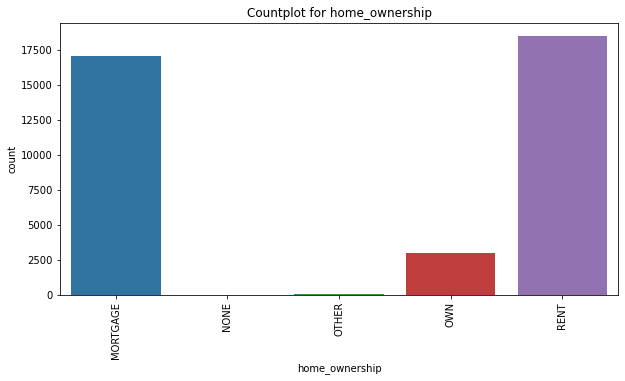

The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

*****************************************************************************************


In [303]:
plot_count('home_ownership')

#### Findings
* We can see borrowers which are on rent and mortgage tend to buy more loans than the ones which own thier own house

#### Recomendations(Not related to problem statement)
* Client can target borrowers on rent and mortgage as potential targets

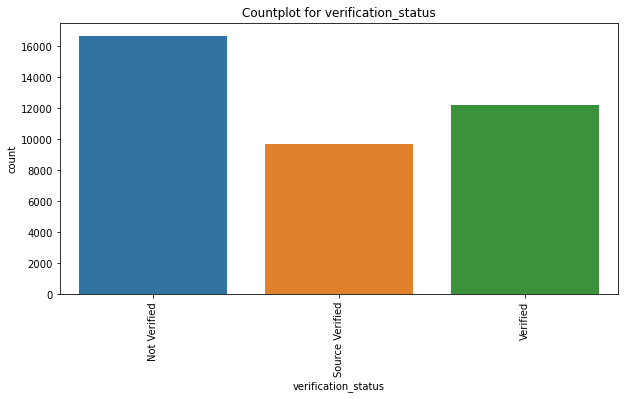

Indicates if income was verified by LC, not verified, or if the income source was verified

*****************************************************************************************


In [304]:
plot_count('verification_status')

#### Findings
* Thier are more number of borrowers which have not been verified

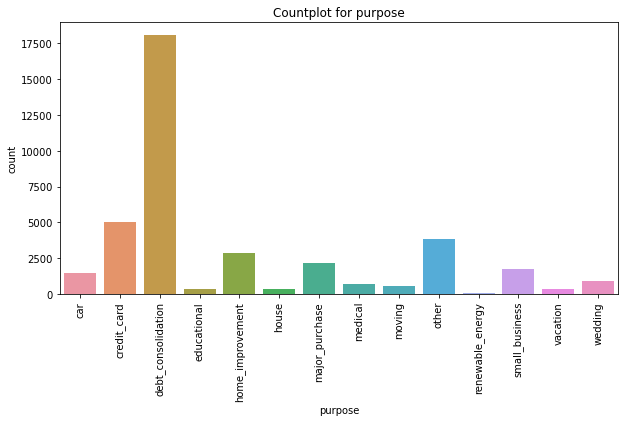

A category provided by the borrower for the loan request. 

*****************************************************************************************


In [305]:
plot_count('purpose')

#### Findings
* We can see high number of loans for debt,credit card, home improvemnts and major purchase

#### Recomendations(Not related to problem statement)
* Client can target borrowers looking loan for credit pay off or debt condolidation as potential targets

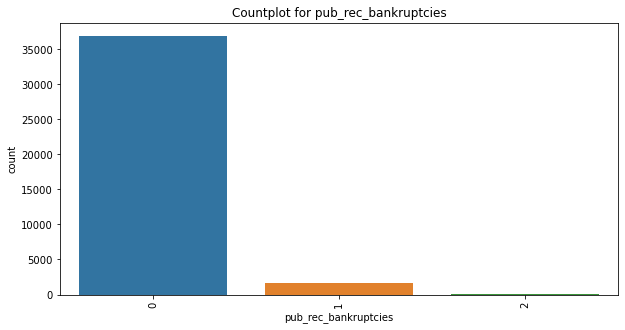

Number of public record bankruptcies

*****************************************************************************************


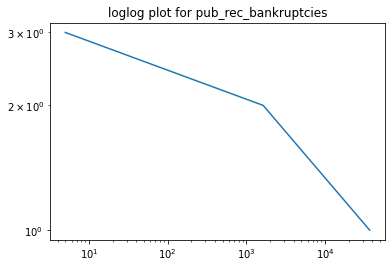

Number of public record bankruptcies

*****************************************************************************************


In [306]:
col = 'pub_rec_bankruptcies'
plot_count(col)
plt.loglog(df[col].value_counts(),range(1,len(df[col].value_counts())+1))#log log Plot
plt.title("loglog plot for "+col)
plt.show()
print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
print()
print("*****************************************************************************************")


In [307]:
df.pub_rec_bankruptcies.value_counts()

0    36924
1     1637
2        5
Name: pub_rec_bankruptcies, dtype: int64

#### Findings
* Thier are very few borrowers with public bankruptcies record

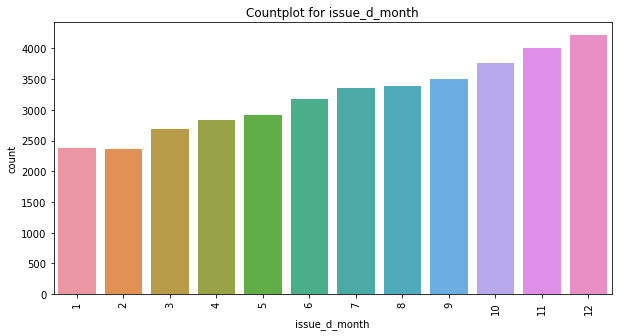

The month which the loan was funded

*****************************************************************************************


In [308]:
plot_count('issue_d_month')

#### Findings
* Number of loans increase towards year end

#### Recomendations(Not related to problem statement)
* Client can give offers during first half to increase loans during the period

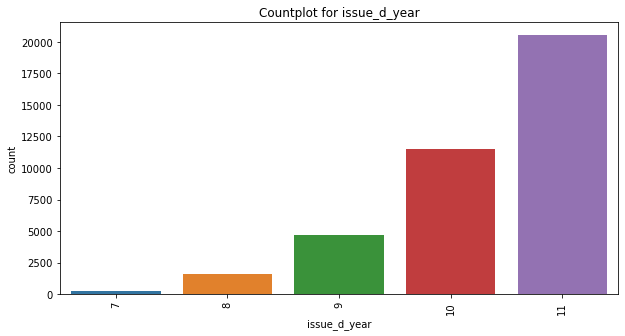

The month which the loan was funded

*****************************************************************************************


In [309]:
plot_count('issue_d_year')

#### Findings
* we can see the growth of the company from the above xD

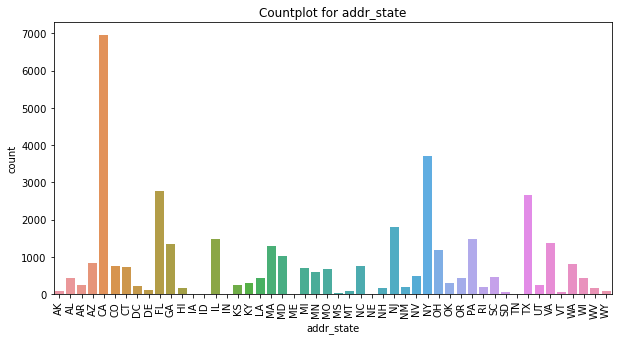

The state provided by the borrower in the loan application

*****************************************************************************************


In [310]:
plot_count('addr_state')

#### Findings
* We can see more number of loans from certains state like CA,FL,NY and NI

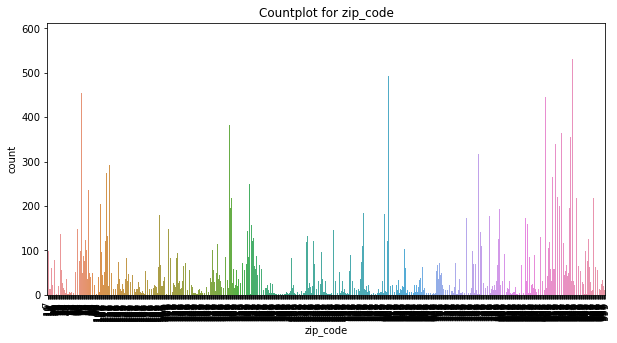

The first 3 numbers of the zip code provided by the borrower in the loan application.

*****************************************************************************************


In [311]:
plot_count('zip_code')

In [312]:
#Top 10 zip code by number of loans
df.zip_code.value_counts().head(10)

100    583
945    531
112    502
606    493
70     455
900    446
21     383
300    383
926    365
750    356
Name: zip_code, dtype: int64

#### Findings
* Thier are certain zip code areas with high number of loans and they are starting with
    * 100    
    * 945    
    * 112    
    * 606    
    * 070     
    * 900    
    * 021     
    * 300    
    * 926    
    * 750

## Bivariate Analysis

### Bivariate Alalysis for Continuous Variables verses Defaulted Loans

In [313]:
#for col in cont_cols:
#    plt.figure(figsize=(10,10))
#    sns.boxplot(x=df["defaulted"],y=df[col])
#    plt.title("Boxplot for defaulted and "+col)
#    plt.xticks(rotation=90)
#    plt.show()
#    print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
#    print()
#    print("*****************************************************************************************")

In [314]:
cont_cols

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'mths_since_last_delinq']

In [315]:
def plot_box(col):
    plt.figure(figsize=(10,10))
    sns.boxplot(x=df["defaulted"],y=df[col])#Box Plot
    plt.title("Boxplot for defaulted and "+col)
    plt.xticks(rotation=90)
    plt.show()
    print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
    print()
    print("*****************************************************************************************")

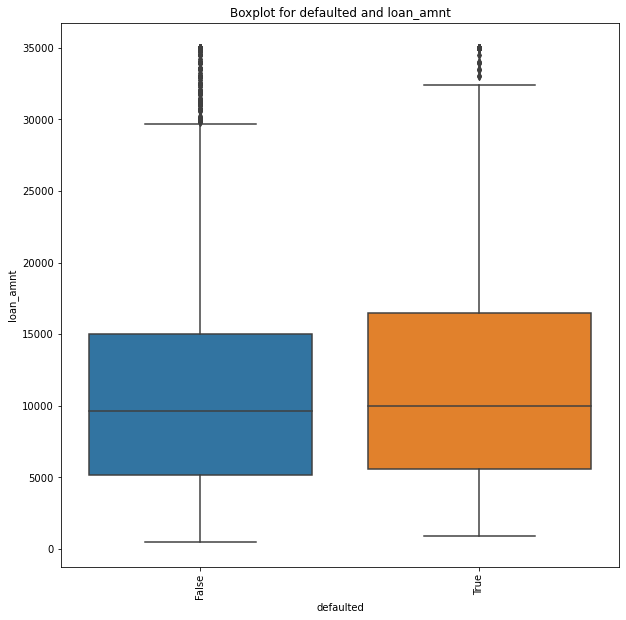

The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

*****************************************************************************************


In [316]:
plot_box('loan_amnt')

#### Findings
* Thier is a small difference in the 75th quantile of the loan amount

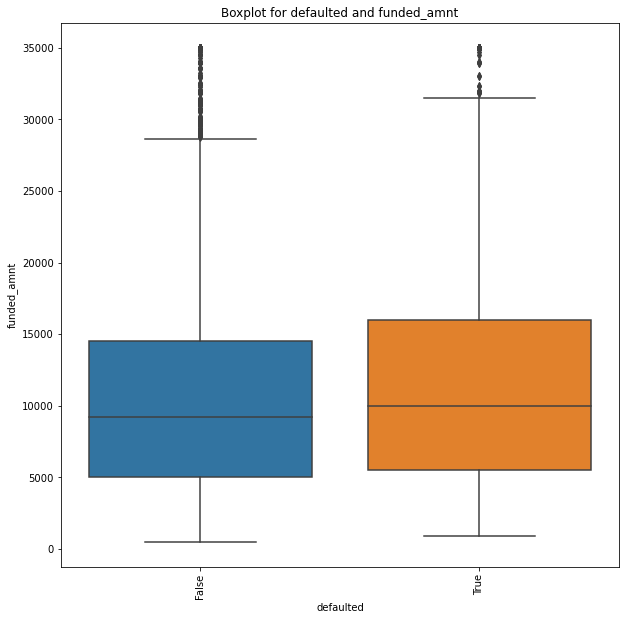

The total amount committed to that loan at that point in time.

*****************************************************************************************


In [317]:
plot_box('funded_amnt')

#### Findings
* Thier is a small difference in the 75th quantile of the funded amount

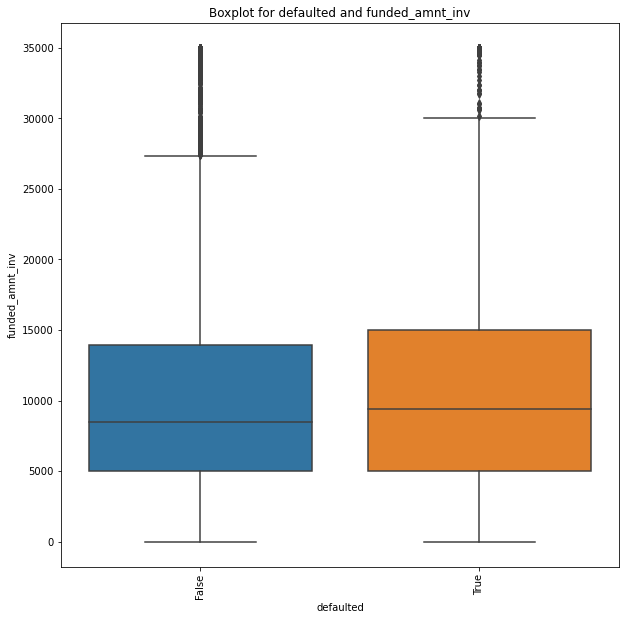

The total amount committed by investors for that loan at that point in time.

*****************************************************************************************


In [318]:
plot_box('funded_amnt_inv')

#### Findings
* Thier is a small difference in the 75th quantile of the funded amount invested

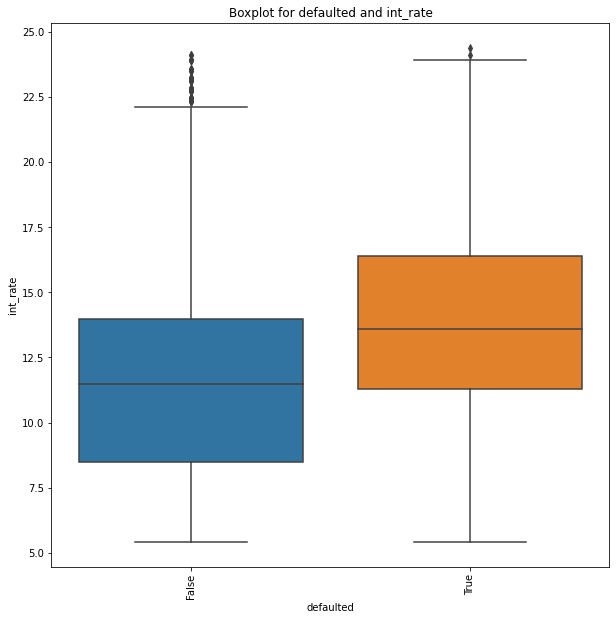

Interest Rate on the loan

*****************************************************************************************


In [319]:
plot_box('int_rate')

#### Findings
* Thier is big difference in the 75th, 50th and the 25th quantile of the interest rate

#### Recomendations
* **If the interest for the loan is high then the borrower might default**

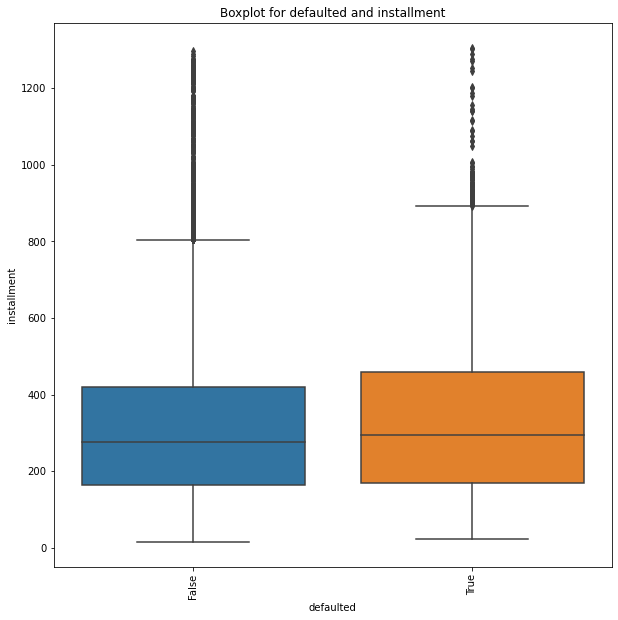

The monthly payment owed by the borrower if the loan originates.

*****************************************************************************************


In [320]:
plot_box('installment')

#### Findings
* Thier is no clear difference in the the quantiles

Removing outliers for annual_inc


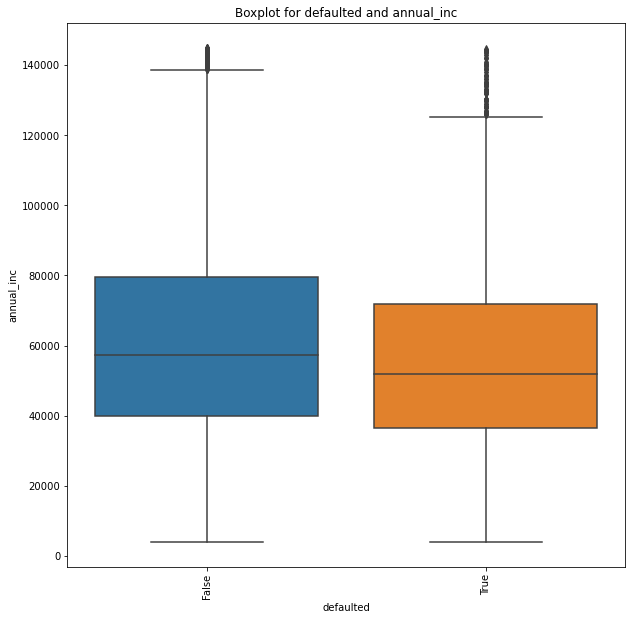

The self-reported annual income provided by the borrower during registration.

*****************************************************************************************


In [321]:
col = 'annual_inc'
plt.figure(figsize=(10,10))
sns.boxplot(x=df["defaulted"],y=remove_outliers_series(df[col]))#Box Plot also removing outliers for annual income
plt.title("Boxplot for defaulted and "+col)
plt.xticks(rotation=90)
plt.show()
print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
print()
print("*****************************************************************************************")

#### Findings
* Thier is a difference in the 75th and 50th quantile for the annual income

#### Recomendations
* ***Borrowers with less annual income tend to default more than the ones with higher annual income***

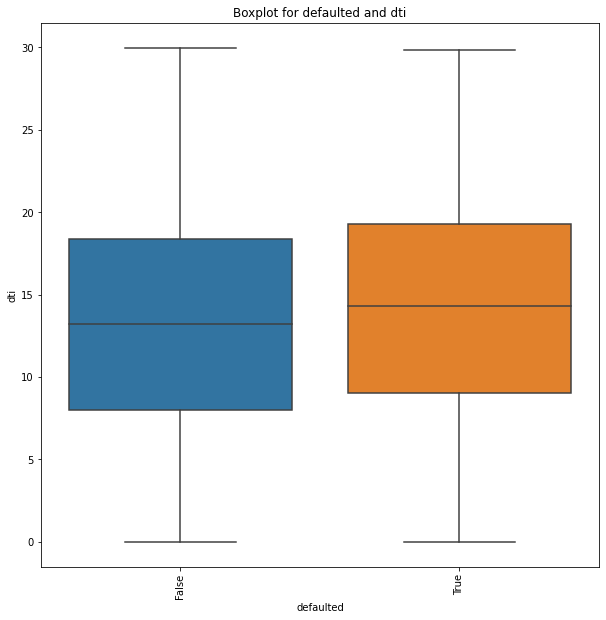

A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

*****************************************************************************************


In [322]:
plot_box('dti')

#### Findings
* Thier is small difference in the the quantiles

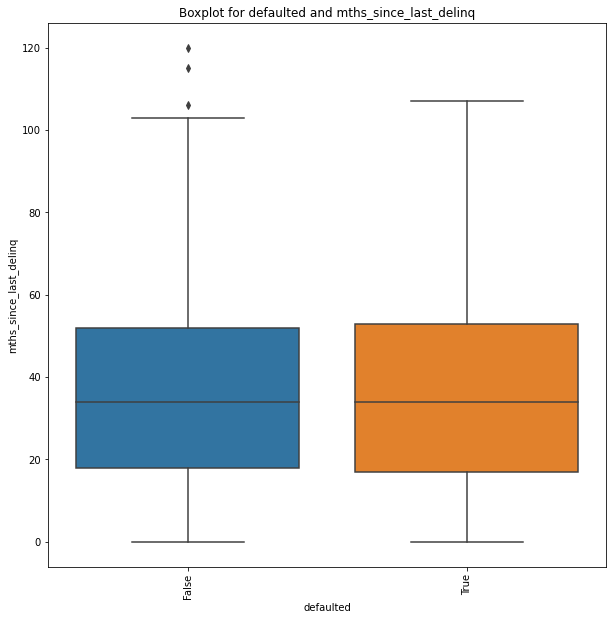

The number of months since the borrower's last delinquency.

*****************************************************************************************


In [323]:
col = 'mths_since_last_delinq'
temp = df[df.mths_since_last_delinq !=-1][col]
plt.figure(figsize=(10,10))
sns.boxplot(x=df["defaulted"],y=temp)
plt.title("Boxplot for defaulted and "+col)
plt.xticks(rotation=90)
plt.show()
print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
print()
print("*****************************************************************************************")

#### Findings
* Thier is no clear difference in the the quantiles

### Bivariate Alalysis for Continuous Variables(converted to categorical using binning) verses Defaulted Loans Percent

Lets define a method to calculate the default percentage based on column

In [324]:
df[df.defaulted == True].purpose.value_counts()/df.purpose.value_counts()*100

car                   10.673783
credit_card           10.783924
debt_consolidation    15.322402
educational           17.337461
home_improvement      12.069565
house                 16.076294
major_purchase        10.330386
medical               15.565345
moving                15.972222
other                 16.386228
renewable_energy      18.627451
small_business        27.054795
vacation              14.133333
wedding               10.367171
Name: purpose, dtype: float64

In [325]:
def default_percentage(df,col):
    return df[df.defaulted == True][col].value_counts()/df[col].value_counts()*100

In [326]:
default_percentage(df,'purpose')

car                   10.673783
credit_card           10.783924
debt_consolidation    15.322402
educational           17.337461
home_improvement      12.069565
house                 16.076294
major_purchase        10.330386
medical               15.565345
moving                15.972222
other                 16.386228
renewable_energy      18.627451
small_business        27.054795
vacation              14.133333
wedding               10.367171
Name: purpose, dtype: float64

lets create bins for the continuous column so that we can convert them into categorical columns for the analysis

In [327]:
loan_amnt_bins = [0,5000,10000,15000,20000,35000]
funded_amnt_bins = [0,5000,10000,15000,20000,35000]
funded_amnt_inv_bins = [0,5000,10000,15000,20000,35000]
int_rate_bins = [0,5,10,15,20,25,30,35]
installment_bins = [0,200,400,600,800,1000,1200,1400,1600]
annual_inc_bins = [0,10000,20000,30000,40000,50000,60000,70000,80000,90000,100000,110000,120000,130000,140000,150000,160000]
dti_bins = [0,5,10,15,20,25,30]
mths_since_last_delinq_bins = [0,10,20,30,40,50,60,70,80,90,100,110,120]

In [328]:
bins=[0,5000,10000,15000,20000,35000]
pd.cut(df.loan_amnt, bins)#lets use the cut method the assign the bin to each value of the column

0            (0, 5000]
1            (0, 5000]
2            (0, 5000]
3        (5000, 10000]
5            (0, 5000]
             ...      
39712        (0, 5000]
39713    (5000, 10000]
39714        (0, 5000]
39715        (0, 5000]
39716    (5000, 10000]
Name: loan_amnt, Length: 38566, dtype: category
Categories (5, interval[int64, right]): [(0, 5000] < (5000, 10000] < (10000, 15000] < (15000, 20000] < (20000, 35000]]

In [329]:
col1='defaulted'
col2='loan_amnt'
bins = loan_amnt_bins
newdf = pd.DataFrame(df.defaulted)#new dataframe 
newdf[col1] = df[col1]
newdf[col2] = pd.cut(df[col2], bins)
newdf
#the above code will create new dataframe with the new bins assigned and its defaulted value as shown below

,defaulted,loan_amnt
0,False,"(0, 5000]"
1,True,"(0, 5000]"
2,False,"(0, 5000]"
3,False,"(5000, 10000]"
5,False,"(0, 5000]"
...,...,...
39712,False,"(0, 5000]"
39713,False,"(5000, 10000]"
39714,False,"(0, 5000]"
39715,False,"(0, 5000]"


In [330]:
def plot_bar(col1,col2,bins):
    newdf = pd.DataFrame(df.defaulted)
    newdf[col1] = df[col1]
    newdf[col2] = pd.cut(df[col2], bins)
    plt.figure(figsize=(10,4))
    sns.barplot(y=default_percentage(newdf,col2).values,x=default_percentage(newdf,col2).index,orient="v")#Bar Plot
    plt.title("Barplot for percentage of loan defautled for "+col2)
    plt.ylabel("Default Percent %")
    plt.xlabel(col2)
    plt.xticks(rotation=90)
    plt.show()
    print(df_dict[df_dict.LoanStatNew == col2].iloc[0,1])
    print()
    print("*****************************************************************************************")

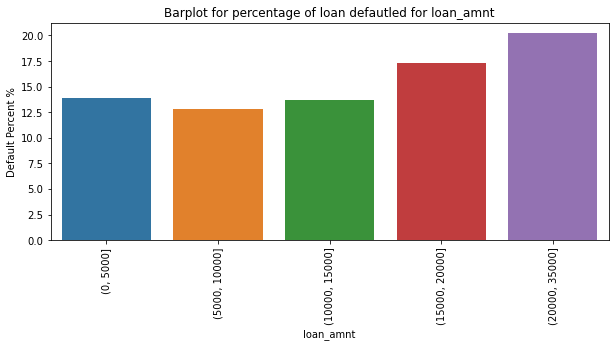

The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

*****************************************************************************************


In [331]:
col1='defaulted'
col2='loan_amnt'
bins = loan_amnt_bins
plot_bar(col1,col2,bins)

#### Findings
* As the loan amount increases the the default percent 

#### Recomendations
* ***Loan requested for more than 15000 is having higher chances of default***

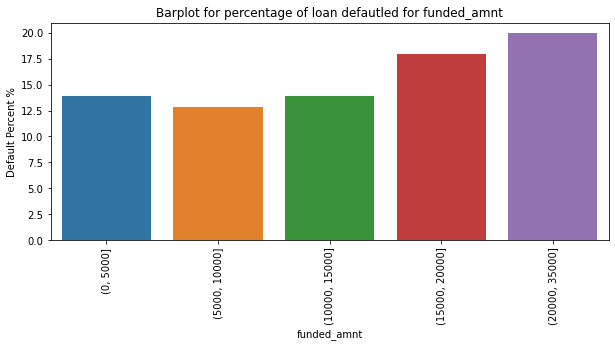

The total amount committed to that loan at that point in time.

*****************************************************************************************


In [332]:
col1='defaulted'
col2='funded_amnt'
bins = funded_amnt_bins
plot_bar(col1,col2,bins)

#### Findings
* As the funded amount increases the the default percent 

#### Recomendations
* ***Loan approved for more than 15000 is having higher chances of default***

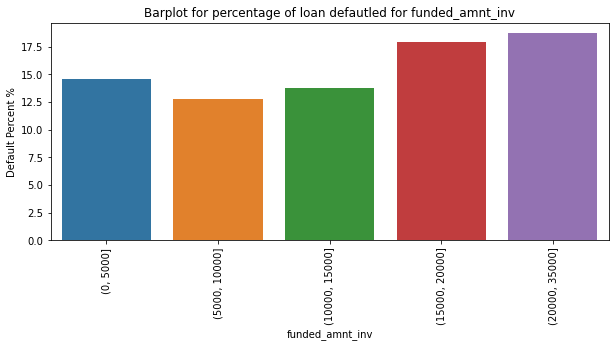

The total amount committed by investors for that loan at that point in time.

*****************************************************************************************


In [333]:
col1='defaulted'
col2='funded_amnt_inv'
bins = funded_amnt_inv_bins
plot_bar(col1,col2,bins)

#### Findings
* As the funded amount invested increases the the default percent 

#### Recomendations
* ***Loan approved for more than 15000 is having higher chances of default***

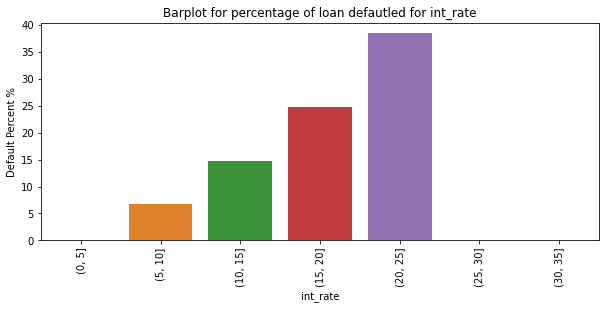

Interest Rate on the loan

*****************************************************************************************


In [334]:
col1='defaulted'
col2='int_rate'
bins = int_rate_bins
plot_bar(col1,col2,bins)

In [335]:
#Defaulted percentage for different bins of interest rate
col1='defaulted'
col2='int_rate'
bins = int_rate_bins
newdf = pd.DataFrame(df.defaulted)
newdf[col1] = df[col1]
newdf[col2] = pd.cut(df[col2], bins)
default_percentage(newdf,'int_rate')

(0, 5]            NaN
(5, 10]      6.739748
(10, 15]    14.820089
(15, 20]    24.826918
(20, 25]    38.441558
(25, 30]          NaN
(30, 35]          NaN
Name: int_rate, dtype: float64

#### Findings
* As the inerest rate increases the the default percent increases steeply

#### Recomendations
* ***Check other parameters when the interest rate for the loan is high***

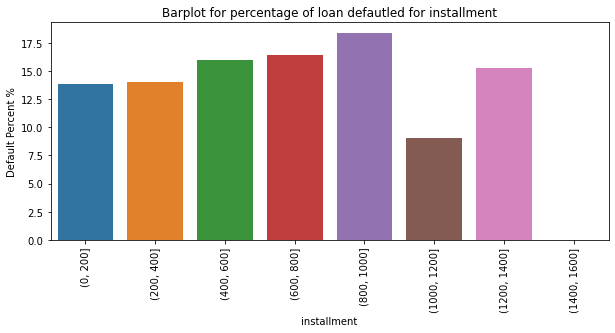

The monthly payment owed by the borrower if the loan originates.

*****************************************************************************************


In [336]:
col1='defaulted'
col2='installment'
bins = installment_bins
plot_bar(col1,col2,bins)

#### Findings
* Defaulted perecntage increases with increase in installment amount upto 800 - 1000 and thier is a sudden drop in percetage for 1000 - 1200

#### Recomendations
* ***Increase the term for the loan, as the installment amount will reduce and the customers will be able to easily pay the installment***

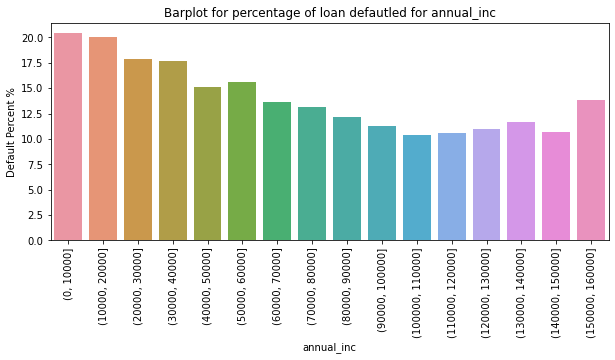

The self-reported annual income provided by the borrower during registration.

*****************************************************************************************


In [337]:
col1='defaulted'
col2='annual_inc'
bins = annual_inc_bins
plot_bar(col1,col2,bins)

#### Findings
* As the annual income increase the percentage of loan defaulted decreases.
* There is a sudden increase in the defaulted percent for 1.5L - 1.6L

#### Recomendations
* ***Check if the income is sufficient enough to repay the loan***

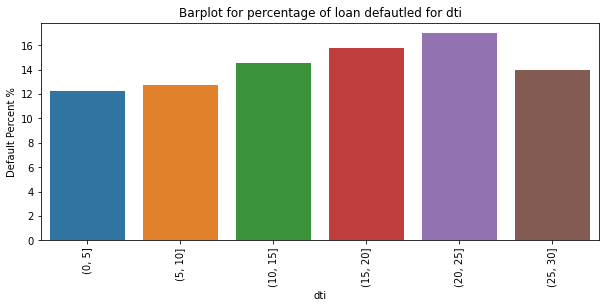

A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

*****************************************************************************************
*****************************************************************************************


In [338]:
col1='defaulted'
col2='dti'
bins = dti_bins
plot_bar(col1,col2,bins)
print("*****************************************************************************************")

#### Findings
* As the dti increase the percentage of loan defaulted increase.
* There is a sudden decrease in the defaulted percent for 25-30 dti
* The debt-to-income (DTI) ratio is the percentage of your monthly income that you use to pay your debts. If more perecent of your salary is used to pay loans then dti is high

#### Recomendations
* ***Check for other debts of the borrower as he might default if he has to repay other loans***

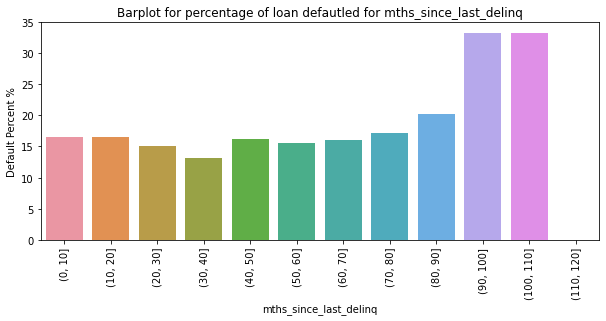

The number of months since the borrower's last delinquency.

*****************************************************************************************


In [339]:
col1='defaulted'
col2='mths_since_last_delinq'
bins = mths_since_last_delinq_bins
plot_bar(col1,col2,bins)

#### Findings
* We can see a steep rise in defaulted percent for the range 80 - 110 months of crime

#### Recomendations
* ***Check if the borrower has committed crime in the last 80 - 110 months***

### Bivariate Alalysis for Categorical Variables verses Defaulted Loans 

In [340]:
#for col in cat_cols:
#    sns.countplot(df[col],hue=df["defaulted"])
#    plt.title("Boxplot for "+col)
#    plt.legend(bbox_to_anchor=(1.5,1))
#    plt.show()

In [341]:
cat_cols

['term',
 'grade',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'purpose',
 'pub_rec_bankruptcies',
 'issue_d_month',
 'issue_d_year',
 'addr_state']

In [342]:
def plot_hist(col):
    fig = px.histogram(df, x=col, color='defaulted', barmode='group',text_auto=True)#Histogram Plot
    fig.update_layout(xaxis_type='category', xaxis={'categoryorder' :'array', 'categoryarray': sorted(df[col].unique())})
    fig.update_layout(title = "Histogram for "+col+" segmented by defaulted")
    fig.show()
    print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
    print()
    print("*****************************************************************************************")

In [343]:
plot_hist("term")

The number of payments on the loan. Values are in months and can be either 36 or 60.

*****************************************************************************************


#### Findings
* We can see more number of loans with shorter time frame

In [344]:
plot_hist("grade")

LC assigned loan grade

*****************************************************************************************


#### Findings
* We can see more number of non defaulted loans grade b and c have reduced but defaulted loans are constant

In [345]:
plot_hist('sub_grade')

LC assigned loan subgrade

*****************************************************************************************


#### Findings
* We can the same trend of grade

In [346]:
plot_hist('emp_length')

Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

*****************************************************************************************


In [347]:
plot_hist('home_ownership')

The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

*****************************************************************************************


#### Findings
* We can see high number of loans defaulted for rent and mortgage
* we can also see that the borrowers who own their house have taken leass loan

In [348]:
plot_hist('verification_status')

Indicates if income was verified by LC, not verified, or if the income source was verified

*****************************************************************************************


In [349]:
plot_hist('purpose')

A category provided by the borrower for the loan request. 

*****************************************************************************************


#### Findings
* We can see high number of loans credit card and debt consolidation

In [350]:
plot_hist('pub_rec_bankruptcies')

Number of public record bankruptcies

*****************************************************************************************


#### Findings
* We can see high number of loans with borrowers with no bankurpties record

In [351]:
plot_hist('issue_d_month')

The month which the loan was funded

*****************************************************************************************


#### Findings
* We can see high number of loans towards the end of the year

In [352]:
plot_hist('issue_d_year')

The month which the loan was funded

*****************************************************************************************


In [353]:
plot_hist('addr_state')

The state provided by the borrower in the loan application

*****************************************************************************************


### Bivariate Alalysis for Categorical Variables verses Defaulted Loans Percentage

In [354]:
def plot_percent_bar(col):
    plt.figure(figsize=(10,4))
    sns.barplot(y=default_percentage(df,col).values,x=default_percentage(df,col).index,orient="v")
    plt.title("Barplot for percentage of loan defautled for "+col)
    plt.xlabel(col)
    plt.ylabel("Default Percent %")
    plt.xticks(rotation=90)
    plt.show()
    print(df_dict[df_dict.LoanStatNew == col].iloc[0,1])
    print()
    print("*****************************************************************************************")

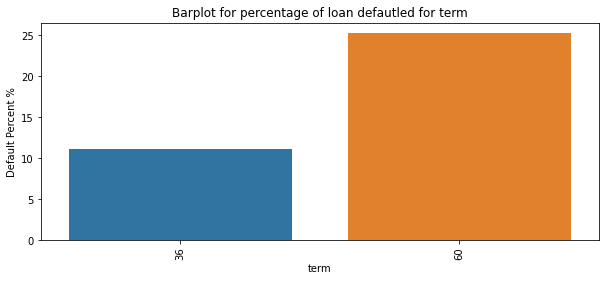

The number of payments on the loan. Values are in months and can be either 36 or 60.

*****************************************************************************************


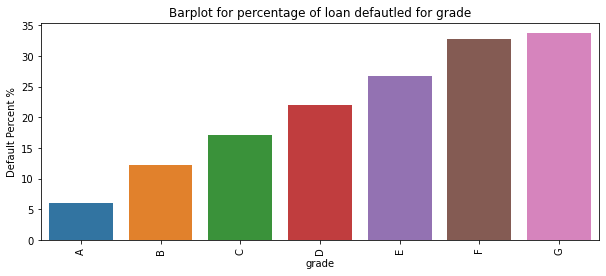

LC assigned loan grade

*****************************************************************************************


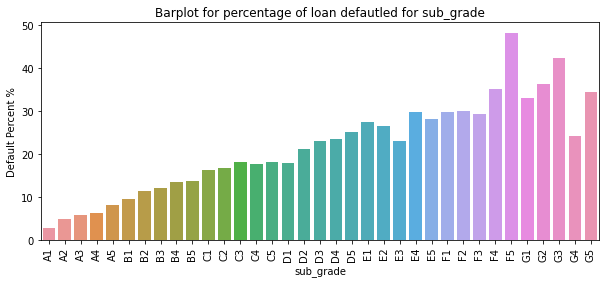

LC assigned loan subgrade

*****************************************************************************************


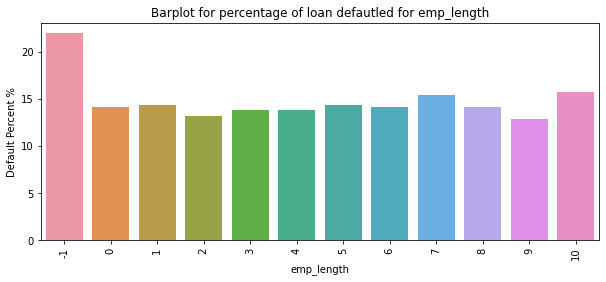

Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

*****************************************************************************************


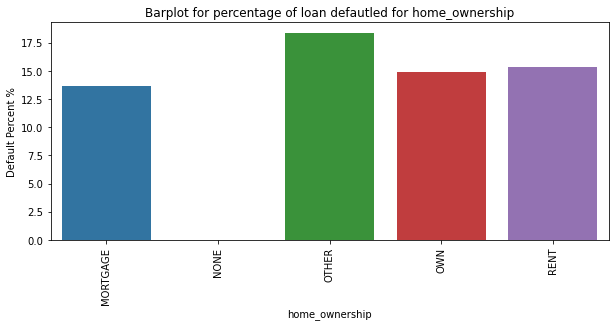

The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

*****************************************************************************************


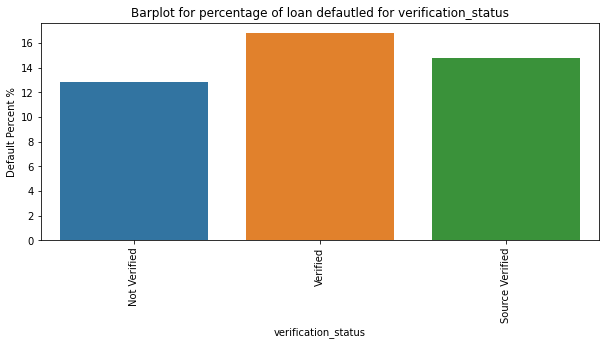

Indicates if income was verified by LC, not verified, or if the income source was verified

*****************************************************************************************


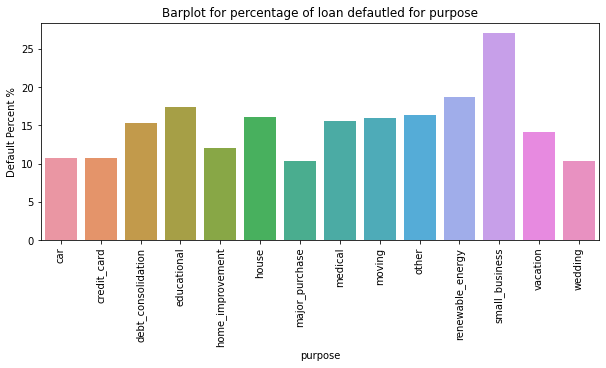

A category provided by the borrower for the loan request. 

*****************************************************************************************


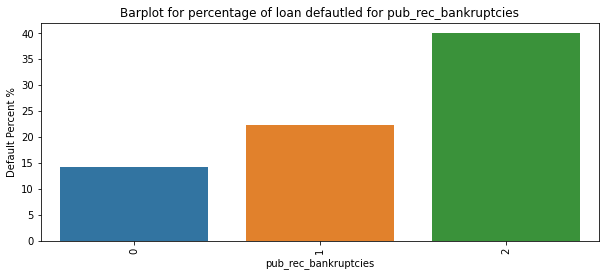

Number of public record bankruptcies

*****************************************************************************************


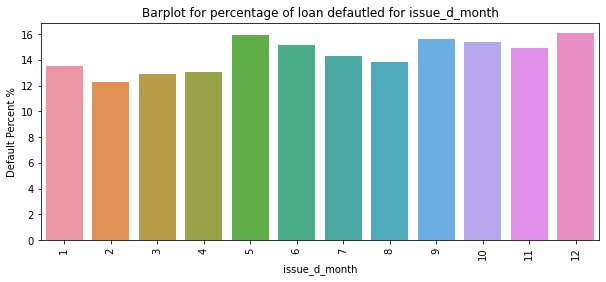

The month which the loan was funded

*****************************************************************************************


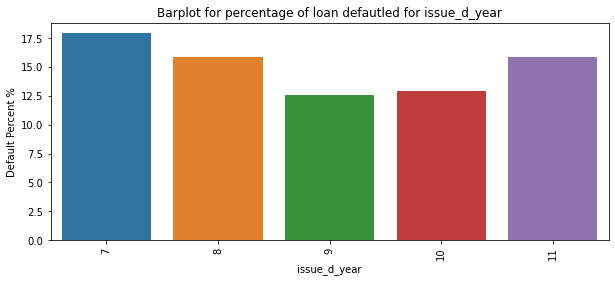

The month which the loan was funded

*****************************************************************************************


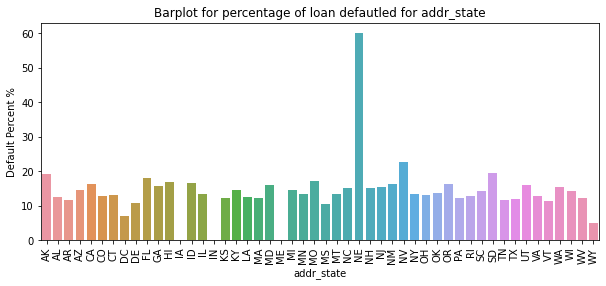

The state provided by the borrower in the loan application

*****************************************************************************************


In [355]:
for col in cat_cols:
    plot_percent_bar(col)

#### Findings
* Percent of loan defaulted is more for 60 months term than 36 months term
* Percent of loan defaulted increases as the Grade decreases (A B C D E F G)
* Percent of loan defaulted increases as the Sub Grade decreases (A1 A2 B1 B2.....)
* Percent of loan defaulted does not change with emp length
* Percent of loan defaulted does not change with home ownership
* Percent of loan defaulted is higher for verifed borrowers
* Percent of loan defaulted is higher for small business borrowers
* Percent of loan defaulted is very high for one or more pubilc bankruptices
* Percent of loan defaulted does not change with month or year in which it was borrowed
* Percent of loan defaulted is ver high for state NE and high for NV and SD

#### Recomendations
* Cant realy ask the borrower to go for a shorter term but can give more offer for lower term
* Approve loan for higher grade(A B C)
* Approve loan for higher Sub grade (A1 A2 B1 B2.....)
* check for other paramenters for small business borrowers
* check for other paramenters for the borrowers with one public bankruptices and reject for two or more public bankruptices
* check for other paramenters for the borrowers from  state NE, NV and SD

## Multivariate Analysis

### Multivarite Alalysis for Continuous Variable, Cateorical Variables and Defaulted Loans 

In [356]:
def plot_multivariate(col,col2):
    plt.figure(figsize=(20,10))
    sns.boxplot(x=df[col2],y=df[col],hue=df["defaulted"],orient="v",order=sorted(df[col2].unique()))
    plt.title("Boxplot for "+col+" and "+col2+" segmented by defaulted")
    plt.xticks(rotation=90)
    plt.show()
    print(df_dict[df_dict.LoanStatNew == col2].iloc[0,1])
    print()
    print("***********************************************************************************************************")

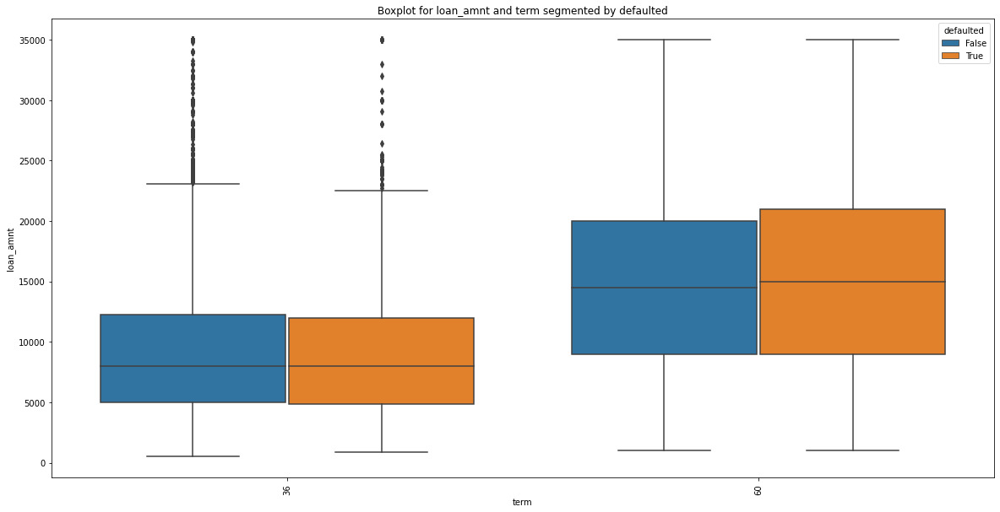

The number of payments on the loan. Values are in months and can be either 36 or 60.

***********************************************************************************************************


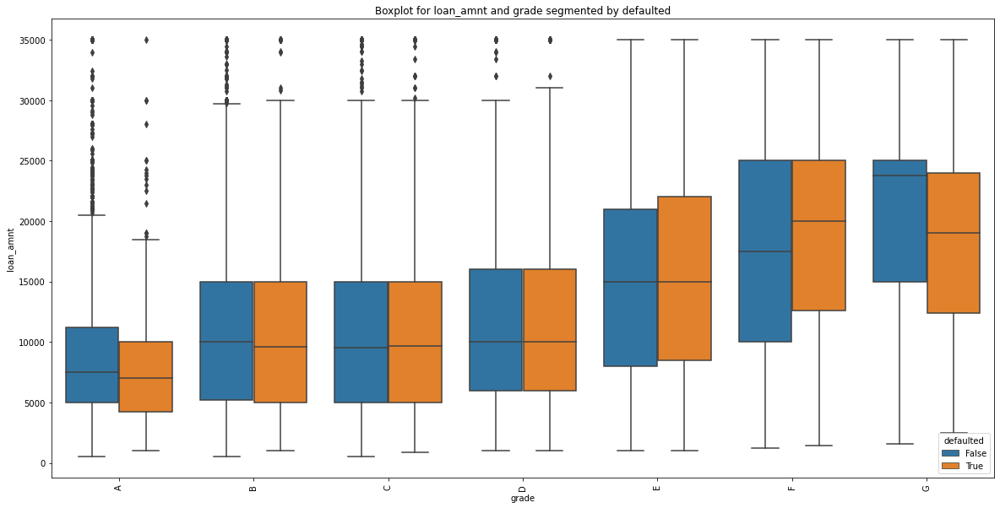

LC assigned loan grade

***********************************************************************************************************


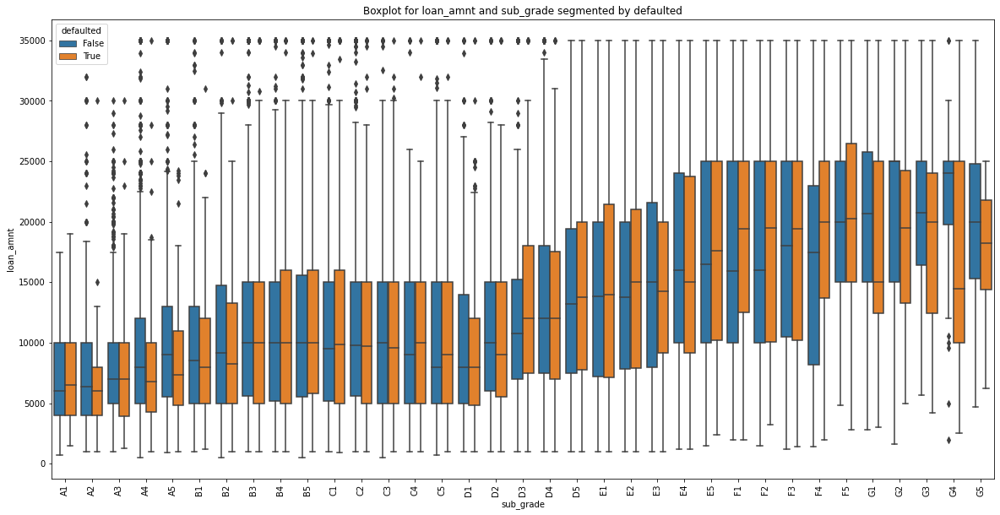

LC assigned loan subgrade

***********************************************************************************************************


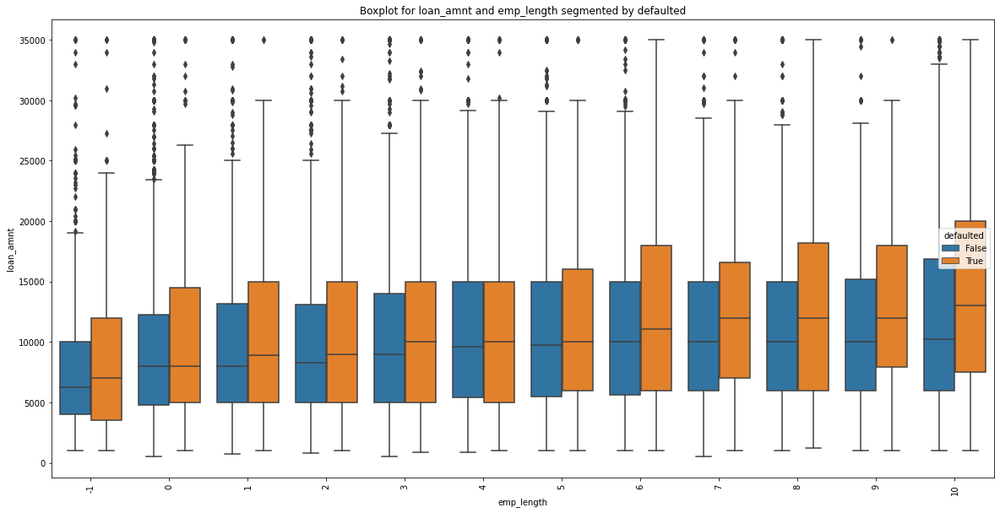

Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

***********************************************************************************************************


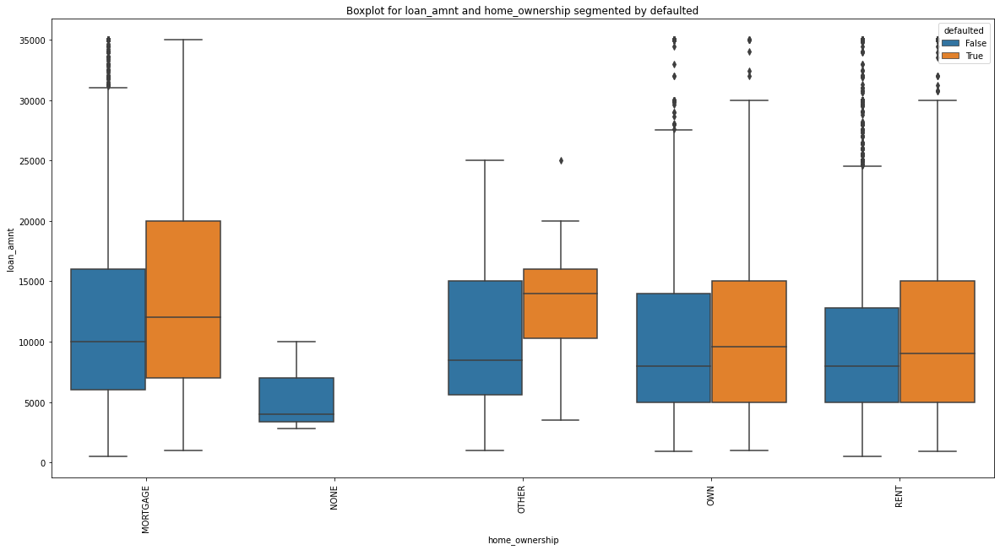

The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

***********************************************************************************************************


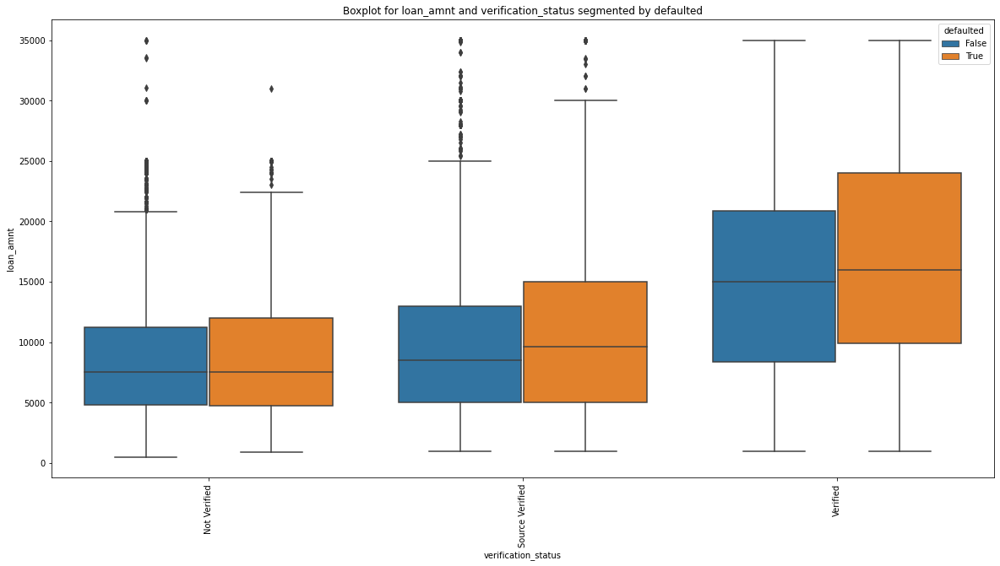

Indicates if income was verified by LC, not verified, or if the income source was verified

***********************************************************************************************************


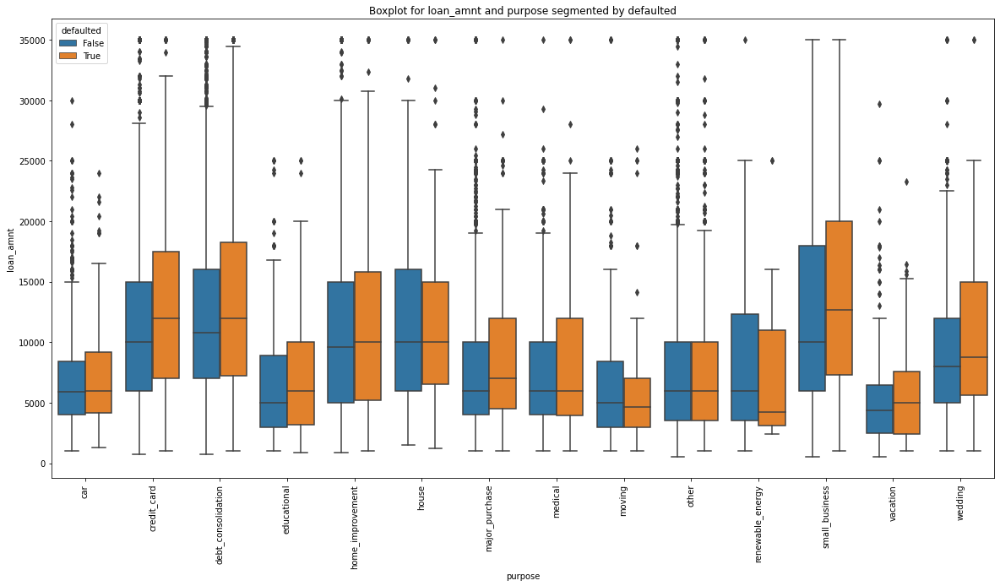

A category provided by the borrower for the loan request. 

***********************************************************************************************************


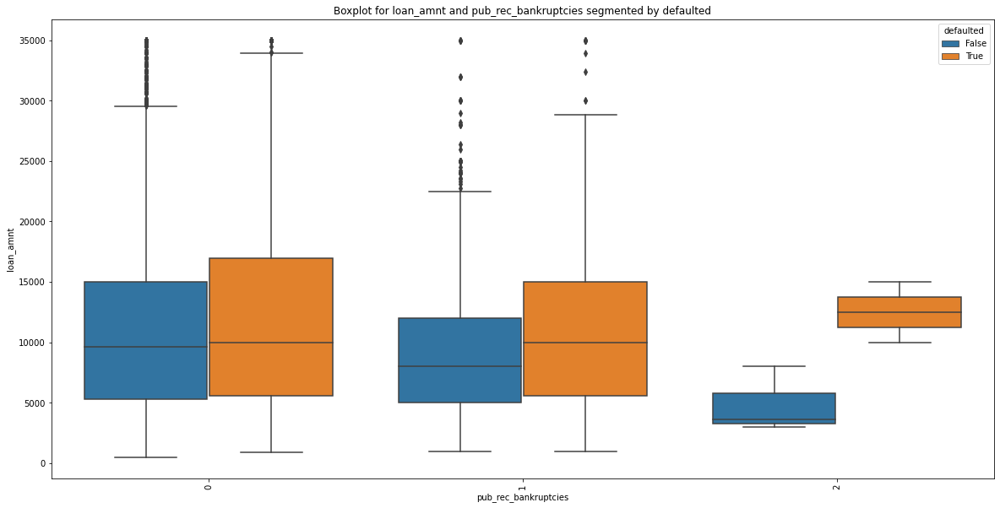

Number of public record bankruptcies

***********************************************************************************************************


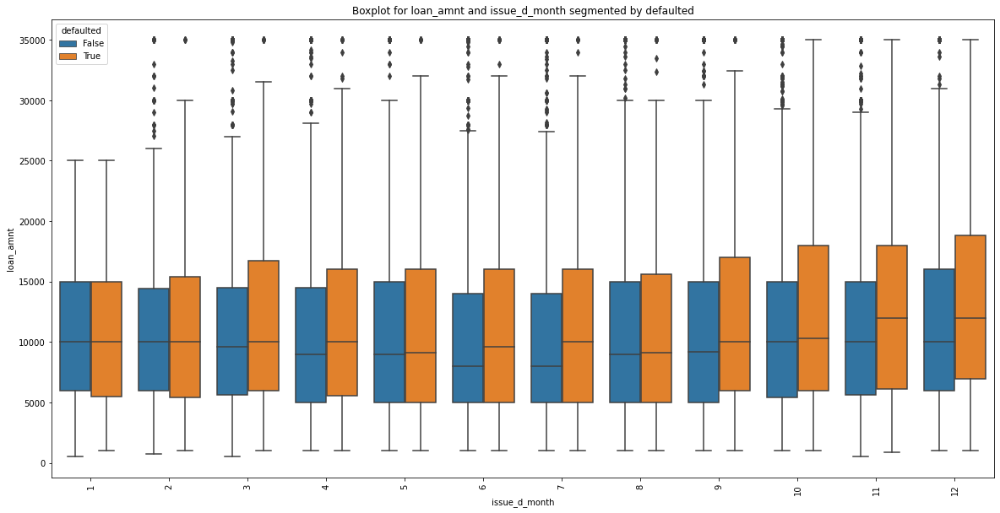

The month which the loan was funded

***********************************************************************************************************


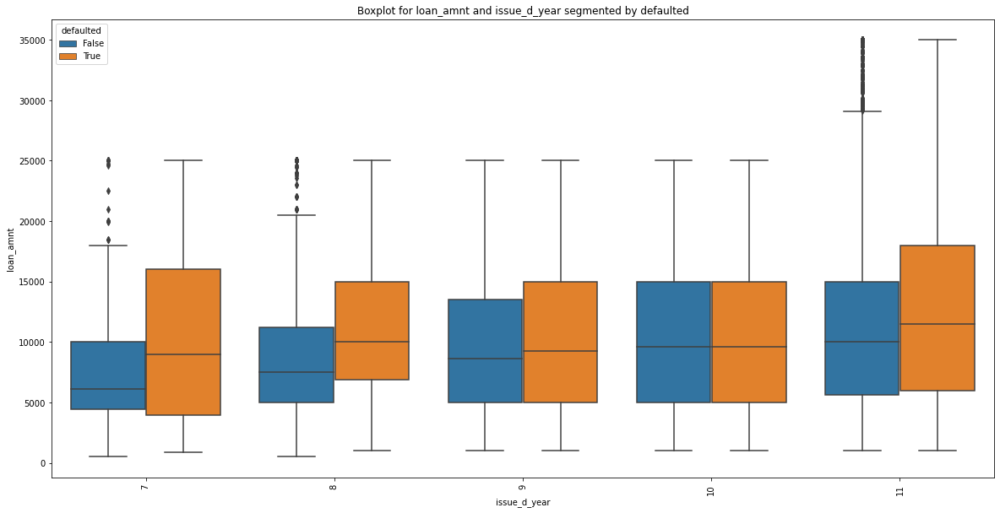

The month which the loan was funded

***********************************************************************************************************


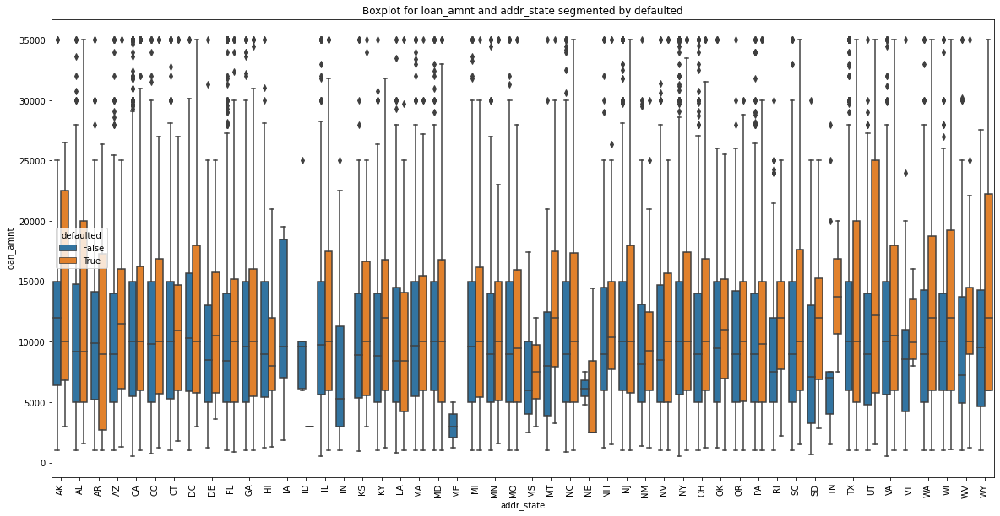

The state provided by the borrower in the loan application

***********************************************************************************************************


In [357]:
for jcol in cat_cols:
    col = 'loan_amnt'
    col2 = jcol
    plot_multivariate(col,col2)

#### Findings
* Term Increases with loan amount
* Grade Decreases(A-Highest) with inrease in loan amount
* Sub Grade Decreases(A1-Highest) with inrease in loan amount
* For verified borrower the loan amount is higher
* The spread for loan amount is bigger for mortgage and rent when compared to own for defaulted borrowers
* Loan amount is higher for debt, credit card and small business borrowers
* AK, TX, UT, WA, WI, WY have bigger loan amount spread for defaulted borrowers
* Loam anount greater than 15000 and having 2 public bankrupties have defaulted

#### Recomendations
* check for other parameters when the home ownership is rent or mortgage
* check for other parameters when the state is AK, TX, UT, WA, WI, WY
* reject all loans with amount greater that 15000 and having 2 public bankrupties

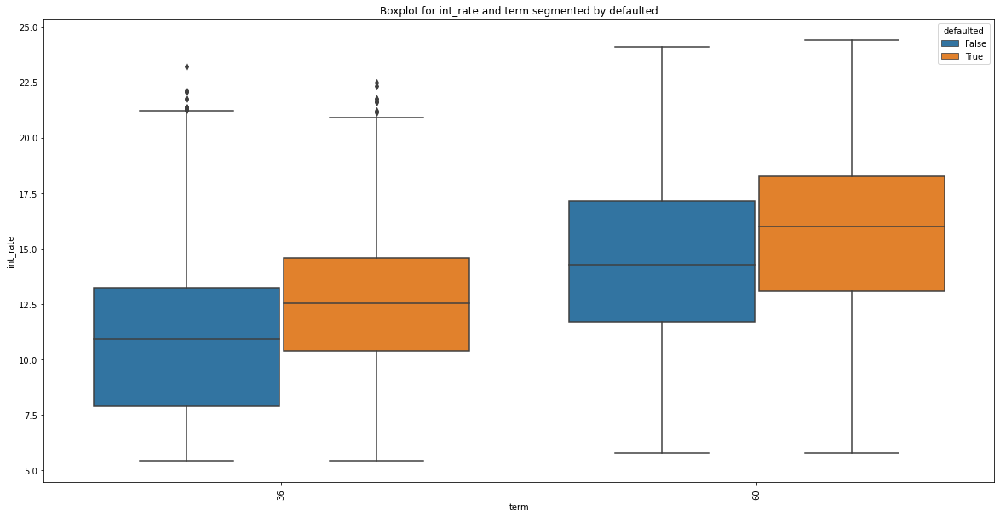

The number of payments on the loan. Values are in months and can be either 36 or 60.

***********************************************************************************************************


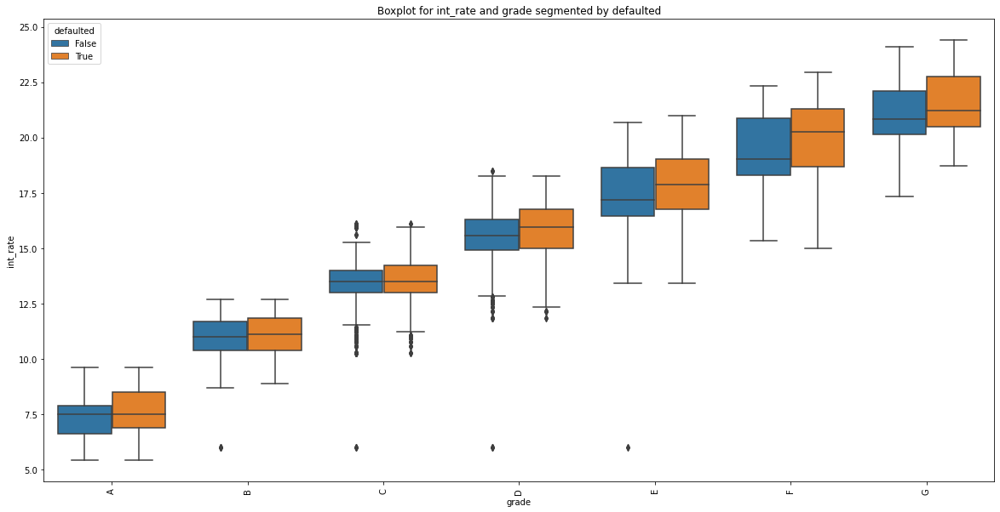

LC assigned loan grade

***********************************************************************************************************


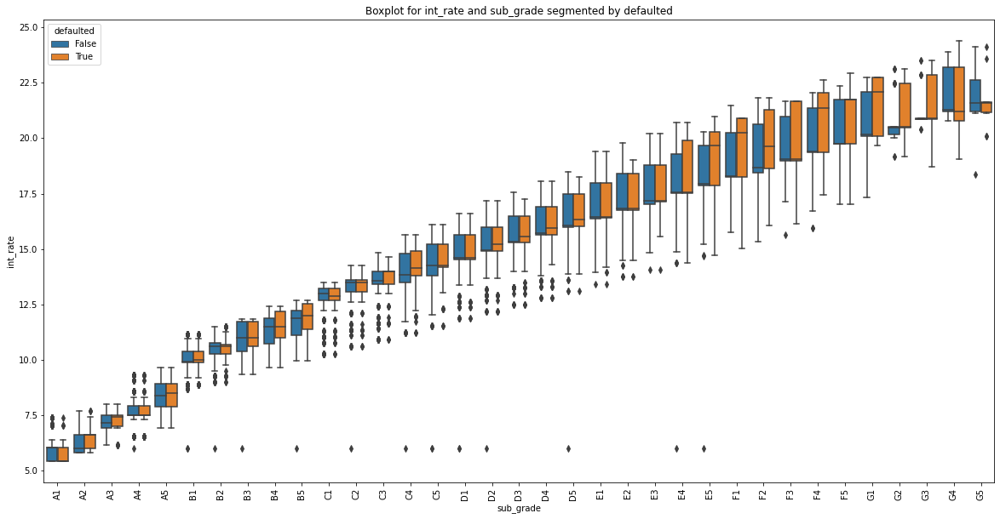

LC assigned loan subgrade

***********************************************************************************************************


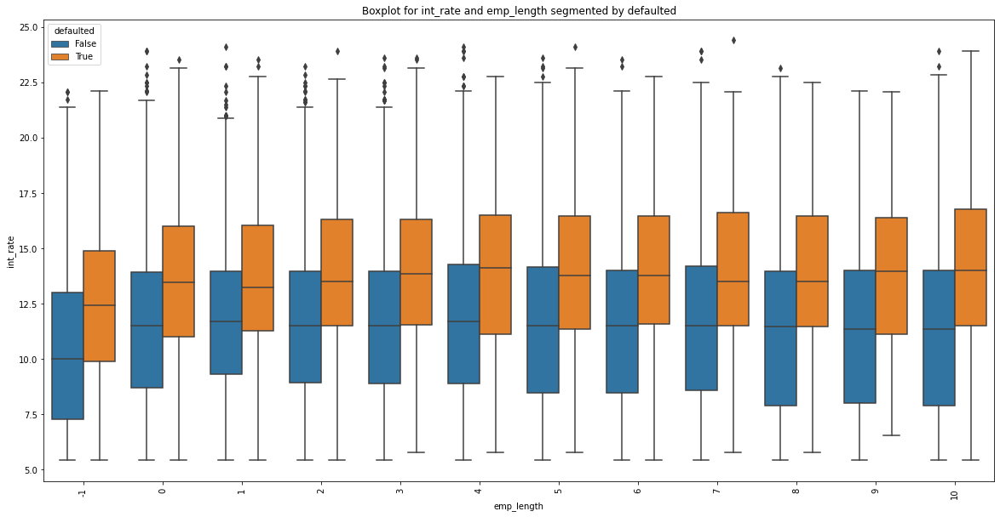

Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

***********************************************************************************************************


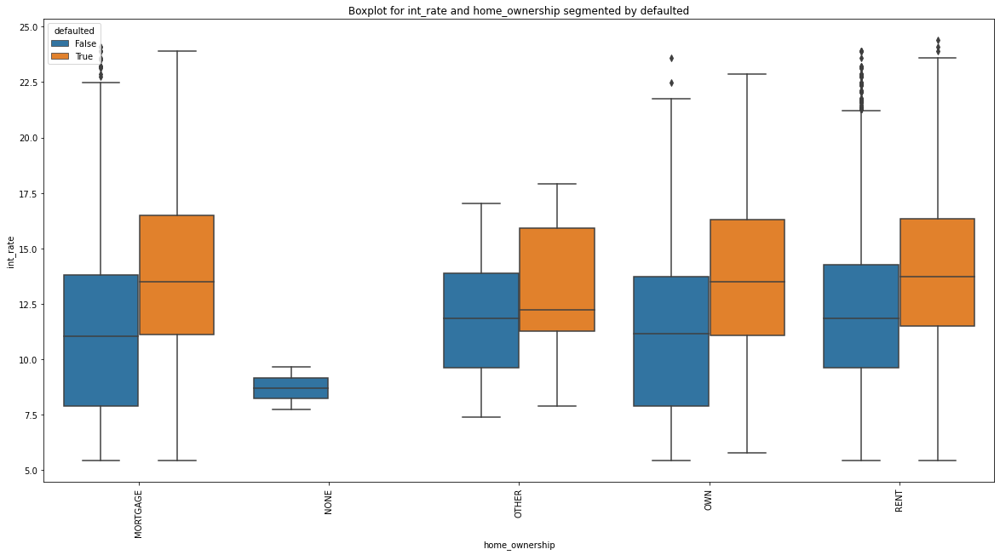

The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

***********************************************************************************************************


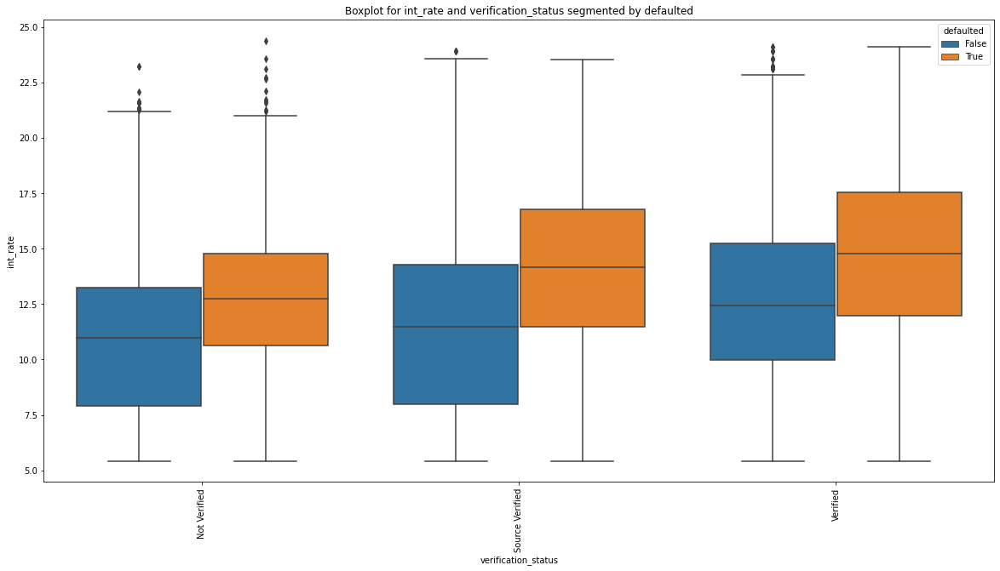

Indicates if income was verified by LC, not verified, or if the income source was verified

***********************************************************************************************************


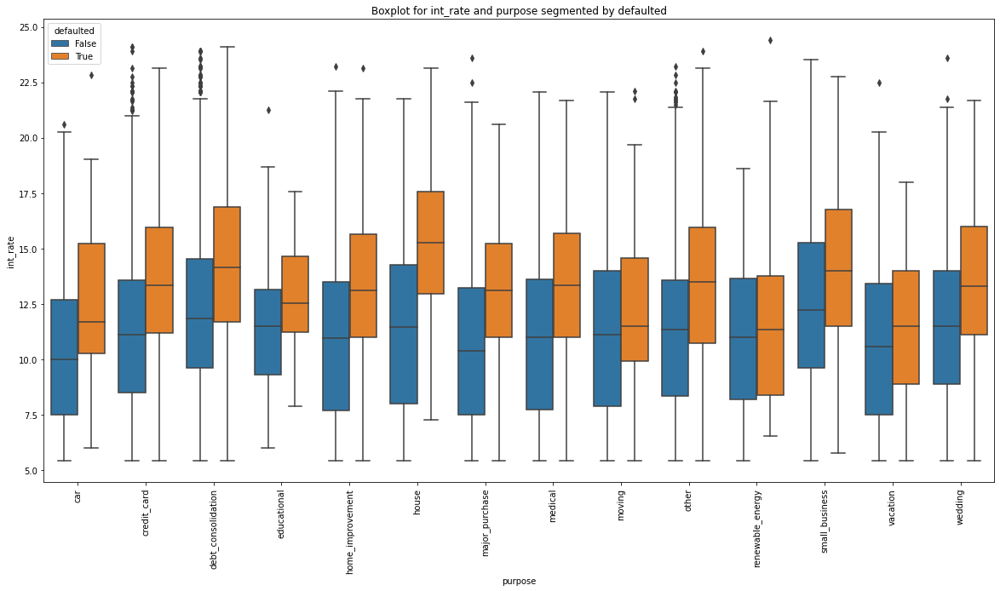

A category provided by the borrower for the loan request. 

***********************************************************************************************************


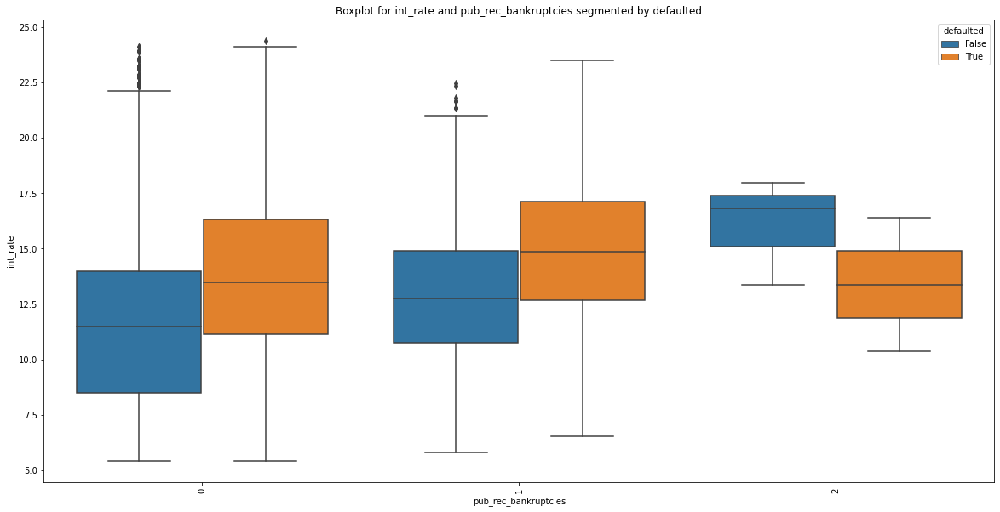

Number of public record bankruptcies

***********************************************************************************************************


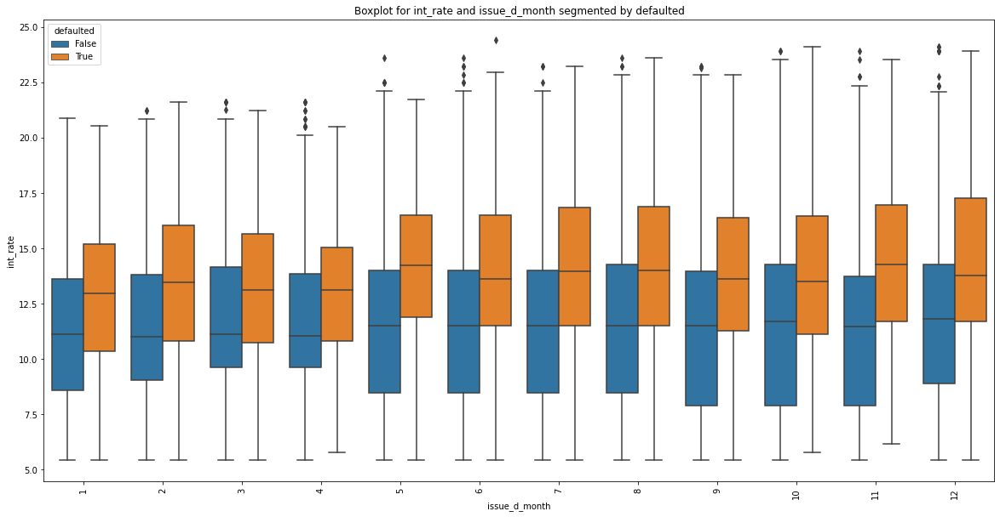

The month which the loan was funded

***********************************************************************************************************


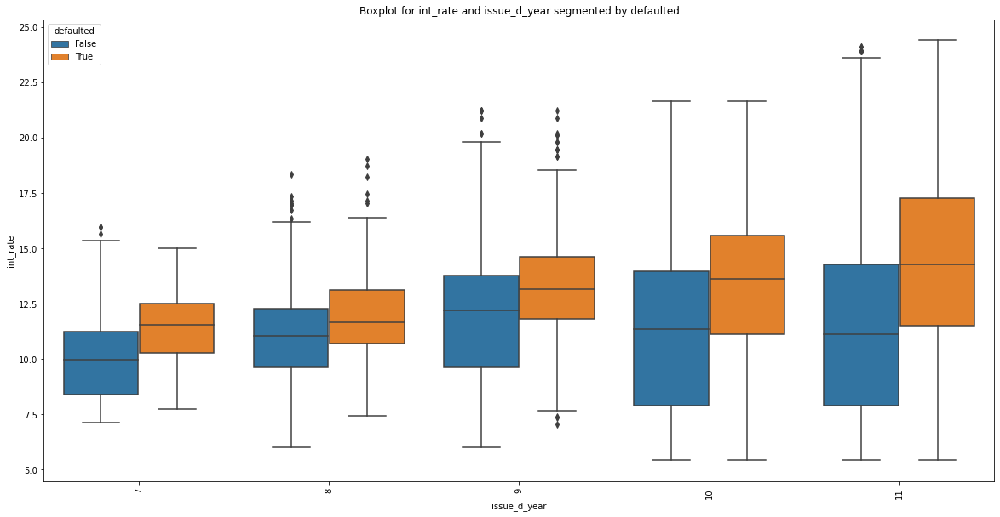

The month which the loan was funded

***********************************************************************************************************


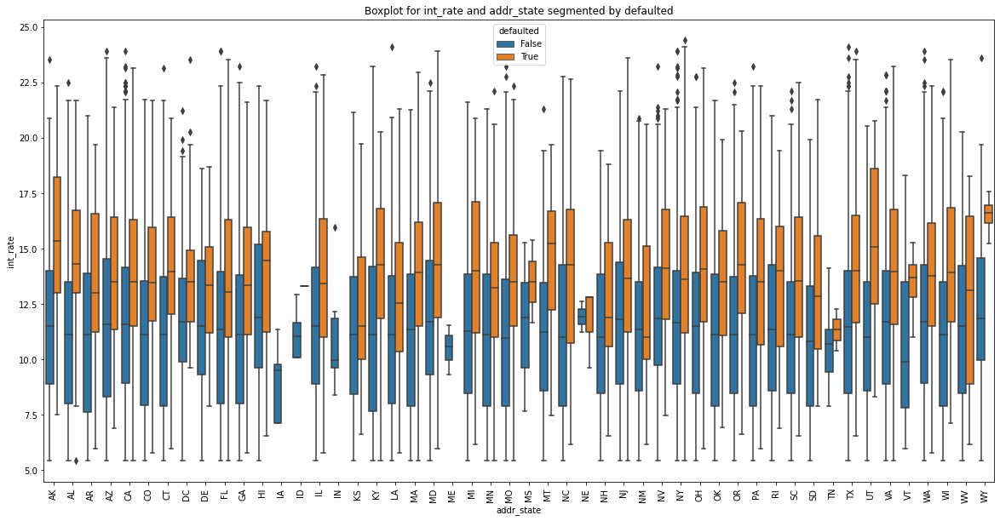

The state provided by the borrower in the loan application

***********************************************************************************************************


In [358]:
for jcol in cat_cols:
    col = 'int_rate'
    col2 = jcol
    plot_multivariate(col,col2)

#### Findings
* Interest rate Increases with term
* Grade Decreases(A-Highest) with inrease in interest rate
* Sub Grade Decreases(A1-Highest) with inrease in interest rate and also the spread increases
* Overall the defaulted loand spread is over higher interest rate for each categorical column

#### Recomendations
* Borrowers with higher interest rate have defaulted
* ***Borrowers with lower interest rate and 2 public bankurpties have defaulted***

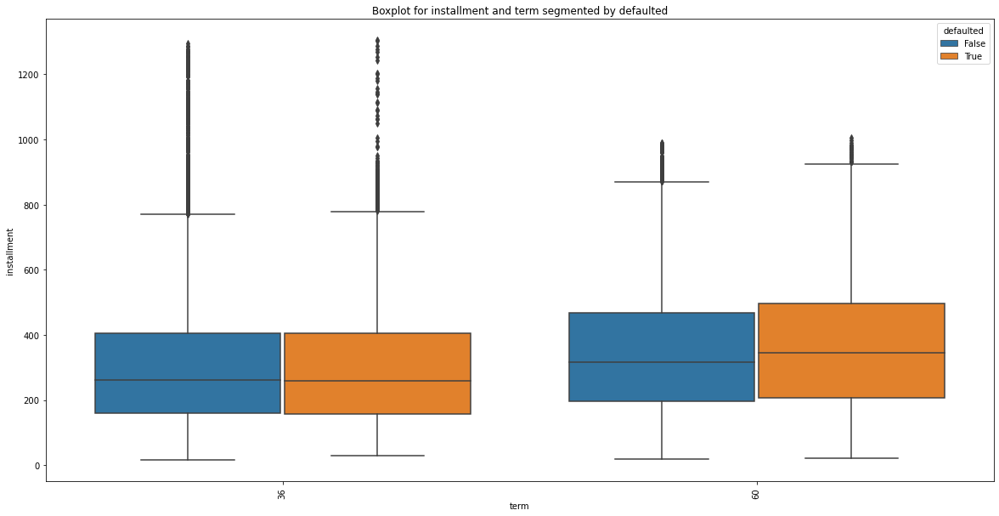

The number of payments on the loan. Values are in months and can be either 36 or 60.

***********************************************************************************************************


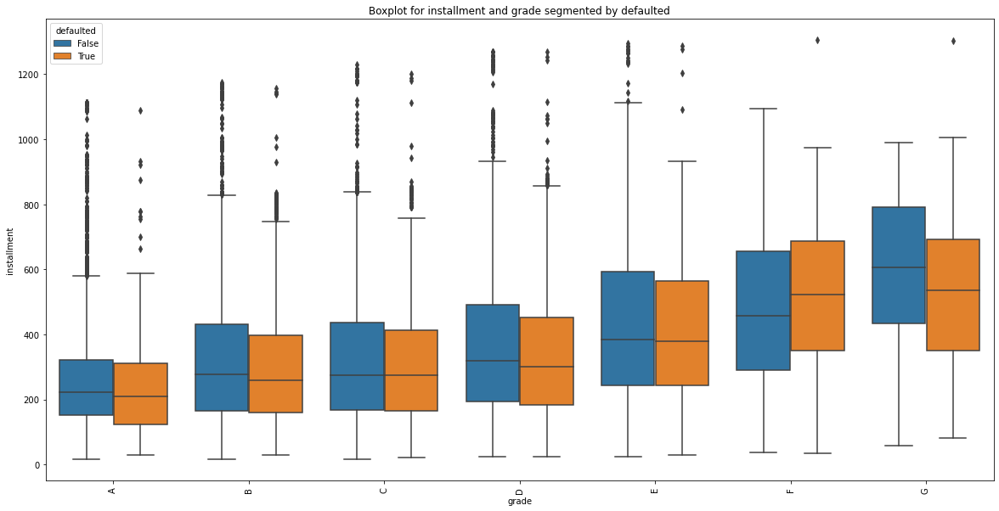

LC assigned loan grade

***********************************************************************************************************


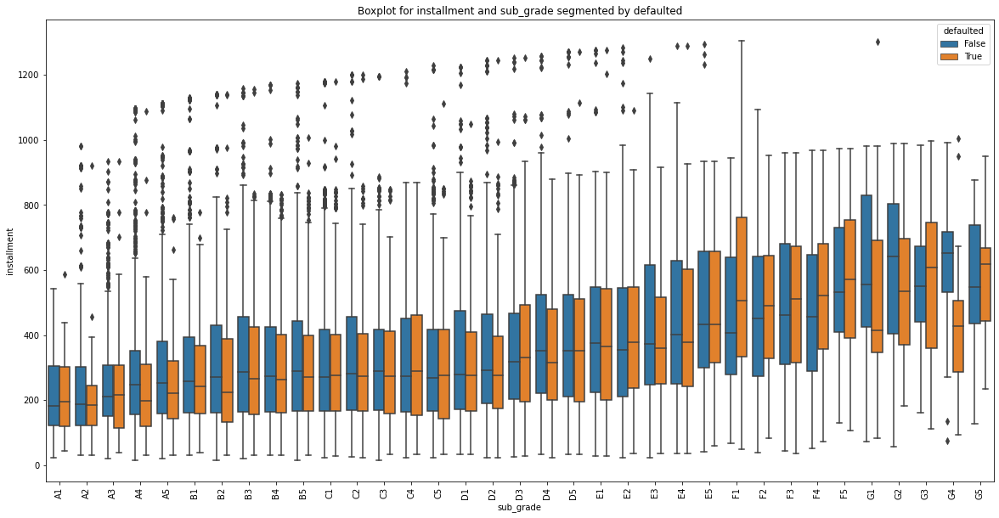

LC assigned loan subgrade

***********************************************************************************************************


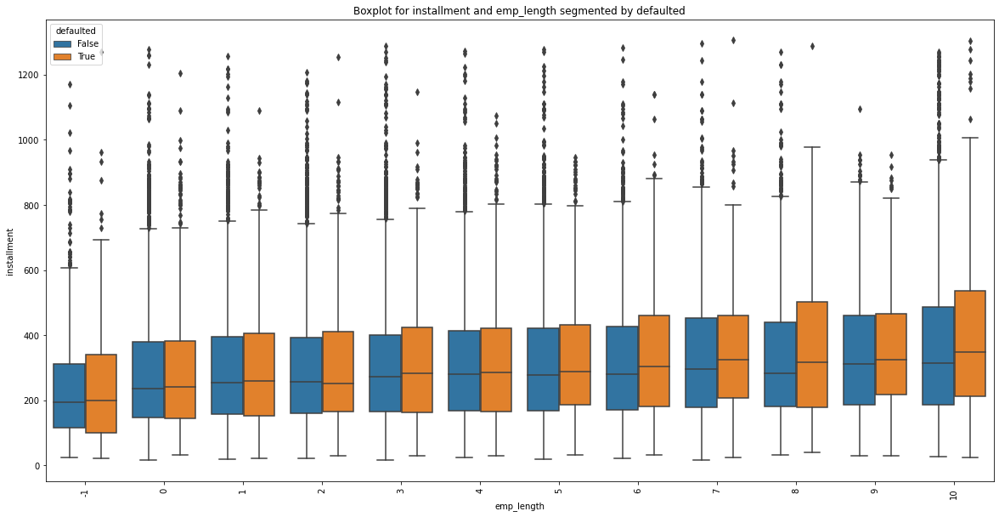

Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

***********************************************************************************************************


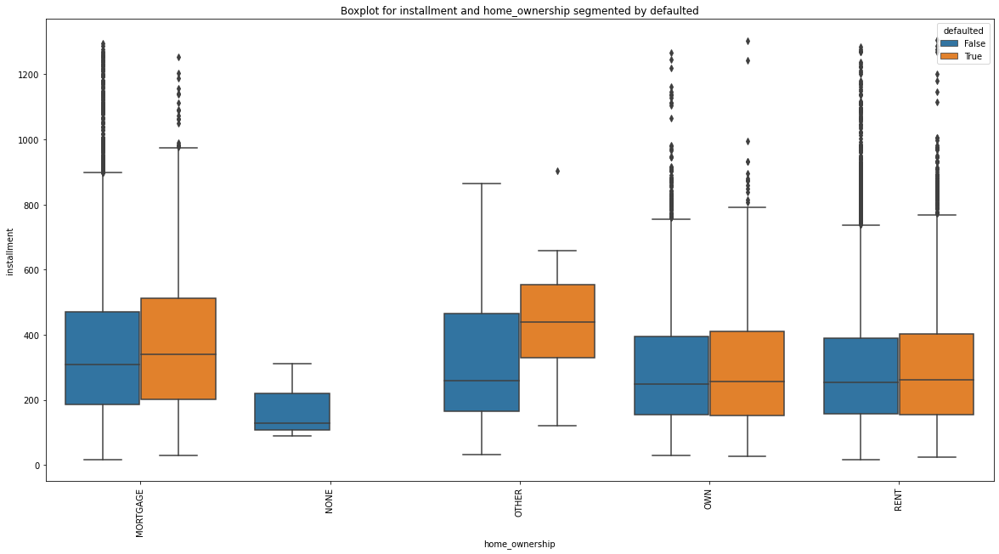

The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

***********************************************************************************************************


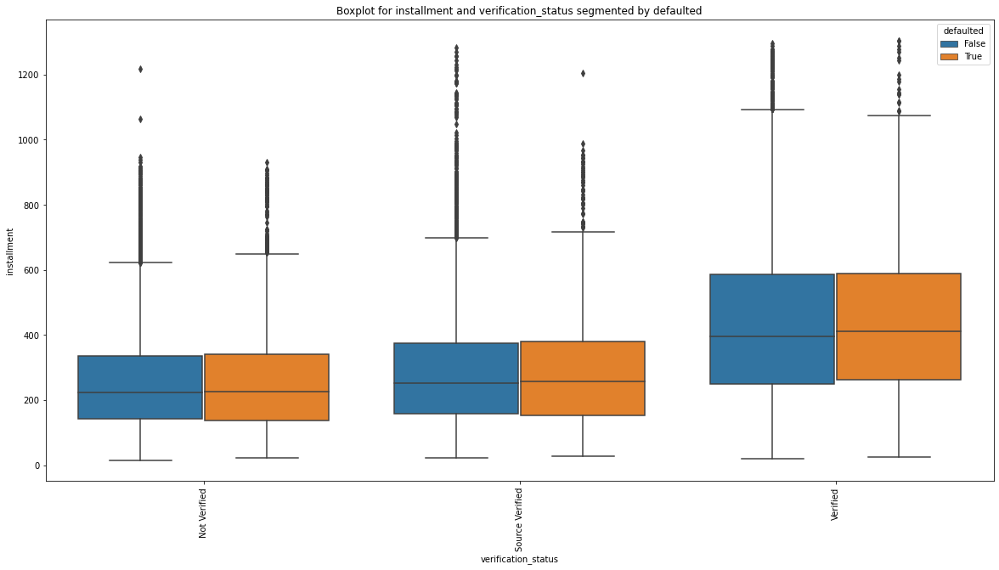

Indicates if income was verified by LC, not verified, or if the income source was verified

***********************************************************************************************************


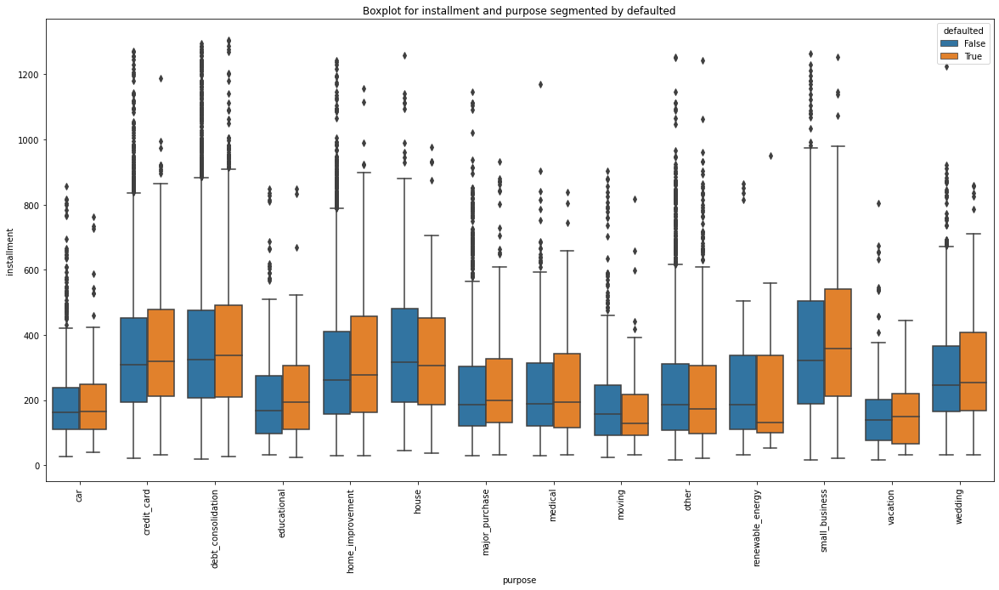

A category provided by the borrower for the loan request. 

***********************************************************************************************************


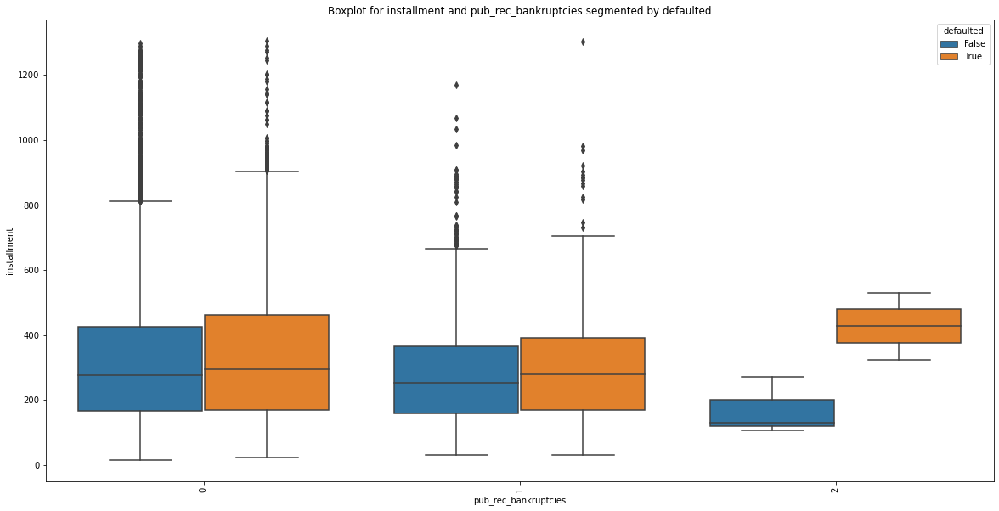

Number of public record bankruptcies

***********************************************************************************************************


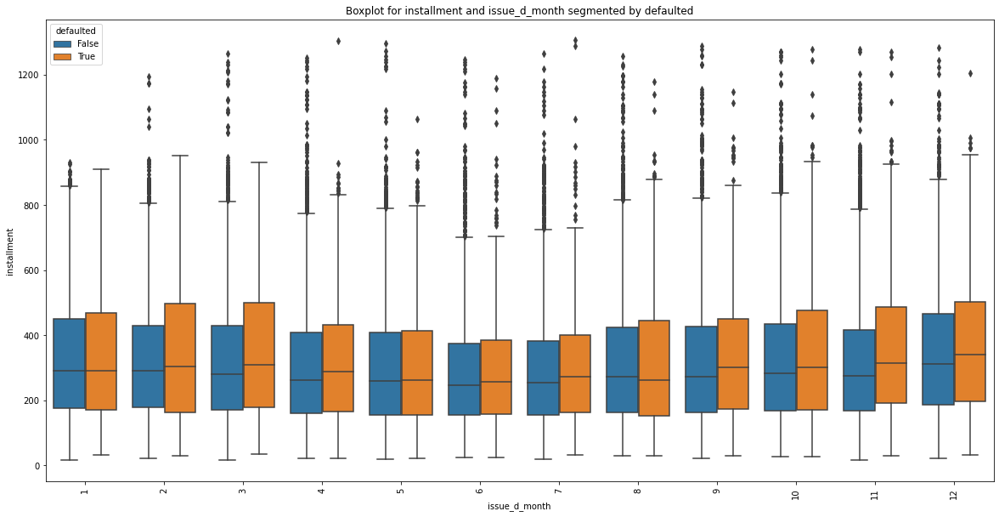

The month which the loan was funded

***********************************************************************************************************


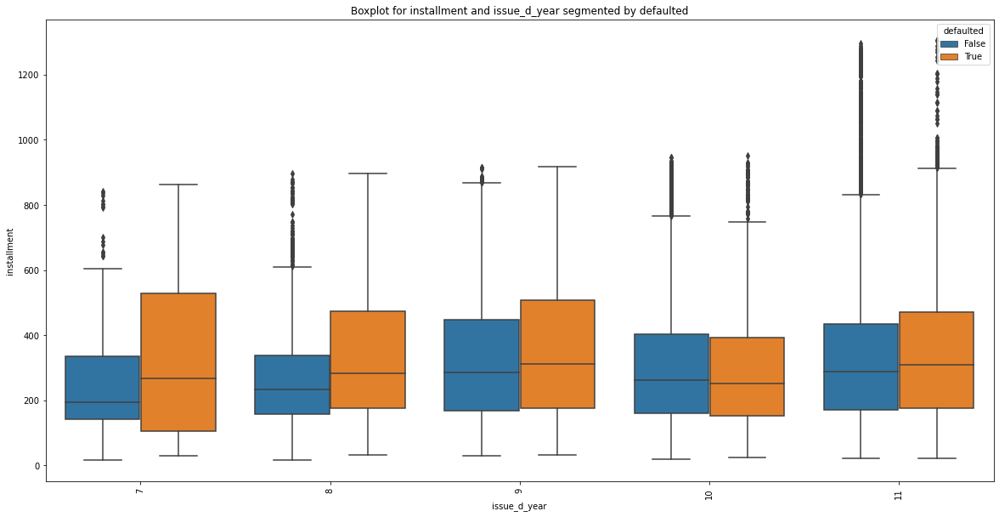

The month which the loan was funded

***********************************************************************************************************


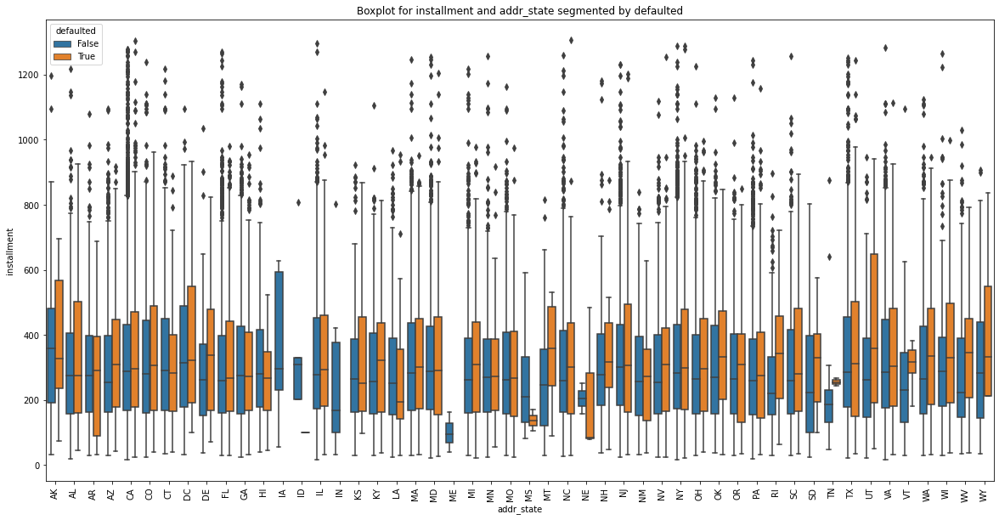

The state provided by the borrower in the loan application

***********************************************************************************************************


In [359]:
for jcol in cat_cols:
    col = 'installment'
    col2 = jcol
    plot_multivariate(col,col2)

#### Findings
* No effect on loan deafaulted

Removing outliers for annual_inc


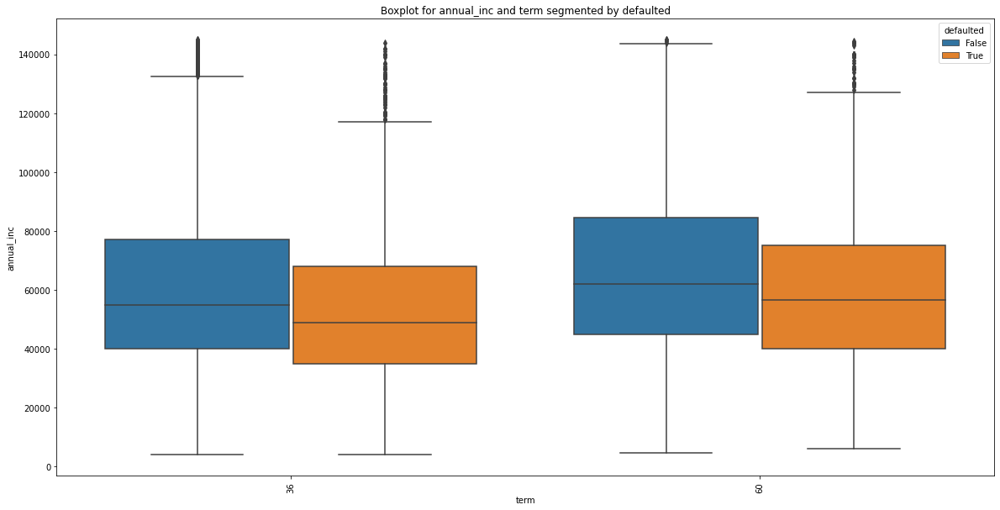

The number of payments on the loan. Values are in months and can be either 36 or 60.

***********************************************************************************************************
Removing outliers for annual_inc


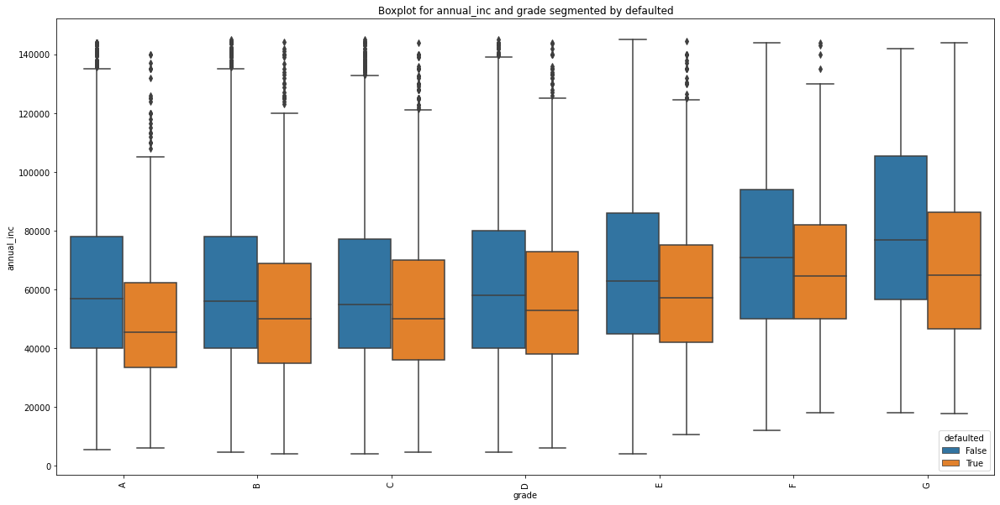

LC assigned loan grade

***********************************************************************************************************
Removing outliers for annual_inc


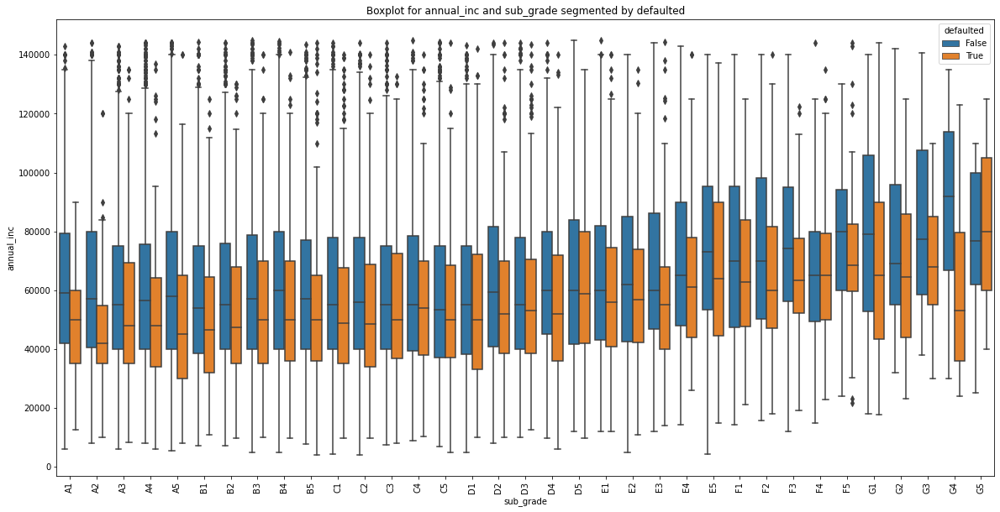

LC assigned loan subgrade

***********************************************************************************************************
Removing outliers for annual_inc


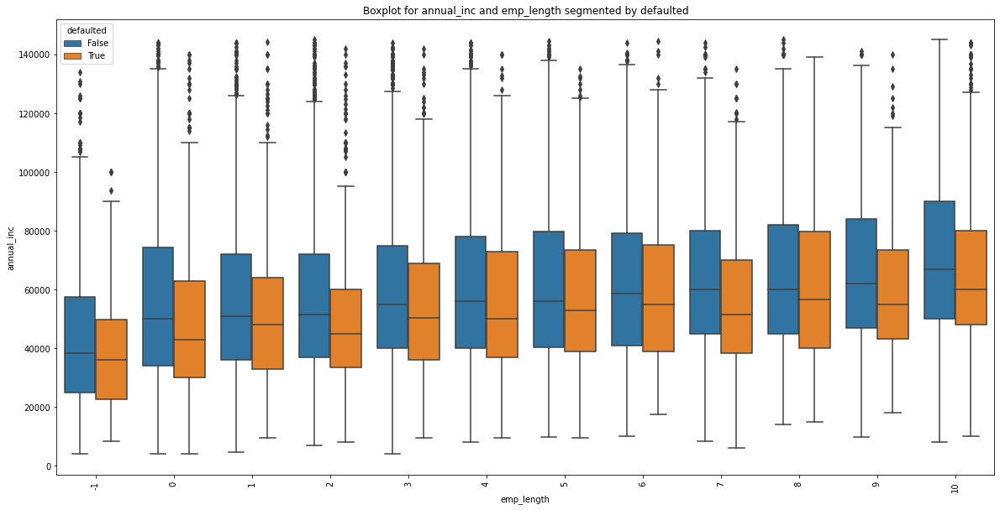

Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

***********************************************************************************************************
Removing outliers for annual_inc


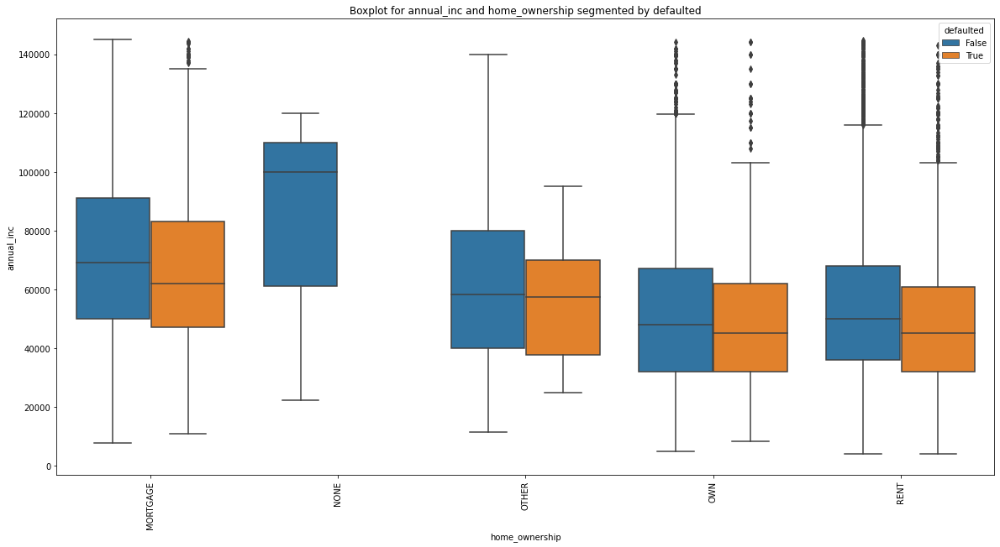

The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

***********************************************************************************************************
Removing outliers for annual_inc


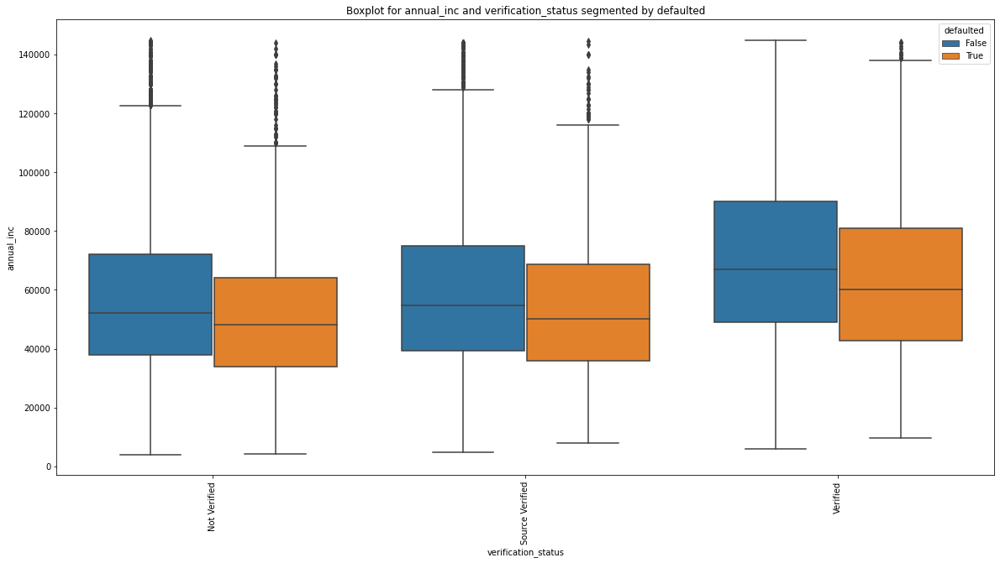

Indicates if income was verified by LC, not verified, or if the income source was verified

***********************************************************************************************************
Removing outliers for annual_inc


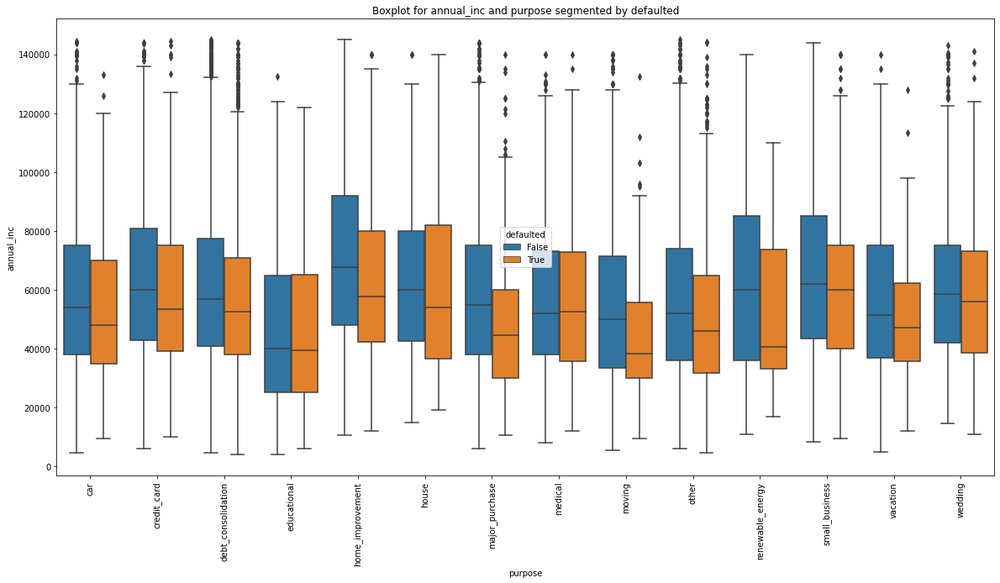

A category provided by the borrower for the loan request. 

***********************************************************************************************************
Removing outliers for annual_inc


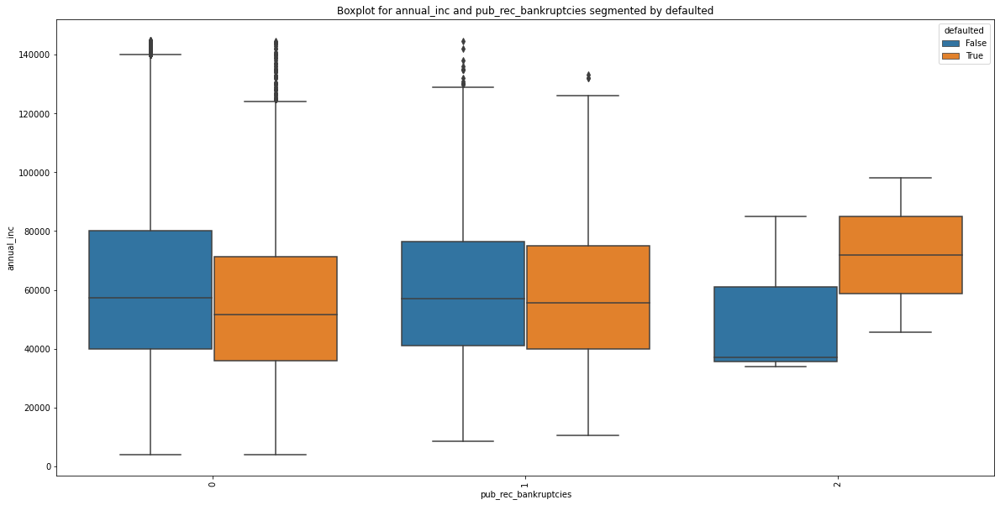

Number of public record bankruptcies

***********************************************************************************************************
Removing outliers for annual_inc


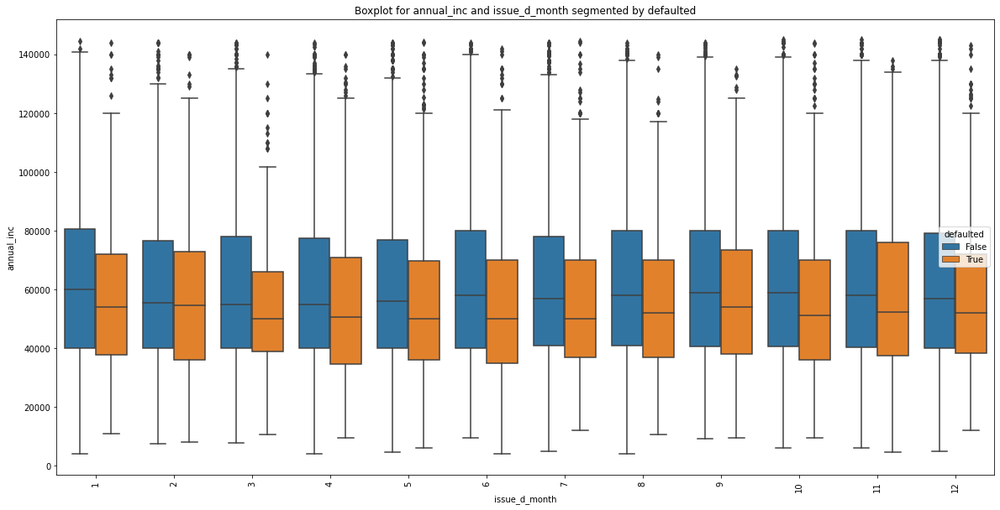

The month which the loan was funded

***********************************************************************************************************
Removing outliers for annual_inc


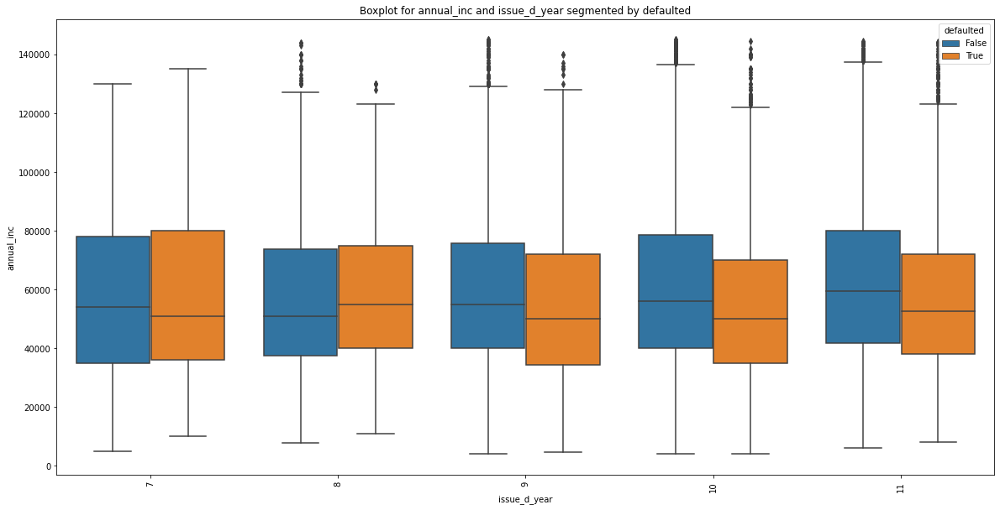

The month which the loan was funded

***********************************************************************************************************
Removing outliers for annual_inc


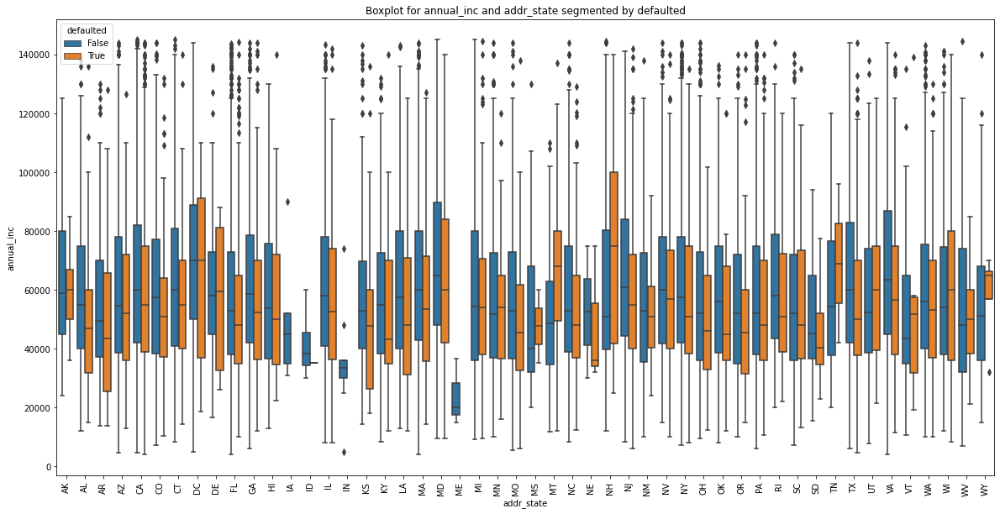

The state provided by the borrower in the loan application

***********************************************************************************************************


In [360]:
for jcol in cat_cols:
    col = 'annual_inc'
    col2 = jcol
    plt.figure(figsize=(20,10))
    sns.boxplot(x=df[col2],y=remove_outliers_series(df[col]),hue=df["defaulted"],orient="v",order=sorted(df[col2].unique()))
    plt.title("Boxplot for "+col+" and "+col2+" segmented by defaulted")
    plt.xticks(rotation=90)
    plt.show()
    print(df_dict[df_dict.LoanStatNew == col2].iloc[0,1])
    print()
    print("***********************************************************************************************************")

#### Findings
* Borrowers have defaulted with low annual income
* Borrowers have defaulted with high annual income and 2 public bankrupties 

#### Recomendations
* check if he can pay the emi with the annual income
* reject loans with high annual income and 2 public bankrupties 

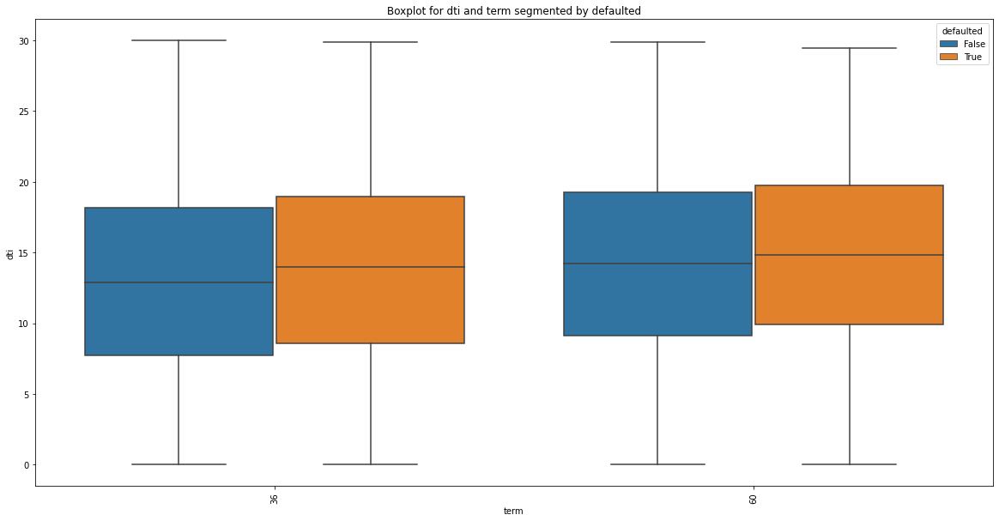

The number of payments on the loan. Values are in months and can be either 36 or 60.

***********************************************************************************************************


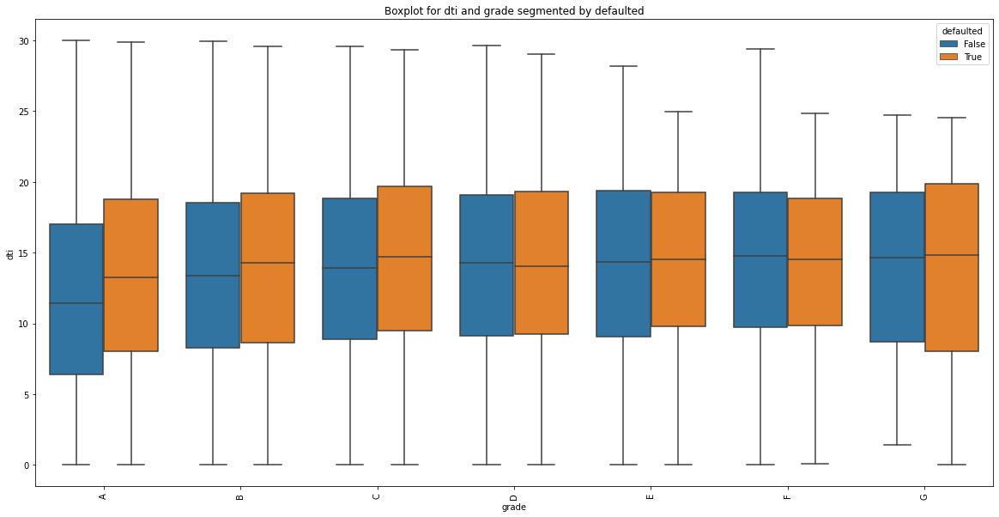

LC assigned loan grade

***********************************************************************************************************


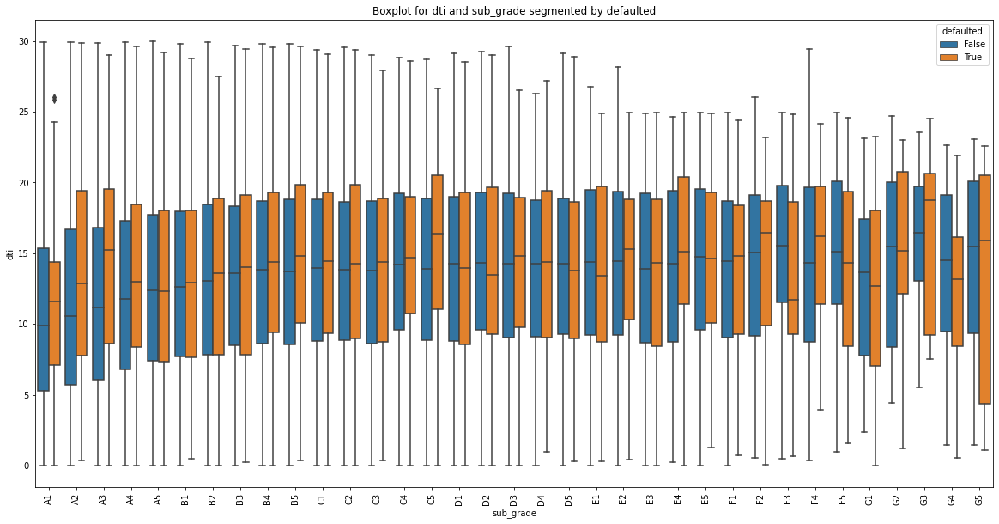

LC assigned loan subgrade

***********************************************************************************************************


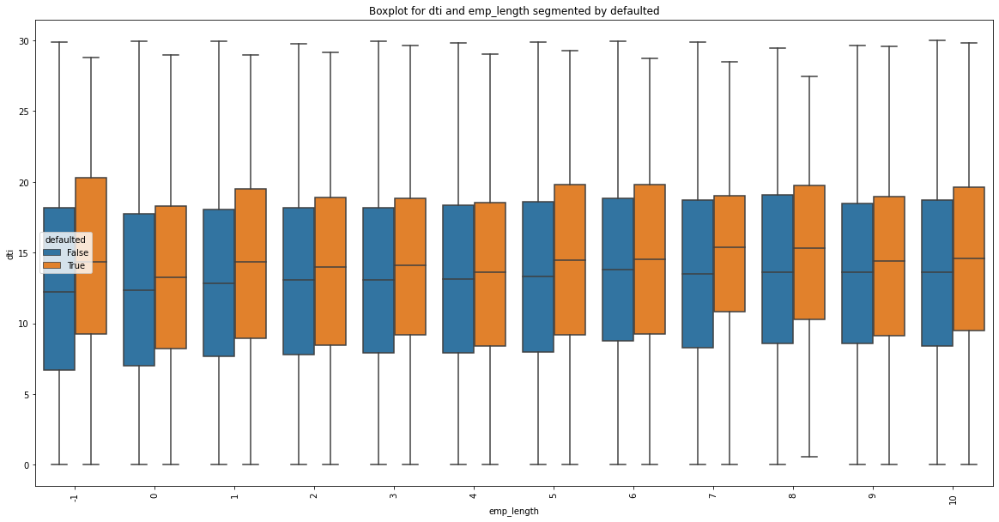

Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

***********************************************************************************************************


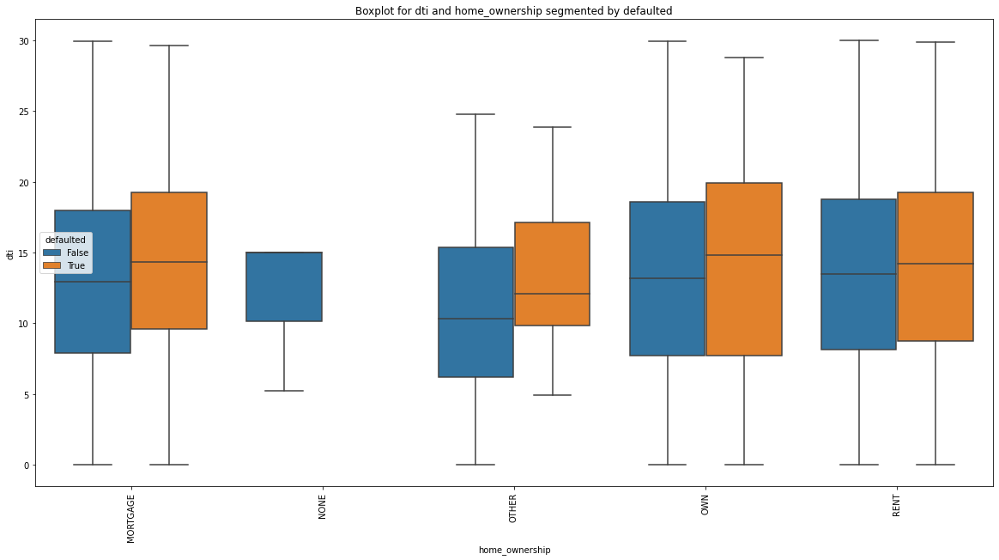

The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

***********************************************************************************************************


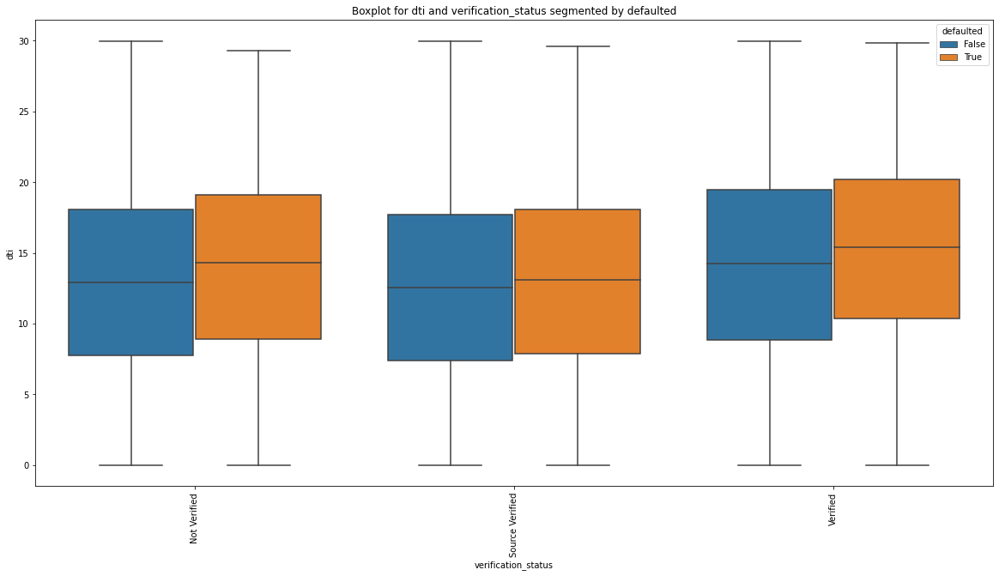

Indicates if income was verified by LC, not verified, or if the income source was verified

***********************************************************************************************************


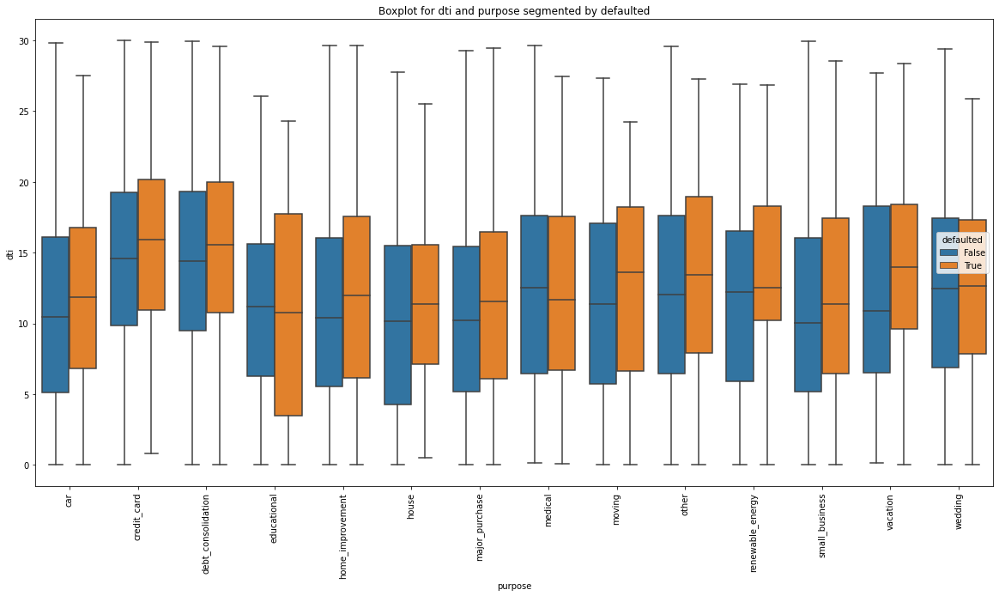

A category provided by the borrower for the loan request. 

***********************************************************************************************************


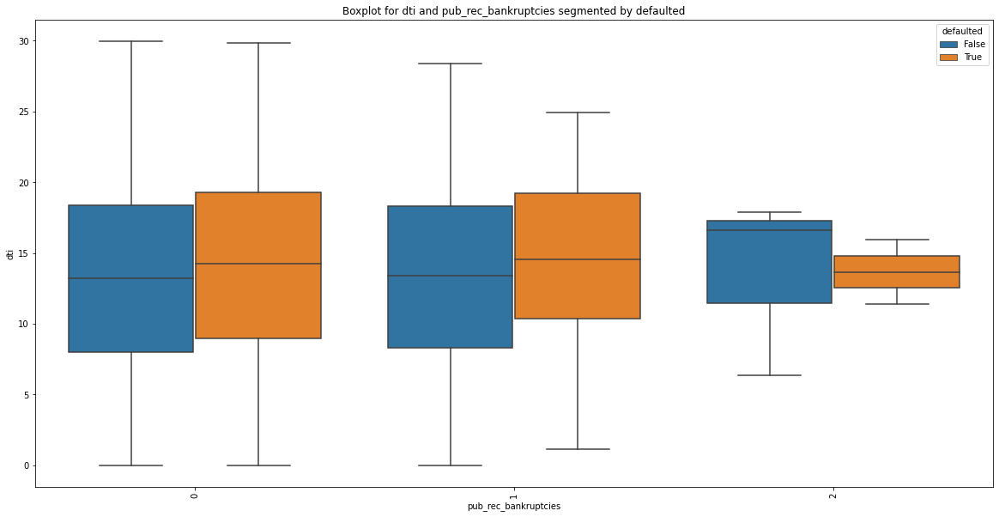

Number of public record bankruptcies

***********************************************************************************************************


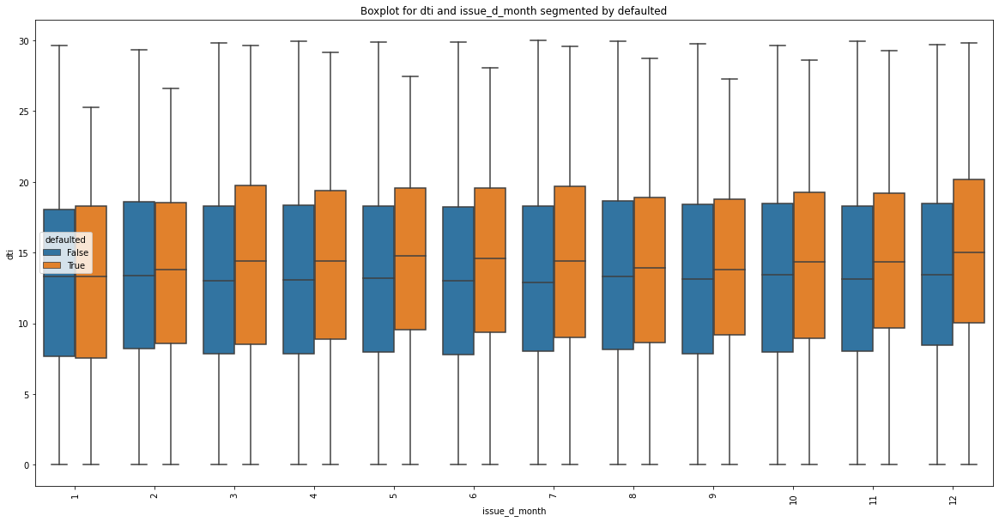

The month which the loan was funded

***********************************************************************************************************


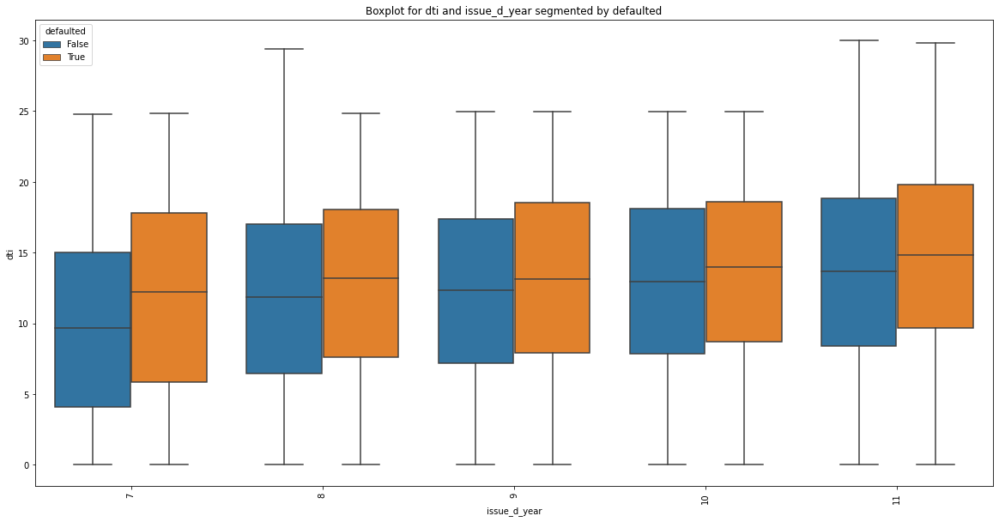

The month which the loan was funded

***********************************************************************************************************


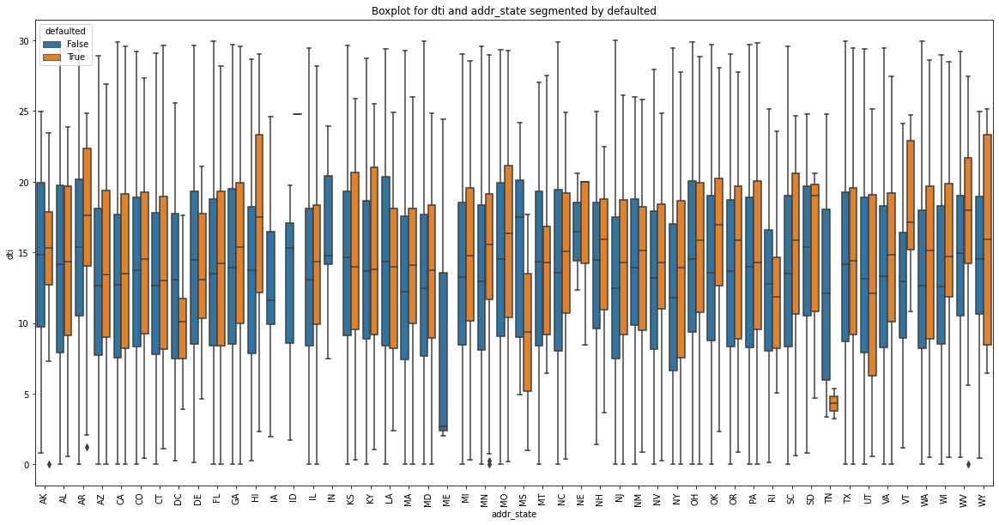

The state provided by the borrower in the loan application

***********************************************************************************************************


In [361]:
for jcol in cat_cols:
    col = 'dti'
    col2 = jcol
    plot_multivariate(col,col2)

#### Findings
* No effect on loan deafaulted

### Multivarite Alalysis for two Continuous Variable and Defaulted Loans 

In [362]:
def plot_multivariate_continuous(col1,col2):
    plt.figure(figsize=(20,8))
    sns.boxplot(x=pd.cut(df[col2], annual_inc_bins),y=df[col1],hue=df["defaulted"],orient="v")
    plt.title("Barplot for percentage of loan defautled for "+col2)
    plt.ylabel("Default Percent %")
    plt.xlabel(col2)
    plt.xticks(rotation=90)
    plt.show()
    print(df_dict[df_dict.LoanStatNew == col2].iloc[0,1])
    print()
    print("*****************************************************************************************")

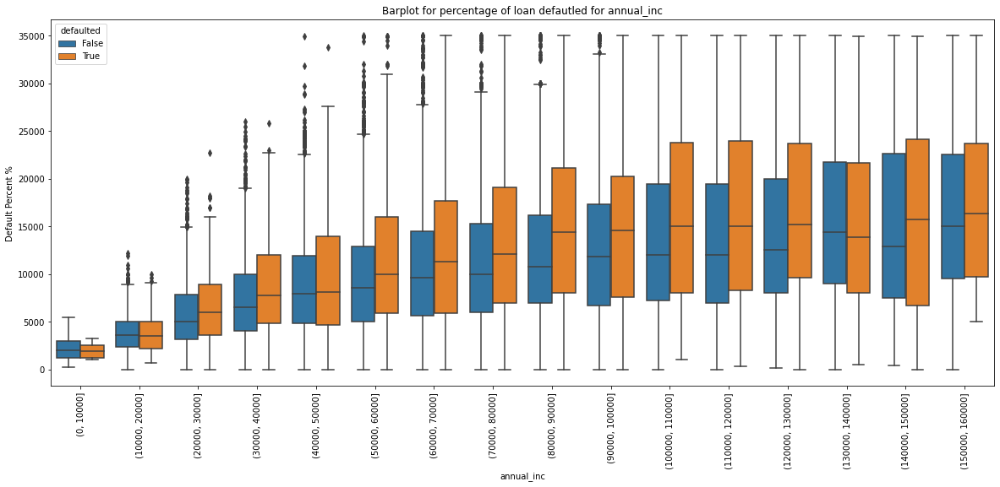

The self-reported annual income provided by the borrower during registration.

*****************************************************************************************


In [363]:
col1='funded_amnt_inv'
col2='annual_inc'
plot_multivariate_continuous(col1,col2)

In [364]:
other_cols

['emp_title', 'zip_code']

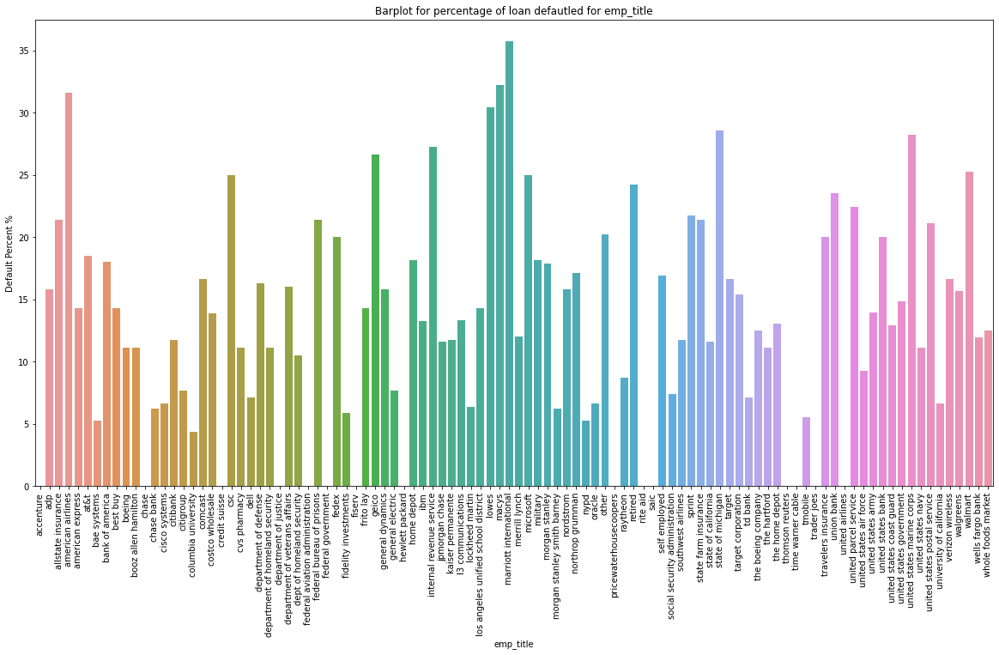

The job title supplied by the Borrower when applying for the loan.*

***********************************************************************************************************


In [365]:
col1='defaulted'
col2='emp_title'
bins = df.emp_title.value_counts().head(100).index
newdf = pd.DataFrame()
newdf[col1] = df[df[col2].isin(bins)][col1]
newdf[col2] = df[df[col2].isin(bins)][col2]
plt.figure(figsize=(20,10))
sns.barplot(y=default_percentage(newdf,col2).values,x=default_percentage(newdf,col2).index,orient="v")
plt.title("Barplot for percentage of loan defautled for "+col2)
plt.ylabel("Default Percent %")
plt.xlabel(col2)
plt.xticks(rotation=90)
plt.show()
print(df_dict[df_dict.LoanStatNew == col2].iloc[0,1])
print()
print("***********************************************************************************************************")

In [366]:
col1='defaulted'
col2='emp_title'
bins = df.emp_title.value_counts().head(20).index
newdf = pd.DataFrame()
newdf[col1] = df[df[col2].isin(bins)][col1]
newdf[col2] = df[df[col2].isin(bins)][col2]
default_percentage(newdf,col2).sort_values(ascending = False).head()

walmart                         25.242718
united parcel service           22.448980
united states postal service    21.118012
other                           20.243085
at&t                            18.478261
Name: emp_title, dtype: float64

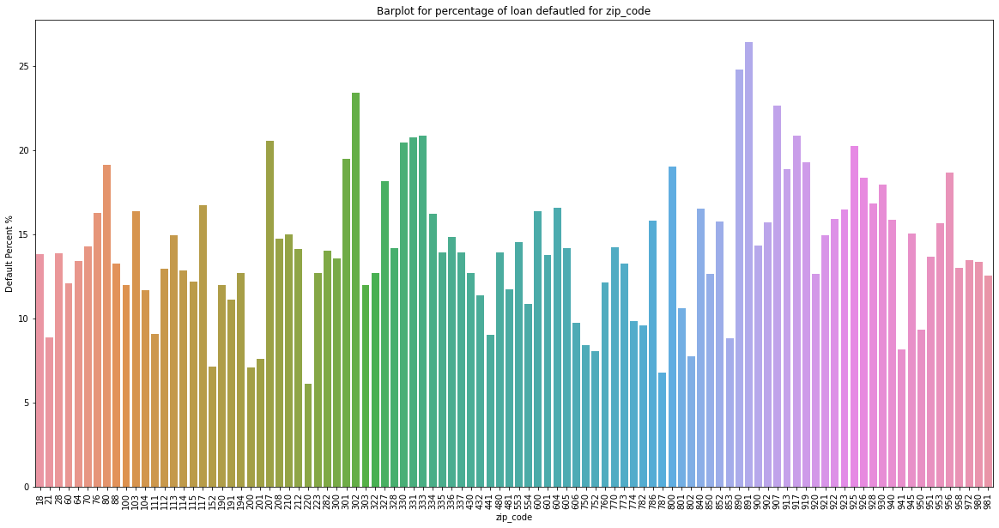

The first 3 numbers of the zip code provided by the borrower in the loan application.

***********************************************************************************************************


In [367]:
col1='defaulted'
col2='zip_code'
bins = df[col2].value_counts().head(100).index
newdf = pd.DataFrame()
newdf[col1] = df[df[col2].isin(bins)][col1]
newdf[col2] = df[df[col2].isin(bins)][col2]
plt.figure(figsize=(20,10))
sns.barplot(y=default_percentage(newdf,col2).values,x=default_percentage(newdf,col2).index,orient="v")
plt.title("Barplot for percentage of loan defautled for "+col2)
plt.ylabel("Default Percent %")
plt.xlabel(col2)
plt.xticks(rotation=90)
plt.show()
print(df_dict[df_dict.LoanStatNew == col2].iloc[0,1])
print()
print("***********************************************************************************************************")

In [368]:
6
col1='defaulted'
col2='zip_code'
bins = df[col2].value_counts().head(20).index
newdf = pd.DataFrame()
newdf[col1] = df[df[col2].isin(bins)][col1]
newdf[col2] = df[df[col2].isin(bins)][col2]
default_percentage(newdf,col2).sort_values(ascending = False).head()

917    20.882353
331    20.771513
330    20.481928
913    18.867925
926    18.356164
Name: zip_code, dtype: float64

#### Findings
* No effect on loan deafaulted

## Correation Matrix

In [369]:
df.corr()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,annual_inc,zip_code,dti,mths_since_last_delinq,pub_rec_bankruptcies,issue_d_month,issue_d_year,defaulted
loan_amnt,1.000000,0.981803,0.937962,0.346534,0.301277,0.932282,0.157556,0.269028,-0.000336,0.062427,-0.044677,-0.035157,0.051859,0.109800,0.059339
funded_amnt,0.981803,1.000000,0.956177,0.324805,0.304971,0.958038,0.157250,0.264805,-0.000501,0.062168,-0.043083,-0.036209,0.041798,0.120819,0.056442
funded_amnt_inv,0.937962,0.956177,1.000000,0.343861,0.297525,0.905468,0.165634,0.251974,-0.000142,0.070637,-0.044814,-0.036352,0.068004,0.252299,0.037762
term,0.346534,0.324805,0.343861,1.000000,0.440213,0.090380,0.102752,0.043898,-0.010667,0.076198,0.007139,0.016710,0.033155,0.237770,0.173324
int_rate,0.301277,0.304971,0.297525,0.440213,1.000000,0.277256,0.013926,0.048990,0.012280,0.111110,0.168851,0.084058,0.025228,0.039464,0.211419
installment,0.932282,0.958038,0.905468,0.090380,0.277256,1.000000,0.132926,0.267838,0.004189,0.052007,-0.028787,-0.033063,0.029377,0.053024,0.027132
emp_length,0.157556,0.157250,0.165634,0.102752,0.013926,0.132926,1.000000,0.121785,-0.011788,0.050454,0.040416,0.045862,0.019820,0.094763,0.006169
annual_inc,0.269028,0.264805,0.251974,0.043898,0.048990,0.267838,0.121785,1.000000,-0.004619,-0.121571,0.018945,-0.015969,0.008958,0.008521,-0.040874
zip_code,-0.000336,-0.000501,-0.000142,-0.010667,0.012280,0.004189,-0.011788,-0.004619,1.000000,0.017973,-0.000271,0.032590,0.006169,0.013084,0.017509
dti,0.062427,0.062168,0.070637,0.076198,0.111110,0.052007,0.050454,-0.121571,0.017973,1.000000,-0.016153,0.007299,0.014234,0.092852,0.045085


<AxesSubplot:>

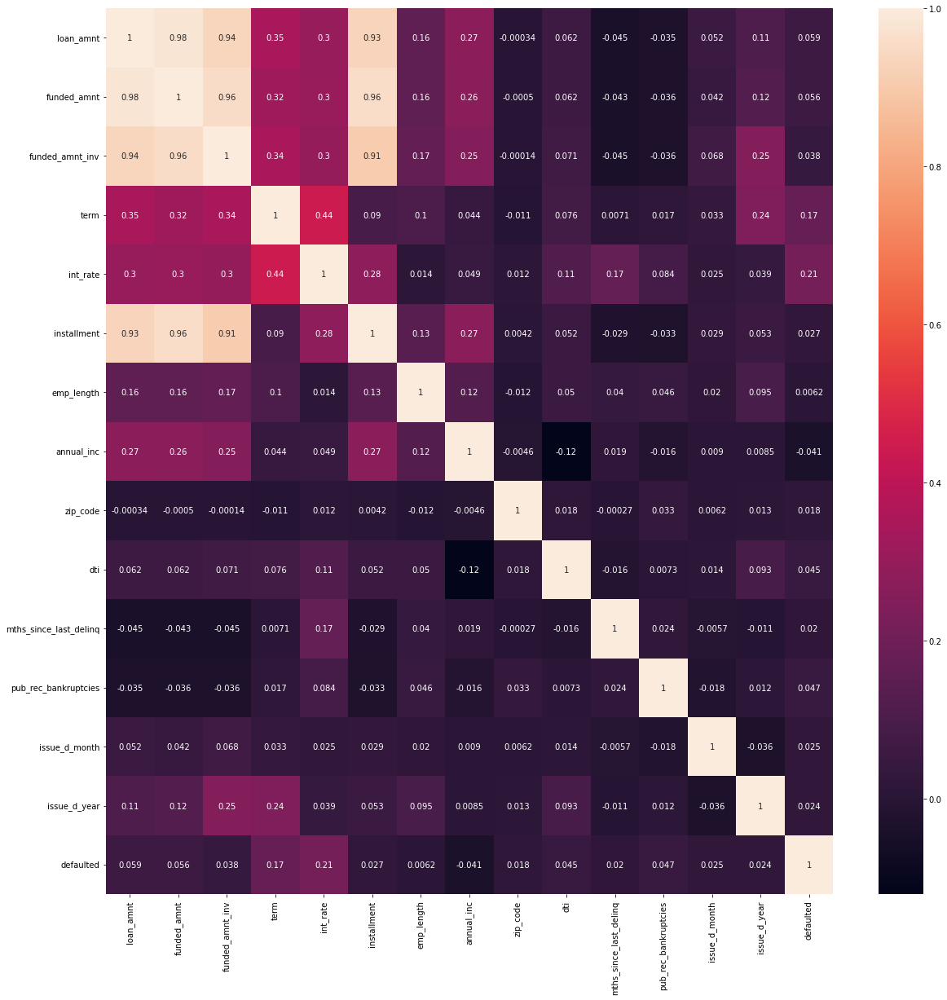

In [370]:
plt.figure(figsize=(20,20))
sns.heatmap(data=df.corr(),annot=True)

#### Findings
* Term and interest rate have the highest corretion with the defaulted loan with 0.17 and 0.21 coefficient 

# Final Conclusion for the Loan Lending Club Case Study

<div class="alert alert-block alert-danger">
    <span style='font-family:Georgia'>
        <b>Factor whether an applicant will be Defaulter: </b> <br><br>
        <b>Continuous Variable: </b>
        <ol>
            <li>LOAN_AMOUNT : Loan amount greater than 15000 dollors have higher default rate</li>
            <li>FUNDED_AMOUNT : Funded amount greater than 15000 dollors have higher default rate</li>
            <li>FUNDED_AMOUNT_INVESTED : Funded amount invested greater than 15000 dollors have higher default rate</li>
            <li>INTEREST_RATE : As Interest rate increases the default rate increases steeply<br>
                (5, 10]-> 6.739748%<br>
                (10, 15]-> 14.820089%<br>
                (15, 20]-> 24.826918% <br>
                (20, 25]-> 38.441558%</li>
            <li>ANNUAL_INCOME : As the annual income increase the default rate decreases</li>
            <li>DTI : As dti increase the default rate increases</li>
            <li>MONTHS_SINCE_LAST_DELINQ  : Crime committed between 90 to 110 days have higher default percent</li>
        </ol>
        <b>Categorical Variable: </b>
        <ol>
            <li>TERM : 60 months term have a higher default rate than 36 months term</li>
            <li>GRADE : As the Grade decreases (A B C D E F G) default rate increases </li>
            <li>SUB_GRADE : As the Sub Grade decreases (A1 A2 B1 B2.....) default rate increases</li>
            <li>VERIFICATION STATUS : Percent of loan defaulted is higher for verifed borrowers</li>
            <li>PURPOSE : Small business borrowers have high default rate</li>
            <li>PUBLIC_BAKRUPTIES_RECORD : One or more pubilc bankruptices have higher default rate</li>
            <li>STATE : Percent of loan defaulted is very high for state NE and high for NV and SD</li>
            <li>EMPLOYEE TITLE : The following have the highest default rate among the top 20 title by frequency:<br>
                walmart                         -> 25.242718%<br>
                united parcel service           -> 22.448980%<br>
                united states postal service    -> 21.118012%<br>
                other                           -> 20.243085%<br>
                at&t                            -> 18.47826%</li>
            <li>ZIP CODE : The following have the highest default rate among the top 20 zip code by frequency:<br>
                917xx    -> 20.882353%<br>
                331xx    -> 20.771513%<br>
                330xx    -> 20.481928%<br>
                913xx    -> 18.867925%<br>
                926xx    -> 18.356164%</li>
        </ol>
    </span>    
</div>

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Other suggestions: </b>
        <ul>
            <li>INTEREST RATE AND PUBLIC BANRUPTIES RECORD : Borrowers with lower interest rate and 2 public bankurpties have defaulted</li>
            <li>INSTALLMENT AND PUBLIC BANRUPTIES RECORD : Borrowers with higher installment and 2 public bankurpties have defaulted</li>
            <li>ANNUAL INCONE AND PUBLIC BANRUPTIES RECORD : Borrowers with higher Income and 2 public bankurpties have defaulted</li>
        </ul>
    </span>    
</div>

# Final Recommendation

<div class="alert alert-block alert-success">
    <span style='font-family:Georgia'>
        <b>Decisive Factor whether an applicant will be Defaulter:</b> 
        <ul>
            <li>FUNDED_AMOUNT_INVESTED</li>
            <li>INTEREST_RATE</li>
            <li>ANNUAL_INCOME</li>
            <li>DTI</li>
            <li>TERM</li>
            <li>GRADE</li>
            <li>SUB_GRADE</li>
            <li>PURPOSE</li>
            <li>PUBLIC_BAKRUPTIES_RECORD</li>
        </ul>
    </span>    
</div>

<div class="alert alert-block alert-warning">
    <span style='font-family:Georgia'>
        <b>Factor that may or may not determine whether an applicant will be Defaulter:</b> 
        <ul>
            <li>MONTHS_SINCE_LAST_DELINQ</li>
            <li>PURPOSE</li>
            <li>STATE</li>
            <li>EMPLOYEE TITLE</li>
            <li>ZIP CODE</li>
        </ul>
    </span>    
</div>